In [11]:
# Importing Necessary Libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

%matplotlib inline

import time
from sklearn.ensemble import IsolationForest
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.seasonal import seasonal_decompose


import warnings
warnings.filterwarnings("ignore")


In [12]:
o_data = pd.read_csv('HomeC14.csv')
data = o_data.copy()

In [13]:
data

,time,use [kW],gen [kW],House overall [kW],Dishwasher [kW],Furnace 1 [kW],Furnace 2 [kW],Home office [kW],Fridge [kW],Garage door [kW],...,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
0,1451624400,0.932833,0.003483,0.932833,0.000033,0.020700,0.061917,0.442633,0.124150,0.013083,...,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00
1,1451624401,0.934333,0.003467,0.934333,0.000000,0.020717,0.063817,0.444067,0.124000,0.013117,...,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00
2,1451624402,0.931817,0.003467,0.931817,0.000017,0.020700,0.062317,0.446067,0.123533,0.013083,...,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00
3,1451624403,1.022050,0.003483,1.022050,0.000017,0.106900,0.068517,0.446583,0.123133,0.013000,...,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00
4,1451624404,1.139400,0.003467,1.139400,0.000133,0.236933,0.063983,0.446533,0.122850,0.012783,...,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503906,1452128306,1.599333,0.003233,1.599333,0.000050,0.104017,0.625033,0.041750,0.005233,0.013433,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51
503907,1452128307,1.924267,0.003217,1.924267,0.000033,0.422383,0.637733,0.042033,0.004983,0.012933,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51
503908,1452128308,1.978200,0.003217,1.978200,0.000050,0.495667,0.620367,0.042100,0.005333,0.012817,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51
503909,1452128309,1.990950,0.003233,1.990950,0.000050,0.494700,0.634133,0.042100,0.004917,0.012833,...,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503911 entries, 0 to 503910
Data columns (total 29 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   time                 503911 non-null  object 
 1   use [kW]             494522 non-null  float64
 2   gen [kW]             494563 non-null  float64
 3   House overall [kW]   503910 non-null  float64
 4   Dishwasher [kW]      503910 non-null  float64
 5   Furnace 1 [kW]       503910 non-null  float64
 6   Furnace 2 [kW]       503910 non-null  float64
 7   Home office [kW]     503910 non-null  float64
 8   Fridge [kW]          503910 non-null  float64
 9   Garage door [kW]     503910 non-null  float64
 10  Kitchen [kW]         503910 non-null  float64
 11  Kitchenette [kW]     503910 non-null  float64
 12  Well [kW]            503910 non-null  float64
 13  Microwave [kW]       503910 non-null  float64
 14  Living room [kW]     503910 non-null  float64
 15  Solar [kW]       

In [15]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
use [kW],494522.0,0.859238,1.058680,0.000000,0.367283,0.562375,0.971817,14.714567
gen [kW],494563.0,0.075983,0.128222,0.000000,0.003367,0.004300,0.083283,0.613883
House overall [kW],503910.0,0.858962,1.058207,0.000000,0.367667,0.562333,0.970250,14.714567
Dishwasher [kW],503910.0,0.031368,0.190951,0.000000,0.000000,0.000017,0.000233,1.401767
Furnace 1 [kW],503910.0,0.099210,0.169059,0.000017,0.020233,0.020617,0.068733,1.934083
Furnace 2 [kW],503910.0,0.136779,0.178631,0.000067,0.064400,0.066633,0.080633,0.794933
Home office [kW],503910.0,0.081287,0.104466,0.000083,0.040383,0.042217,0.068283,0.971750
Fridge [kW],503910.0,0.063556,0.076199,0.000067,0.005083,0.005433,0.125417,0.851267
Garage door [kW],503910.0,0.014139,0.014292,0.000017,0.012733,0.012933,0.013100,1.088983
Kitchen [kW],503910.0,0.002755,0.021860,0.000000,0.000500,0.000667,0.000750,1.166583


In [16]:
pd.set_option('display.max_columns', None)
data.columns

Index(['time', 'use [kW]', 'gen [kW]', 'House overall [kW]', 'Dishwasher [kW]',
       'Furnace 1 [kW]', 'Furnace 2 [kW]', 'Home office [kW]', 'Fridge [kW]',
       'Garage door [kW]', 'Kitchen [kW]', 'Kitchenette [kW]', 'Well [kW]',
       'Microwave [kW]', 'Living room [kW]', 'Solar [kW]', 'temperature',
       'icon', 'humidity', 'visibility', 'summary', 'apparentTemperature',
       'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity',
       'dewPoint', 'precipProbability'],
      dtype='object')

In [17]:
data.columns = [col.replace(' [kW]', '') for col in data.columns]

In [18]:
data.shape

(503911, 29)

In [19]:
data['Furnace'] = data[['Furnace 1', 'Furnace 2']].sum(axis=1)
data['Kitchen'] = data[['Kitchen', 'Kitchenette', ]].sum(axis=1)
data

,time,use,gen,House overall,Dishwasher,Furnace 1,Furnace 2,Home office,Fridge,Garage door,Kitchen,Kitchenette,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace
0,1451624400,0.932833,0.003483,0.932833,0.000033,0.020700,0.061917,0.442633,0.124150,0.013083,0.000567,0.000150,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.082617
1,1451624401,0.934333,0.003467,0.934333,0.000000,0.020717,0.063817,0.444067,0.124000,0.013117,0.000567,0.000150,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.084533
2,1451624402,0.931817,0.003467,0.931817,0.000017,0.020700,0.062317,0.446067,0.123533,0.013083,0.000600,0.000167,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.083017
3,1451624403,1.022050,0.003483,1.022050,0.000017,0.106900,0.068517,0.446583,0.123133,0.013000,0.000650,0.000217,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.175417
4,1451624404,1.139400,0.003467,1.139400,0.000133,0.236933,0.063983,0.446533,0.122850,0.012783,0.000783,0.000333,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.300917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503906,1452128306,1.599333,0.003233,1.599333,0.000050,0.104017,0.625033,0.041750,0.005233,0.013433,0.000567,0.000100,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050
503907,1452128307,1.924267,0.003217,1.924267,0.000033,0.422383,0.637733,0.042033,0.004983,0.012933,0.000600,0.000067,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117
503908,1452128308,1.978200,0.003217,1.978200,0.000050,0.495667,0.620367,0.042100,0.005333,0.012817,0.000633,0.000117,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033
503909,1452128309,1.990950,0.003233,1.990950,0.000050,0.494700,0.634133,0.042100,0.004917,0.012833,0.000633,0.000117,0.000950,0.003767,0.000950,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.128833


In [20]:
data.drop(['Furnace 1', 'Furnace 2', 'Kitchenette'], axis=1, inplace=True)
data

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace
0,1451624400,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.013083,0.000567,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.082617
1,1451624401,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.013117,0.000567,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.084533
2,1451624402,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.013083,0.000600,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.083017
3,1451624403,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.013000,0.000650,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.175417
4,1451624404,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.012783,0.000783,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,cloudCover,282.0,0.0000,24.40,0.00,0.300917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503906,1452128306,1.599333,0.003233,1.599333,0.000050,0.041750,0.005233,0.013433,0.000567,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050
503907,1452128307,1.924267,0.003217,1.924267,0.000033,0.042033,0.004983,0.012933,0.000600,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117
503908,1452128308,1.978200,0.003217,1.978200,0.000050,0.042100,0.005333,0.012817,0.000633,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033
503909,1452128309,1.990950,0.003233,1.990950,0.000050,0.042100,0.004917,0.012833,0.000633,0.000950,0.003767,0.000950,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.128833


In [21]:
data['icon'].nunique()

9

In [22]:
data['summary'].unique()

array(['Clear', 'Mostly Cloudy', 'Overcast', 'Partly Cloudy', 'Drizzle',
       'Light Rain', 'Rain', 'Light Snow', 'Flurries', 'Breezy', 'Snow',
       'Rain and Breezy', 'Foggy', 'Breezy and Mostly Cloudy',
       'Breezy and Partly Cloudy', 'Flurries and Breezy', 'Dry',
       'Heavy Snow', nan], dtype=object)

In [23]:
data.isna().sum()

time                       0
use                     9389
gen                     9348
House overall              1
Dishwasher                 1
Home office                1
Fridge                     1
Garage door                1
Kitchen                    0
Well                       1
Microwave                  1
Living room                1
Solar                      1
temperature                1
icon                    6466
humidity                   1
visibility                 1
summary                    1
apparentTemperature    12895
pressure                   1
windSpeed                  1
cloudCover                 1
windBearing                1
precipIntensity            1
dewPoint                   1
precipProbability          1
Furnace                    0
dtype: int64

In [24]:
data.isna().sum()

time                       0
use                     9389
gen                     9348
House overall              1
Dishwasher                 1
Home office                1
Fridge                     1
Garage door                1
Kitchen                    0
Well                       1
Microwave                  1
Living room                1
Solar                      1
temperature                1
icon                    6466
humidity                   1
visibility                 1
summary                    1
apparentTemperature    12895
pressure                   1
windSpeed                  1
cloudCover                 1
windBearing                1
precipIntensity            1
dewPoint                   1
precipProbability          1
Furnace                    0
dtype: int64

In [25]:
data[data.isnull().any(axis=1)]

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace
17,1451624417,0.523167,0.003433,0.523167,0.000000,0.260050,0.004950,0.013083,0.000833,0.001017,0.004250,0.001717,0.003433,36.14,clear-night,0.62,10.0,Clear,NaN,1016.91,9.18,cloudCover,282.0,0.0,24.40,0.0,0.082750
97,1451624497,0.421367,0.003433,0.421367,0.000017,0.043350,0.005433,0.013100,0.000800,0.001000,0.004250,0.001567,0.003433,35.87,partly-cloudy-night,0.61,10.0,Mostly Cloudy,NaN,1016.25,8.29,0.75,285.0,0.0,23.90,0.0,0.083900
118,1451624518,1.016250,0.003467,1.016250,0.000217,0.043533,0.149550,0.012567,0.000617,0.001017,0.004083,0.001683,0.003467,35.40,clear-night,0.61,10.0,Clear,NaN,1015.98,8.20,0.75,281.0,0.0,23.39,0.0,0.529450
129,1451624529,0.485883,0.003433,0.485883,0.000067,0.043433,0.005050,0.012967,0.000850,0.001017,0.004267,0.001733,0.003433,35.40,clear-night,0.61,10.0,Clear,NaN,1015.98,8.20,0.75,281.0,0.0,23.39,0.0,0.265717
158,1451624558,0.827800,0.003467,0.827800,0.000017,0.043167,0.123983,0.013383,0.000600,0.001000,0.004283,0.001717,0.003467,35.40,clear-night,0.61,10.0,Clear,NaN,1015.98,8.20,0.75,281.0,0.0,23.39,0.0,0.411217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499285,1452123685,1.306750,NaN,1.306750,0.000233,0.042433,0.087333,0.012233,0.000867,0.001017,0.003133,0.329933,0.004217,49.81,clear-day,0.55,10.0,Clear,44.70,1007.28,13.79,0.22,303.0,0.0,34.26,0.0,0.559317
499286,1452123686,1.376950,NaN,1.376950,0.000250,0.042400,0.134450,0.012167,0.000633,0.001000,0.003100,0.329117,0.004233,49.81,clear-day,0.55,10.0,Clear,44.70,1007.28,13.79,0.22,303.0,0.0,34.26,0.0,0.564667
499594,1452123994,NaN,0.003300,2.199983,1.378233,0.042883,0.106283,0.011750,0.001717,0.001100,0.003867,0.001000,0.003300,36.38,clear-night,0.64,10.0,Clear,29.71,1012.06,8.86,0.15,315.0,0.0,25.51,0.0,0.090783
499595,1452123995,NaN,0.003317,2.197133,1.374867,0.042883,0.106850,0.011733,0.001717,0.001100,0.003867,0.001000,0.003317,36.38,clear-night,0.64,10.0,Clear,29.71,1012.06,8.86,0.15,315.0,0.0,25.51,0.0,0.091700


In [26]:
data = data.drop(index=503910,axis=0)

In [27]:
data.tail(5)

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace
503905,1452128305,1.601233,0.003183,1.601233,0.000050,0.041783,0.005267,0.013483,0.000617,0.000983,0.003800,0.000967,0.003183,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.727683
503906,1452128306,1.599333,0.003233,1.599333,0.000050,0.041750,0.005233,0.013433,0.000567,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050
503907,1452128307,1.924267,0.003217,1.924267,0.000033,0.042033,0.004983,0.012933,0.000600,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117
503908,1452128308,1.978200,0.003217,1.978200,0.000050,0.042100,0.005333,0.012817,0.000633,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033
503909,1452128309,1.990950,0.003233,1.990950,0.000050,0.042100,0.004917,0.012833,0.000633,0.000950,0.003767,0.000950,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.128833


**Column 'cloudCover' has a datatype of 'Object' instead of 'float'. This is due to it having string values 'cloudCover' in them. This may be due to some error during data collection.**

In [28]:
data.cloudCover.dtype

dtype('O')

In [29]:
data['cloudCover'].unique()

array(['cloudCover', '0.75', '0', '1', '0.31', '0.44', '0.13', '0.19',
       '0.25', '0.16', '0.21', '0.15', '0.14', '0.27', '0.28', '0.17',
       '0.05', '0.1', '0.26', '0.29', '0.11', '0.09', '0.12', '0.06',
       '0.02', '0.08', '0.04', '0.35', '0.22', '0.23', '0.54', '0.39',
       '0.03', '0.07', '0.76', '0.62', '0.18', '0.79', '0.48', '0.24',
       '0.57', '1.0', '0.41', '0.78', '0.0', '0.2', '0.77', '0.46',
       '0.55', '0.01', '0.51', 0.03, 0.04, 0.0, 0.05, 0.19, 0.24, 0.47,
       0.31, 0.14, 0.12, 0.13, 0.5, 0.15, 0.06, 0.08, 0.09, 0.01, 0.25,
       0.07, 0.23, 0.18, 0.02, 0.11, 0.29, 0.55, 0.2, 0.28, 0.4, 0.27,
       0.21, 0.16, 0.1, 0.3, 0.22, 0.43, 0.78, 0.26, 0.17, 1.0, 0.33, 0.6,
       0.68, 0.66, 0.45, 0.34, 0.52, 0.77, 0.67, 0.48, 0.49, 0.41, 0.39,
       0.37, 0.62, 0.46, 0.36, 0.79, 0.75, 0.61, 0.38, 0.42, 0.35, 0.53,
       0.76, 0.51, 0.63, 0.44, 0.54, 0.32, 0.56, 0.58, 0.72, 0.57, 0.73,
       0.71, 0.64, 0.59], dtype=object)

In [30]:
data[data.cloudCover == 'cloudCover'].shape

(58, 27)

There are 58 invalid entries of ‘cloudCover’. So replacing this to valid values and changing the datatype of column ‘cloudCover’ to float.

In [31]:
data['cloudCover'].replace('cloudCover', method='bfill', inplace=True)

In [32]:
data['cloudCover'] = data['cloudCover'].astype('float')

In [33]:
data.cloudCover.dtype

dtype('float64')

### **The 'time' feature is in 'unixtimestamp' and of datatype 'Object' and need to be converted to type 'Datetime'**

In [34]:
data['time'].dtypes

dtype('O')

In [35]:
pd.to_datetime(data['time'], unit='s')

0        2016-01-01 05:00:00
1        2016-01-01 05:00:01
2        2016-01-01 05:00:02
3        2016-01-01 05:00:03
4        2016-01-01 05:00:04
                 ...        
503905   2016-01-07 00:58:25
503906   2016-01-07 00:58:26
503907   2016-01-07 00:58:27
503908   2016-01-07 00:58:28
503909   2016-01-07 00:58:29
Name: time, Length: 503910, dtype: datetime64[ns]

## Setting date column to date time format in unit as seconds

In [36]:
data['time'] = pd.to_datetime(data['time'], unit='s')

In [37]:
data

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace
0,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.013083,0.000567,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.082617
1,2016-01-01 05:00:01,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.013117,0.000567,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.084533
2,2016-01-01 05:00:02,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.013083,0.000600,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.083017
3,2016-01-01 05:00:03,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.013000,0.000650,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.175417
4,2016-01-01 05:00:04,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.012783,0.000783,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.300917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503905,2016-01-07 00:58:25,1.601233,0.003183,1.601233,0.000050,0.041783,0.005267,0.013483,0.000617,0.000983,0.003800,0.000967,0.003183,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.727683
503906,2016-01-07 00:58:26,1.599333,0.003233,1.599333,0.000050,0.041750,0.005233,0.013433,0.000567,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050
503907,2016-01-07 00:58:27,1.924267,0.003217,1.924267,0.000033,0.042033,0.004983,0.012933,0.000600,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117
503908,2016-01-07 00:58:28,1.978200,0.003217,1.978200,0.000050,0.042100,0.005333,0.012817,0.000633,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033


### **Changing the feature 'time' into increments of 1 minute.**


In [38]:
data['time'] = pd.DatetimeIndex(pd.date_range('2016-01-01 05:00', periods=len(data),  freq='min'))

data_out=data.copy()

In [39]:
data['time'].dtypes

dtype('<M8[ns]')

In [40]:
data

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace
0,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.013083,0.000567,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.082617
1,2016-01-01 05:01:00,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.013117,0.000567,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.084533
2,2016-01-01 05:02:00,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.013083,0.000600,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.083017
3,2016-01-01 05:03:00,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.013000,0.000650,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.175417
4,2016-01-01 05:04:00,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.012783,0.000783,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.300917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503905,2016-12-16 03:25:00,1.601233,0.003183,1.601233,0.000050,0.041783,0.005267,0.013483,0.000617,0.000983,0.003800,0.000967,0.003183,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.727683
503906,2016-12-16 03:26:00,1.599333,0.003233,1.599333,0.000050,0.041750,0.005233,0.013433,0.000567,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050
503907,2016-12-16 03:27:00,1.924267,0.003217,1.924267,0.000033,0.042033,0.004983,0.012933,0.000600,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117
503908,2016-12-16 03:28:00,1.978200,0.003217,1.978200,0.000050,0.042100,0.005333,0.012817,0.000633,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033


In [41]:
data['year'] = data['time'].apply(lambda x:x.year)
data['month'] = data['time'].apply(lambda x:x.month)
data['day'] = data['time'].apply(lambda x:x.day)
data['hour'] = data['time'].apply(lambda x:x.hour)
data['minute'] = data['time'].apply(lambda x:x.minute)

In [42]:
def hours_to_timing(hour):
    if hour in [22, 23, 0, 1, 2, 3]:
        timing = 'Night'
    elif hour in range(4, 12):
        timing = 'Morning'
    elif hour in range(12, 17):
        timing = 'Afternoon'
    elif hour in range(17, 22):
        timing = 'Evening'
    else:
        timing = 'X'
    return timing

In [43]:
data['timing'] = data['hour'].apply(hours_to_timing)

In [44]:
data

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,year,month,day,hour,minute,timing
0,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.013083,0.000567,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.082617,2016,1,1,5,0,Morning
1,2016-01-01 05:01:00,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.013117,0.000567,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.084533,2016,1,1,5,1,Morning
2,2016-01-01 05:02:00,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.013083,0.000600,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.083017,2016,1,1,5,2,Morning
3,2016-01-01 05:03:00,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.013000,0.000650,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.175417,2016,1,1,5,3,Morning
4,2016-01-01 05:04:00,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.012783,0.000783,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.300917,2016,1,1,5,4,Morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503905,2016-12-16 03:25:00,1.601233,0.003183,1.601233,0.000050,0.041783,0.005267,0.013483,0.000617,0.000983,0.003800,0.000967,0.003183,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.727683,2016,12,16,3,25,Night
503906,2016-12-16 03:26:00,1.599333,0.003233,1.599333,0.000050,0.041750,0.005233,0.013433,0.000567,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050,2016,12,16,3,26,Night
503907,2016-12-16 03:27:00,1.924267,0.003217,1.924267,0.000033,0.042033,0.004983,0.012933,0.000600,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117,2016,12,16,3,27,Night
503908,2016-12-16 03:28:00,1.978200,0.003217,1.978200,0.000050,0.042100,0.005333,0.012817,0.000633,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033,2016,12,16,3,28,Night


In [45]:
data[['year', 'month',
       'day', 'hour', 'minute', 'timing']].dtypes

year       int64
month      int64
day        int64
hour       int64
minute     int64
timing    object
dtype: object

In [46]:
def Season(month):
    if month in [1,2,3]:
        season = 'Winter'
    elif month in [4,5,6]:
        season = 'Spring'
    elif month in [7,8,9]:
        season = 'Summer'
    elif month in [10,11,12]:
        season = 'Autumn'            
    else:
        season='X'
            
    return season

In [47]:
data['season'] = data['month'].apply(Season)

In [48]:
data

,time,use,gen,House overall,Dishwasher,Home office,Fridge,Garage door,Kitchen,Well,Microwave,Living room,Solar,temperature,icon,humidity,visibility,summary,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability,Furnace,year,month,day,hour,minute,timing,season
0,2016-01-01 05:00:00,0.932833,0.003483,0.932833,0.000033,0.442633,0.124150,0.013083,0.000567,0.001017,0.004067,0.001517,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.082617,2016,1,1,5,0,Morning,Winter
1,2016-01-01 05:01:00,0.934333,0.003467,0.934333,0.000000,0.444067,0.124000,0.013117,0.000567,0.001017,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.084533,2016,1,1,5,1,Morning,Winter
2,2016-01-01 05:02:00,0.931817,0.003467,0.931817,0.000017,0.446067,0.123533,0.013083,0.000600,0.001000,0.004067,0.001650,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.083017,2016,1,1,5,2,Morning,Winter
3,2016-01-01 05:03:00,1.022050,0.003483,1.022050,0.000017,0.446583,0.123133,0.013000,0.000650,0.001017,0.004067,0.001617,0.003483,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.175417,2016,1,1,5,3,Morning,Winter
4,2016-01-01 05:04:00,1.139400,0.003467,1.139400,0.000133,0.446533,0.122850,0.012783,0.000783,0.001017,0.004067,0.001583,0.003467,36.14,clear-night,0.62,10.00,Clear,29.26,1016.91,9.18,0.75,282.0,0.0000,24.40,0.00,0.300917,2016,1,1,5,4,Morning,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
503905,2016-12-16 03:25:00,1.601233,0.003183,1.601233,0.000050,0.041783,0.005267,0.013483,0.000617,0.000983,0.003800,0.000967,0.003183,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.727683,2016,12,16,3,25,Night,Autumn
503906,2016-12-16 03:26:00,1.599333,0.003233,1.599333,0.000050,0.041750,0.005233,0.013433,0.000567,0.000950,0.003800,0.000933,0.003233,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,0.729050,2016,12,16,3,26,Night,Autumn
503907,2016-12-16 03:27:00,1.924267,0.003217,1.924267,0.000033,0.042033,0.004983,0.012933,0.000600,0.001000,0.003750,0.001000,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.060117,2016,12,16,3,27,Night,Autumn
503908,2016-12-16 03:28:00,1.978200,0.003217,1.978200,0.000050,0.042100,0.005333,0.012817,0.000633,0.000950,0.003767,0.000950,0.003217,35.12,rain,0.86,8.74,Light Rain,29.45,1011.49,6.72,0.31,186.0,0.0101,31.27,0.51,1.116033,2016,12,16,3,28,Night,Autumn


## **Identifying Duplicates**

**Majority of the values are same in 'gen' and 'solar' and rest are null values in gen. So we are dropping gen**

Same applies of column 'use' also.So dropping it as well

In [49]:
q=np.where(data['use'] == data['House overall'])

In [50]:
r=np.where(data['gen'] == data['Solar'])

In [51]:
print(q)
print(r)

(array([     0,      1,      2, ..., 503907, 503908, 503909]),)
(array([     0,      1,      2, ..., 503907, 503908, 503909]),)


In [52]:
data = data.drop(['gen','use'],axis=1)

In [53]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 503910 entries, 0 to 503909
Data columns (total 32 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   time                 503910 non-null  datetime64[ns]
 1   House overall        503910 non-null  float64       
 2   Dishwasher           503910 non-null  float64       
 3   Home office          503910 non-null  float64       
 4   Fridge               503910 non-null  float64       
 5   Garage door          503910 non-null  float64       
 6   Kitchen              503910 non-null  float64       
 7   Well                 503910 non-null  float64       
 8   Microwave            503910 non-null  float64       
 9   Living room          503910 non-null  float64       
 10  Solar                503910 non-null  float64       
 11  temperature          503910 non-null  float64       
 12  icon                 497445 non-null  object        
 13  humidity      

## **Grouping feature into categorical data and numerical data**

In [54]:
# Grouping feature into categorical data and numerical data
categorical_features=[features for features in data.columns if data[features].dtypes=="O" and features not in ['timing']]
categorical_features

['icon', 'summary', 'season']

In [55]:
numerical=[features for features in data.columns if data[features].dtypes!="O" and features not in ['time','year', 'month','day', 'hour', 'minute']]
numerical

['House overall',
 'Dishwasher',
 'Home office',
 'Fridge',
 'Garage door',
 'Kitchen',
 'Well',
 'Microwave',
 'Living room',
 'Solar',
 'temperature',
 'humidity',
 'visibility',
 'apparentTemperature',
 'pressure',
 'windSpeed',
 'cloudCover',
 'windBearing',
 'precipIntensity',
 'dewPoint',
 'precipProbability',
 'Furnace']

In [56]:
len(numerical)

22

In [57]:
object_nan = [feature for feature in data.columns if data[feature].isnull().sum()>1 and data[feature].dtypes=='O']
object_nan

['icon']

In [58]:
numerical_nan = [feature for feature in data.columns if data[feature].isnull().sum()>1 and data[feature].dtypes!='O']
numerical_nan

['apparentTemperature']

## Grouping feature into energy data and weather data


In [59]:
energy_data = data[['House overall', 'Dishwasher', 'Home office',
       'Fridge',  'Garage door',  'Well', 'Microwave',
       'Living room', 'Furnace', 'Kitchen']]
weather_data = data[['Solar','temperature', 'humidity', 'visibility', 'apparentTemperature',
       'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity',
       'dewPoint', 'precipProbability']]

In [60]:
# Converting index from 'int' to 'datetime'

energy_data.index = pd.to_datetime(energy_data.index)
weather_data.index = pd.to_datetime(weather_data.index)

In [61]:
# Setting energy data index to 'datetime'
energy_data = energy_data.set_index(data['time'])

# Setting weather data index to 'datetime'

weather_data = weather_data.set_index(data['time'])

In [62]:
energy_per_day = energy_data.resample('D').sum()
energy_per_week = energy_data.resample('W').sum()

In [63]:
energy_per_month = energy_data.resample('M').sum()
energy_per_hour = energy_data.resample('H').sum()

In [64]:
energy_data.index.dtype
weather_data.index.dtype

dtype('<M8[ns]')

In [65]:
energy_data

,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Furnace,Kitchen
time,,,,,,,,,,
2016-01-01 05:00:00,0.932833,0.000033,0.442633,0.124150,0.013083,0.001017,0.004067,0.001517,0.082617,0.000567
2016-01-01 05:01:00,0.934333,0.000000,0.444067,0.124000,0.013117,0.001017,0.004067,0.001650,0.084533,0.000567
2016-01-01 05:02:00,0.931817,0.000017,0.446067,0.123533,0.013083,0.001000,0.004067,0.001650,0.083017,0.000600
2016-01-01 05:03:00,1.022050,0.000017,0.446583,0.123133,0.013000,0.001017,0.004067,0.001617,0.175417,0.000650
2016-01-01 05:04:00,1.139400,0.000133,0.446533,0.122850,0.012783,0.001017,0.004067,0.001583,0.300917,0.000783
...,...,...,...,...,...,...,...,...,...,...
2016-12-16 03:25:00,1.601233,0.000050,0.041783,0.005267,0.013483,0.000983,0.003800,0.000967,0.727683,0.000617
2016-12-16 03:26:00,1.599333,0.000050,0.041750,0.005233,0.013433,0.000950,0.003800,0.000933,0.729050,0.000567
2016-12-16 03:27:00,1.924267,0.000033,0.042033,0.004983,0.012933,0.001000,0.003750,0.001000,1.060117,0.000600


In [66]:
weather_per_day = weather_data.resample('D').mean()
weather_per_month = weather_data.resample('M').mean()
weather_per_week = weather_data.resample('W').mean()

weather_per_hour = weather_data.resample('H').mean()

In [67]:
weather_per_hour 

,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
time,,,,,,,,,,,,
2016-01-01 05:00:00,0.003307,36.131000,0.619667,10.000000,29.264746,1016.888000,9.150333,0.750,282.100000,0.000000,24.383333,0.000
2016-01-01 06:00:00,0.003422,35.838667,0.610000,10.000000,29.372586,1016.232000,8.284000,0.750,284.733333,0.000000,23.866000,0.000
2016-01-01 07:00:00,0.003448,35.385000,0.613000,10.000000,29.039655,1015.989000,7.927000,0.750,279.400000,0.000000,23.469000,0.000
2016-01-01 08:00:00,0.003447,35.282000,0.640000,10.000000,30.404386,1016.042000,5.684667,0.750,265.000000,0.000000,24.202667,0.000
2016-01-01 09:00:00,0.003439,35.451667,0.641667,10.000000,29.674561,1015.815000,6.975000,0.625,265.500000,0.000000,24.423333,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,0.004137,36.990000,0.712000,9.380000,29.392667,1012.775333,11.183333,0.816,189.666667,0.000373,28.414667,0.008
2016-12-16 00:00:00,0.004109,37.584167,0.721667,8.855333,29.813667,1012.628500,11.969500,0.310,197.633333,0.004313,29.379167,0.182
2016-12-16 01:00:00,0.004141,36.429333,0.801000,8.576333,28.988000,1012.129667,10.720667,0.310,197.900000,0.010600,30.864333,0.510


In [68]:
weather_per_hour


,Solar,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
time,,,,,,,,,,,,
2016-01-01 05:00:00,0.003307,36.131000,0.619667,10.000000,29.264746,1016.888000,9.150333,0.750,282.100000,0.000000,24.383333,0.000
2016-01-01 06:00:00,0.003422,35.838667,0.610000,10.000000,29.372586,1016.232000,8.284000,0.750,284.733333,0.000000,23.866000,0.000
2016-01-01 07:00:00,0.003448,35.385000,0.613000,10.000000,29.039655,1015.989000,7.927000,0.750,279.400000,0.000000,23.469000,0.000
2016-01-01 08:00:00,0.003447,35.282000,0.640000,10.000000,30.404386,1016.042000,5.684667,0.750,265.000000,0.000000,24.202667,0.000
2016-01-01 09:00:00,0.003439,35.451667,0.641667,10.000000,29.674561,1015.815000,6.975000,0.625,265.500000,0.000000,24.423333,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,0.004137,36.990000,0.712000,9.380000,29.392667,1012.775333,11.183333,0.816,189.666667,0.000373,28.414667,0.008
2016-12-16 00:00:00,0.004109,37.584167,0.721667,8.855333,29.813667,1012.628500,11.969500,0.310,197.633333,0.004313,29.379167,0.182
2016-12-16 01:00:00,0.004141,36.429333,0.801000,8.576333,28.988000,1012.129667,10.720667,0.310,197.900000,0.010600,30.864333,0.510



## Time series analyis

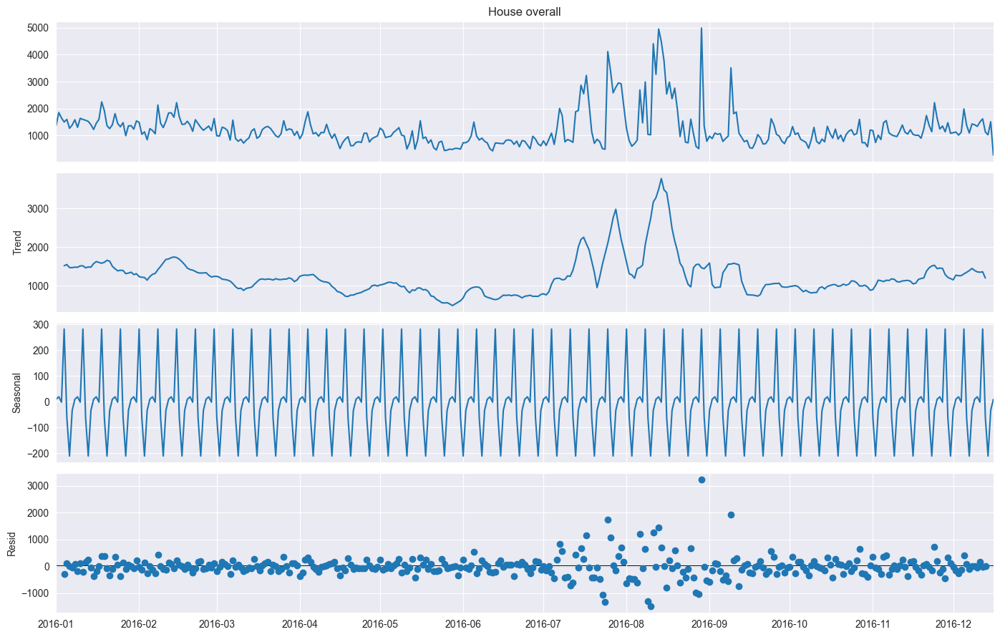

In [69]:
# Time series analysis for energy per day
import statsmodels.api
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

datause=energy_per_day.iloc[:,0].values
#fig,ax=plt.subplots(figsize=(15,10))
plt.rcParams['figure.figsize'] = (14, 9)
result = seasonal_decompose(energy_per_day['House overall'],model='additive')
result.plot()
plt.show()

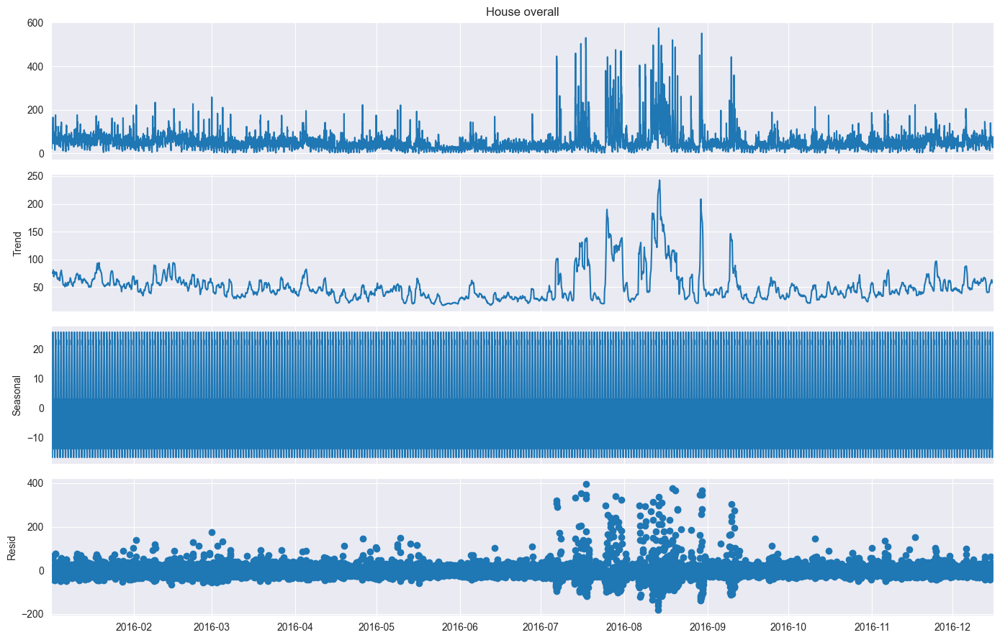

In [70]:
# Time series analysis for energy per Hour
import statsmodels.api
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller

datause=energy_per_hour.iloc[:,0].values
#fig,ax=plt.subplots(figsize=(15,10))
plt.rcParams['figure.figsize'] = (14, 9)
result = seasonal_decompose(energy_per_hour['House overall'],model='additive')
result.plot()
plt.show()

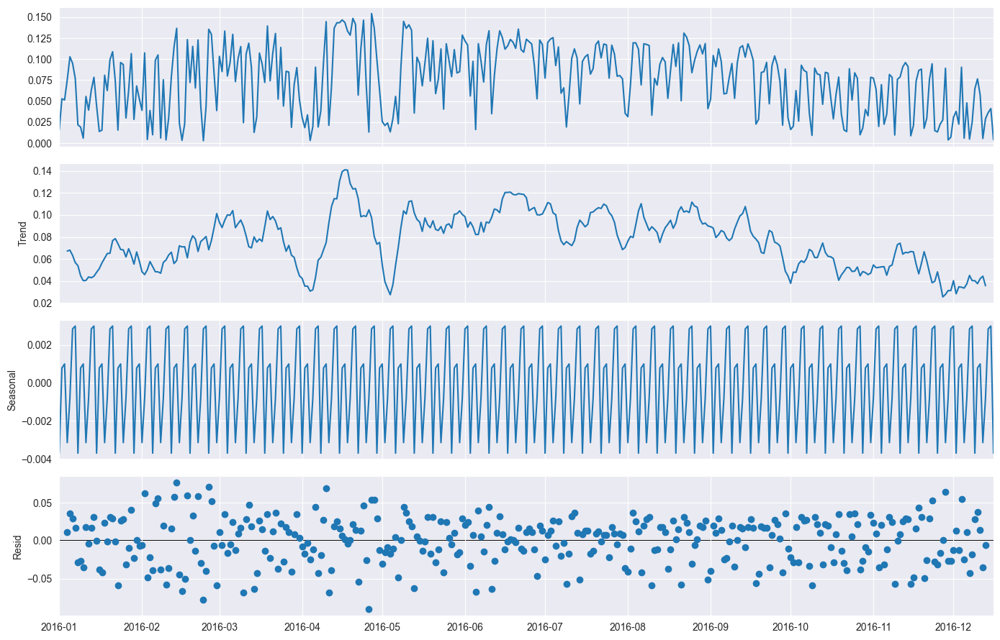

In [71]:
# Time series analysis for energy per day

weather=weather_per_day.iloc[:,0].values
#fig,ax=plt.subplots(figsize=(15,10))
plt.rcParams['figure.figsize'] = (14, 9)
seasonal_decompose(weather_per_day[['Solar']]).plot()
result = adfuller(weather)
plt.show()

Solar Generation is maximum in the months of April-May

# **Data Visualization**

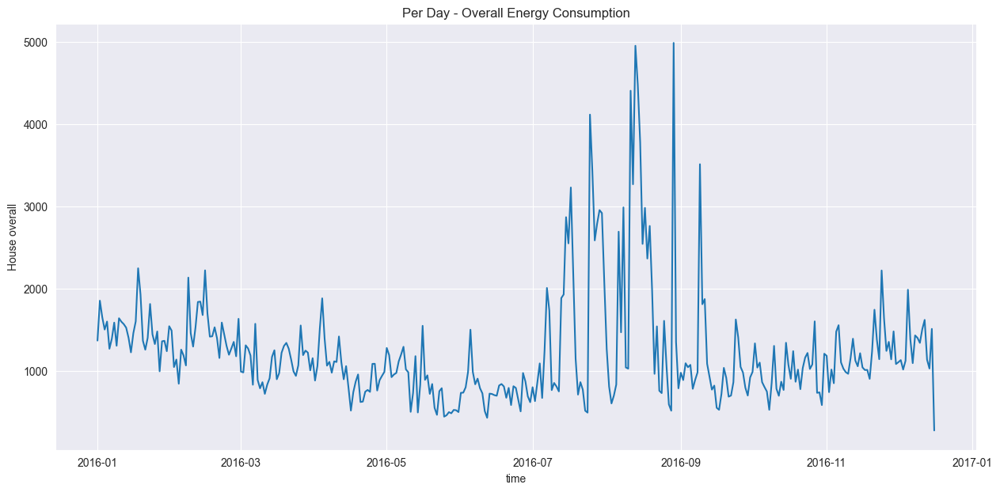

In [72]:
# Plotting total energy consumption per day

plt.figure(figsize=(15,7))
plt.title("Per Day - Overall Energy Consumption")
sns.lineplot(data = energy_per_day['House overall'], dashes=False)
plt.show()

nference- We can see an increasing trend in energy consumption per day from August and it reaches the peak in September and again starts falling by the end of September 

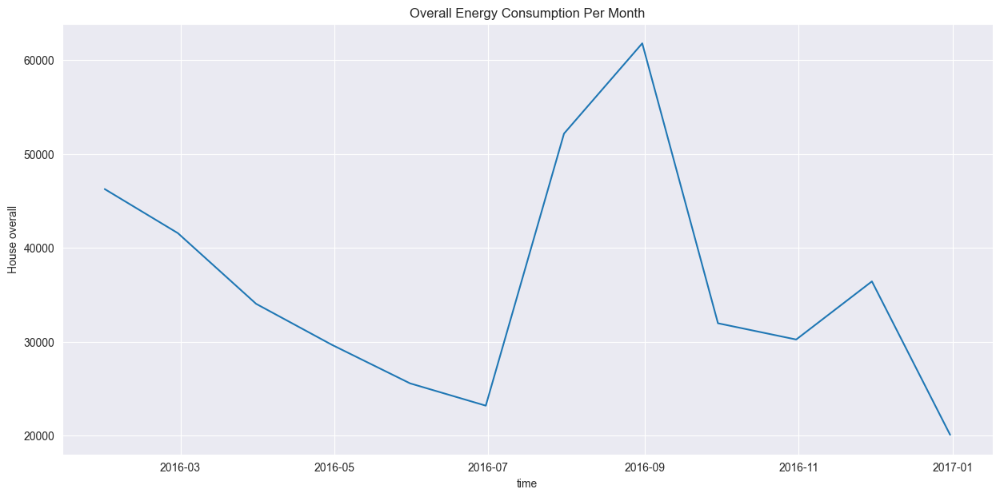

In [73]:
# Plotting total energy consumption per month

plt.figure(figsize=(15,7))
plt.title("Overall Energy Consumption Per Month")
sns.lineplot(data = energy_per_month['House overall'], dashes=False)
plt.show()

**Inference-The highest energy consumption in the year falls in the months of August and September followed by the month of February.**
**Whereas the lowest consumption is in the month of January. **

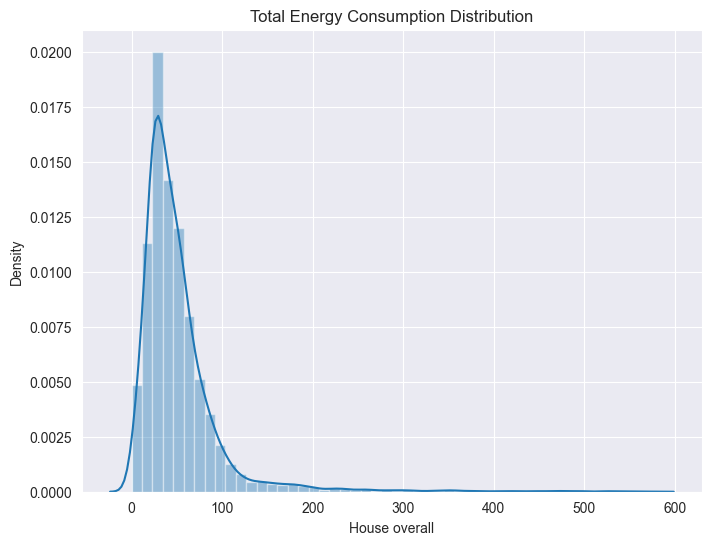

In [74]:
# Plotting the Distribution of energy per hour

plt.figure(figsize=(8,6))
sns.distplot(energy_per_hour['House overall'])
plt.title('Total Energy Consumption Distribution')
plt.show()

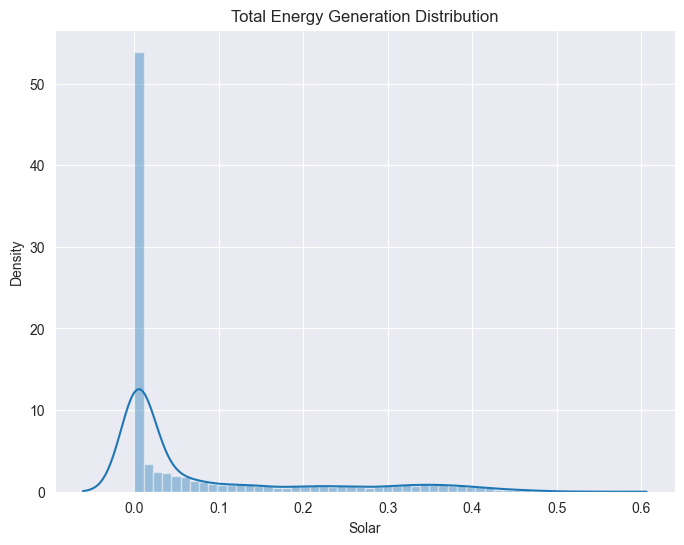

In [75]:
# Plotting the Distribution of Solar generation per hour
plt.figure(figsize=(8,6))
sns.distplot(weather_per_hour['Solar'])
plt.title('Total Energy Generation Distribution')
plt.show()



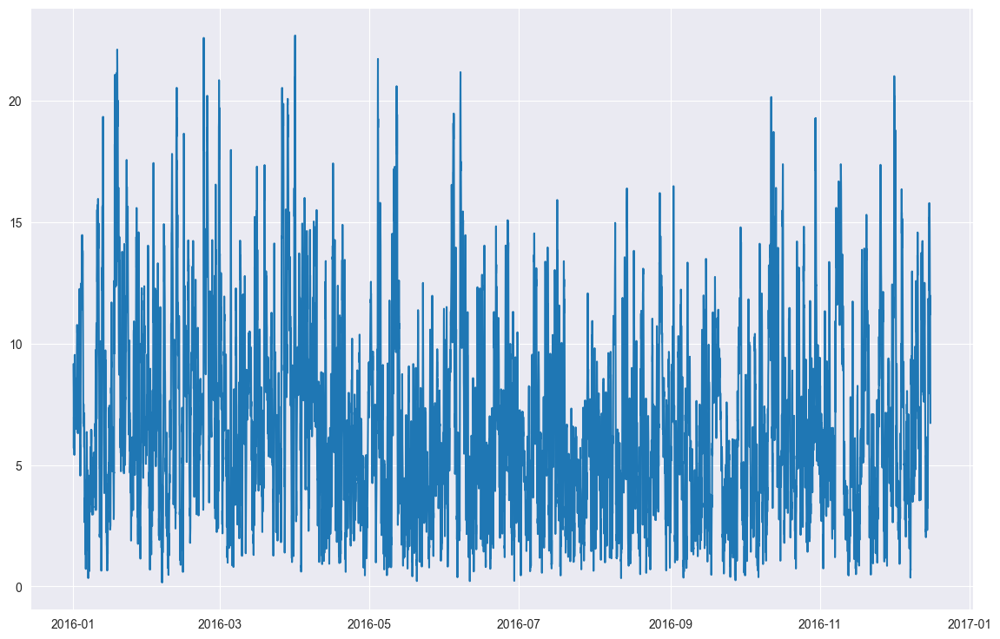

In [76]:
plt.plot(weather_per_hour["windSpeed"])

In [77]:
pp_data = energy_data[['Dishwasher', 'Fridge', 'Garage door', 'Well', 'Microwave', 'Furnace']]
room_data = energy_data[['Home office', 'Living room', 'Kitchen']]

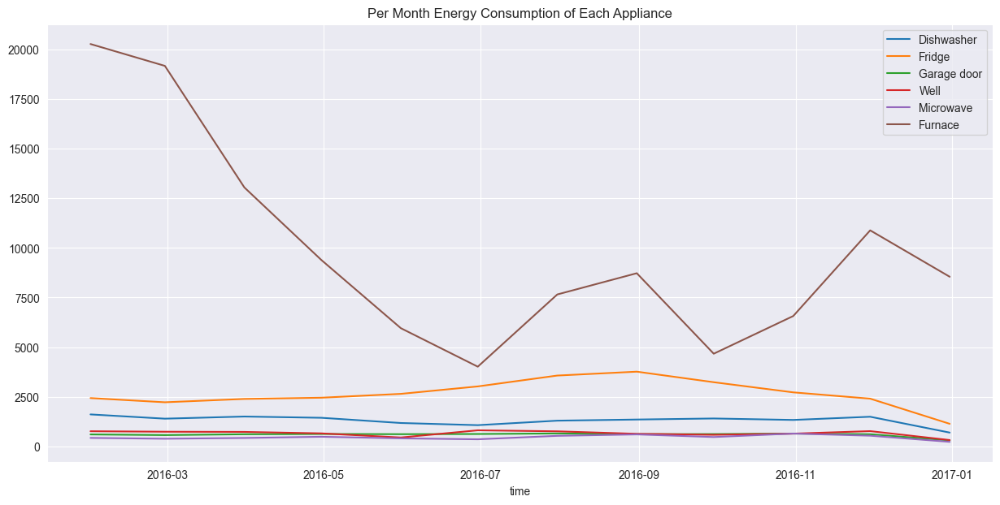

In [78]:
# Plotting per month energy consumption of each device

plt.figure(figsize=(15,7))
plt.title("Per Month Energy Consumption of Each Appliance")
sns.lineplot(data = energy_per_month[pp_data.columns], dashes=False)
plt.show()

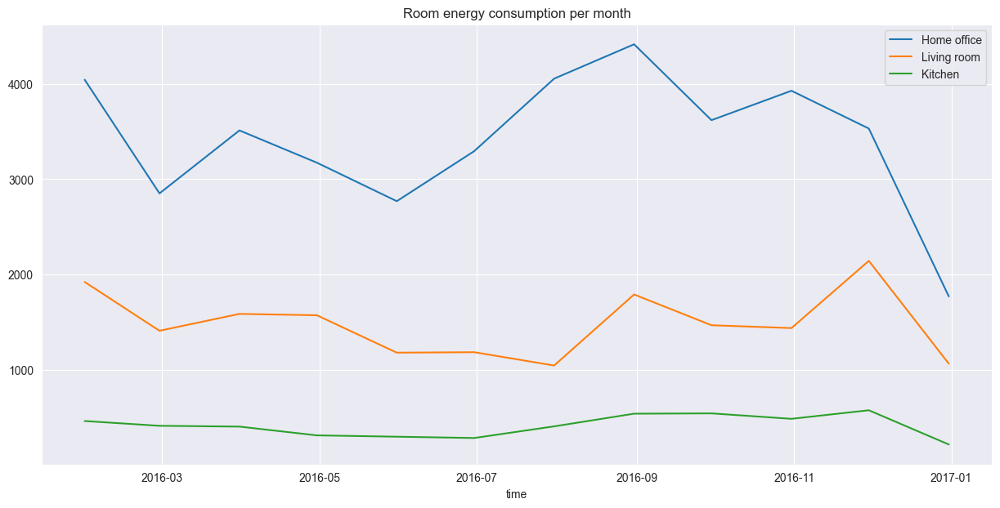

In [79]:
plt.figure(figsize=(15,7))
plt.title("Room energy consumption per month")
sns.lineplot(data = energy_per_month[room_data.columns], dashes=False)
plt.show()

**From above it can be see that 'Home office' has the highest consumption in the among rooms and the 'Kitchen' has the lowest consumption.**


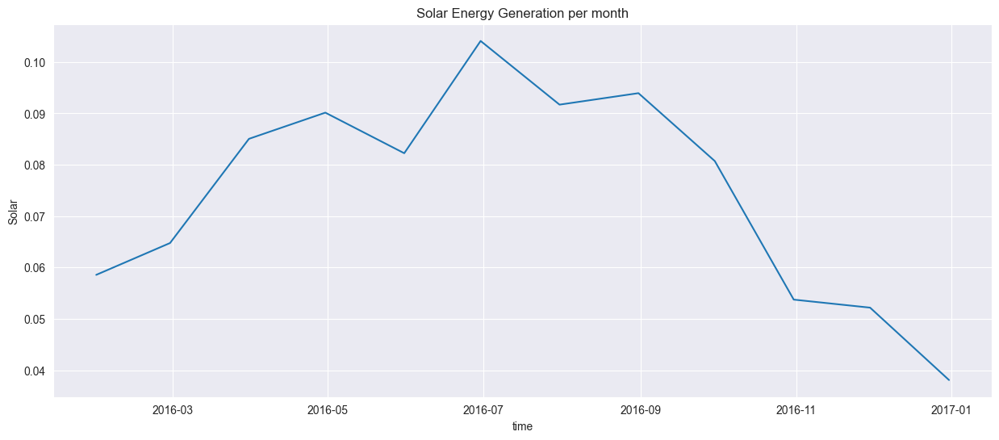

In [80]:
plt.figure(figsize=(15,6))
plt.title("Solar Energy Generation per month")
sns.lineplot(data = weather_per_month['Solar'],dashes=False)
plt.show()

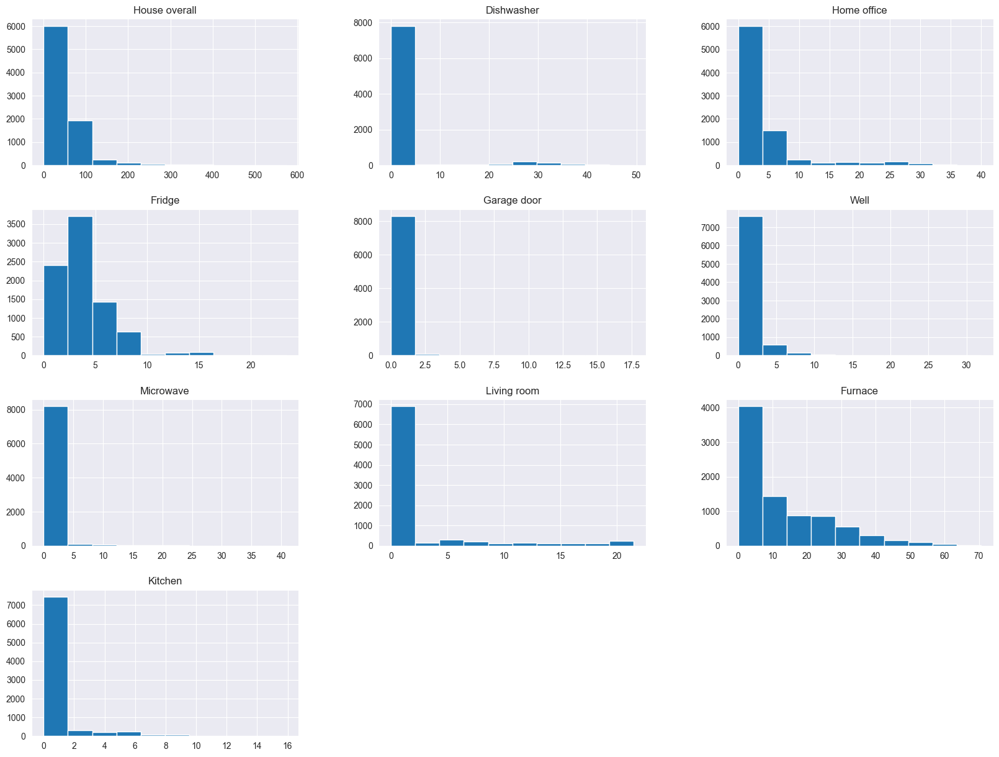

In [81]:
# Plotting Frequency graph showing distribution
freqgraph = energy_per_hour.select_dtypes(include=["float",'int'])
freqgraph.hist(figsize=(20,15))
plt.show()

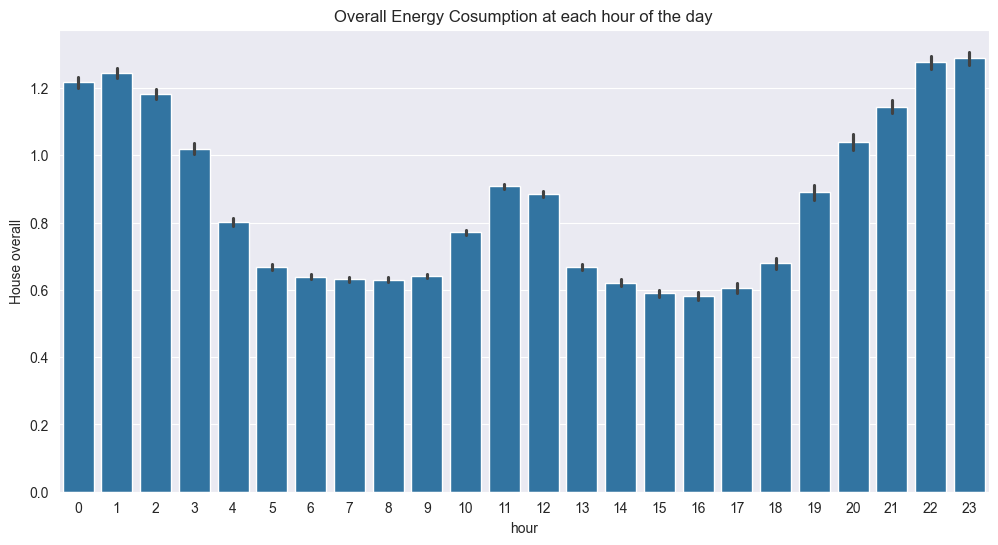

In [82]:
# Plotting total Energy Consumption with respect to time in a day

plt.figure(figsize=(12,6))
sns.barplot(x=data['hour'], y=data['House overall'])
plt.title('Overall Energy Cosumption at each hour of the day')
plt.show()

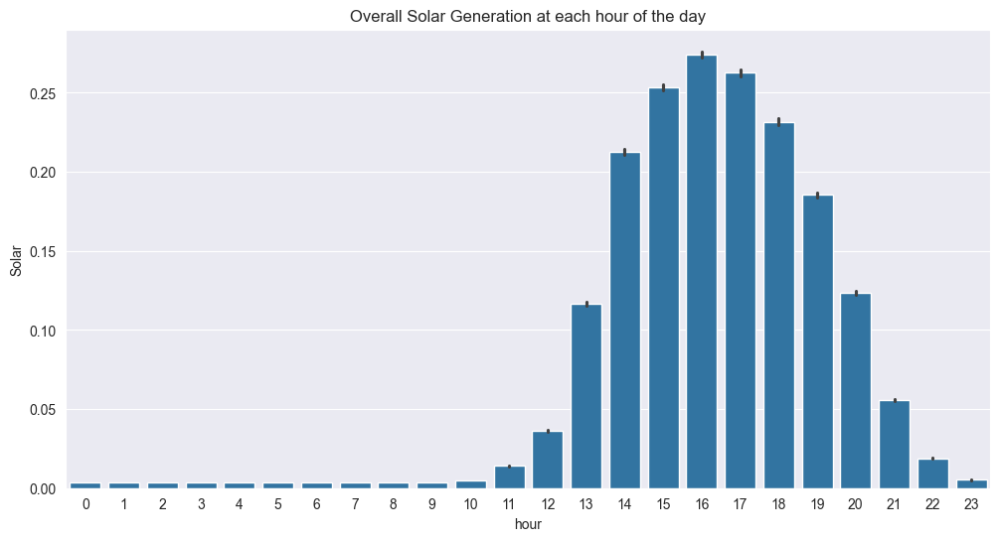

In [83]:
plt.figure(figsize=(12,6))
sns.barplot(x=data['hour'], y=data['Solar'])
plt.title('Overall Solar Generation at each hour of the day')
plt.show()

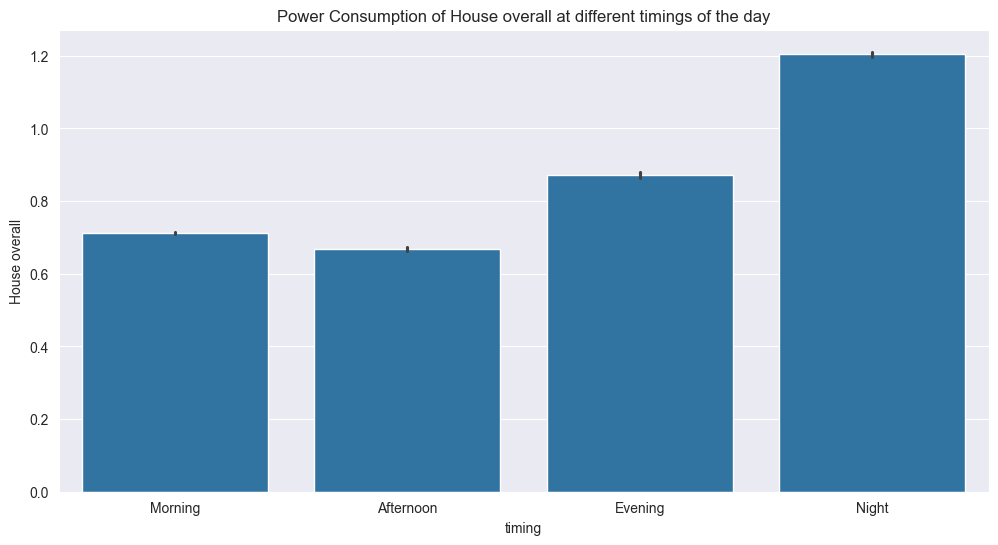

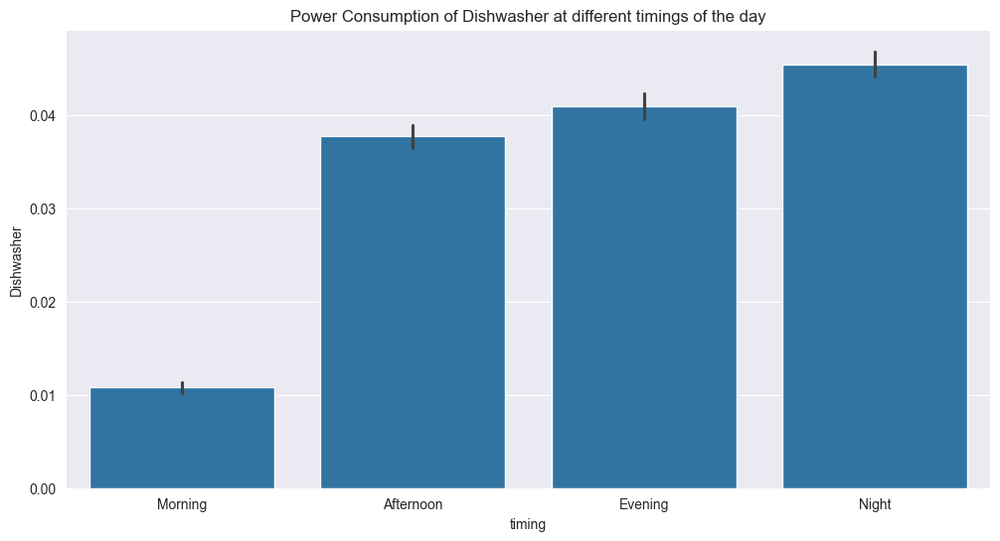

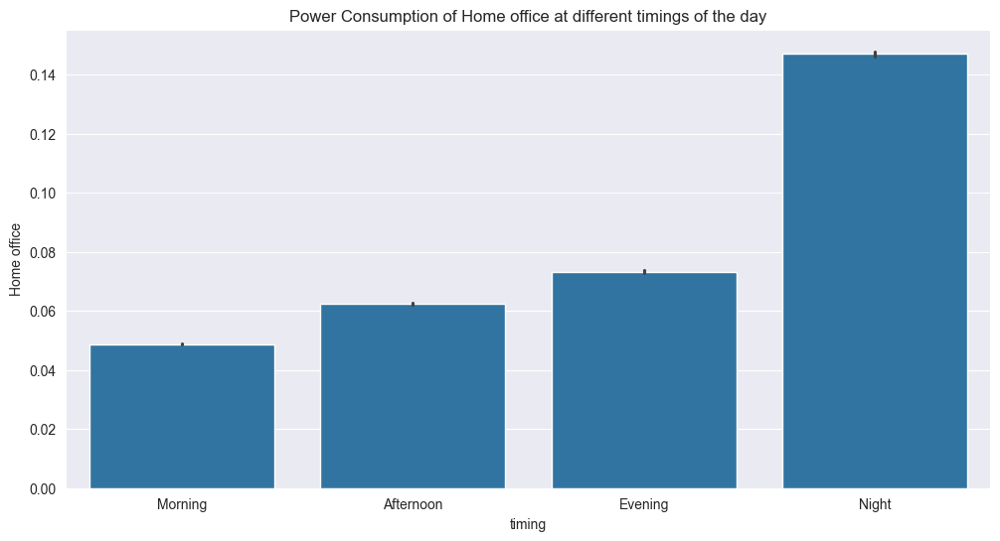

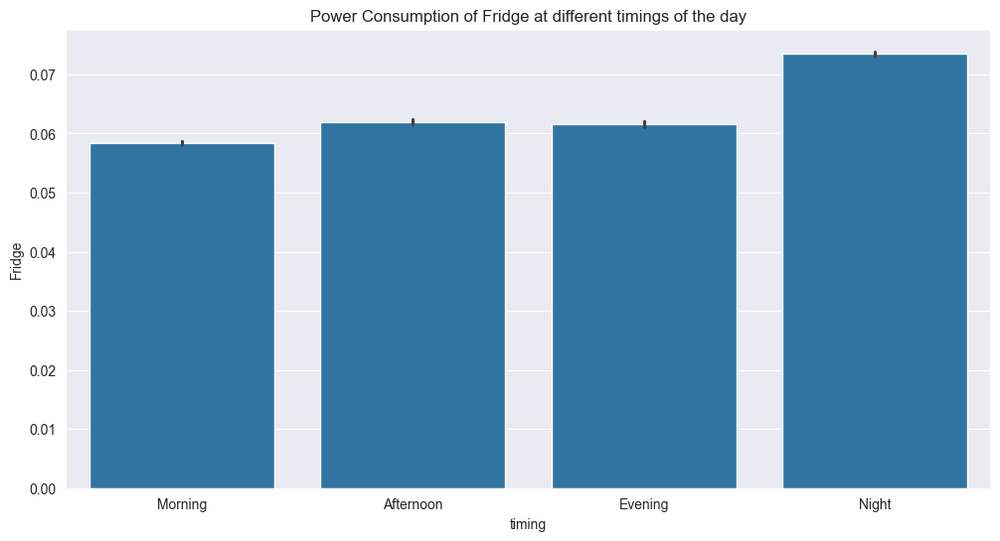

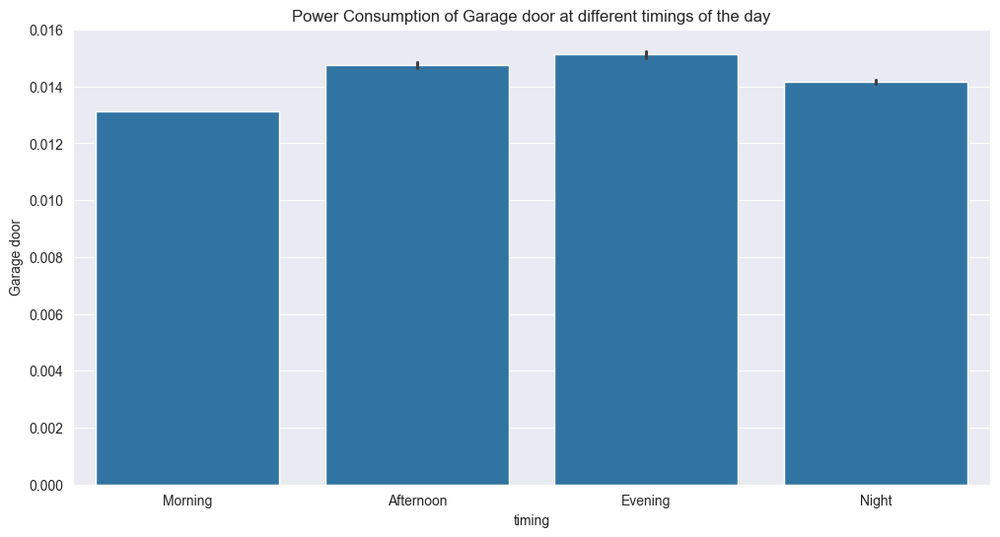

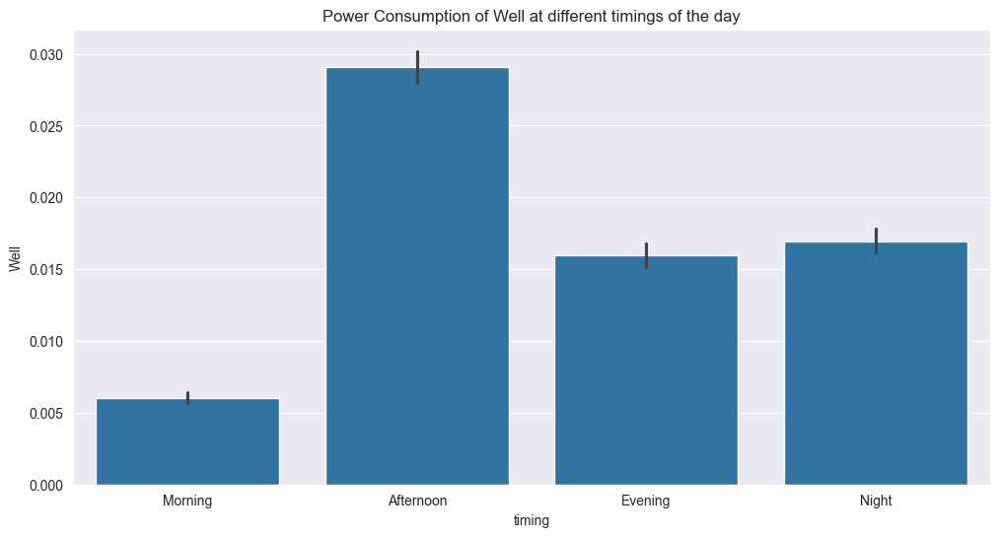

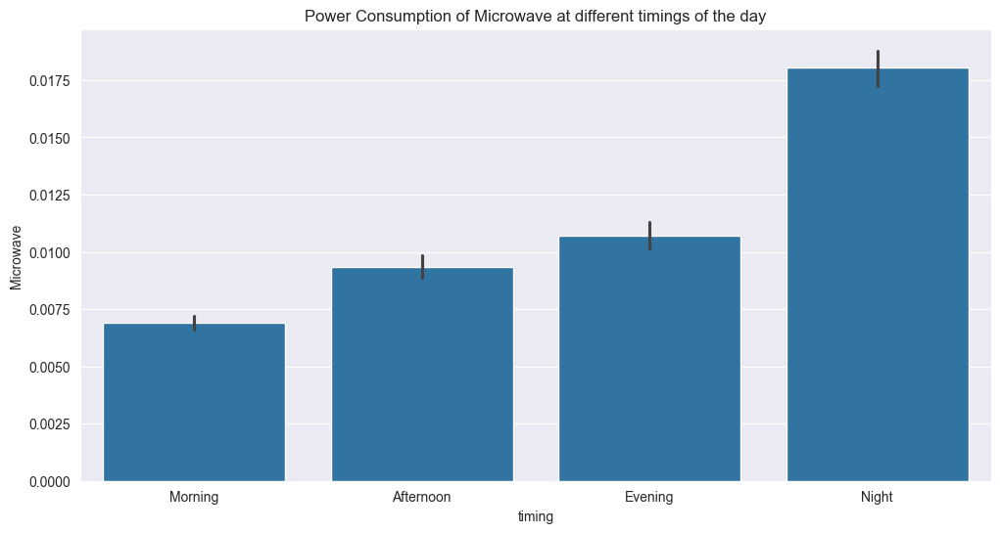

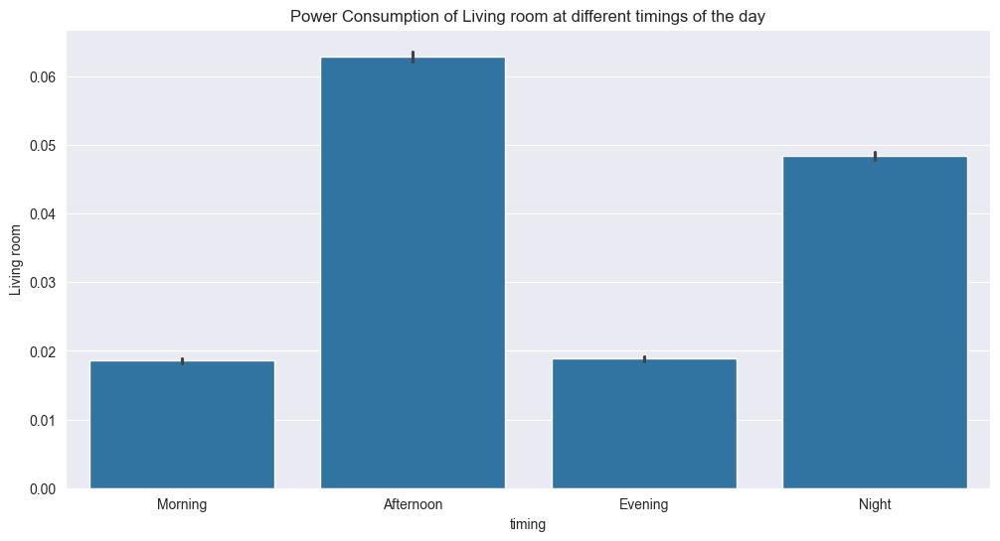

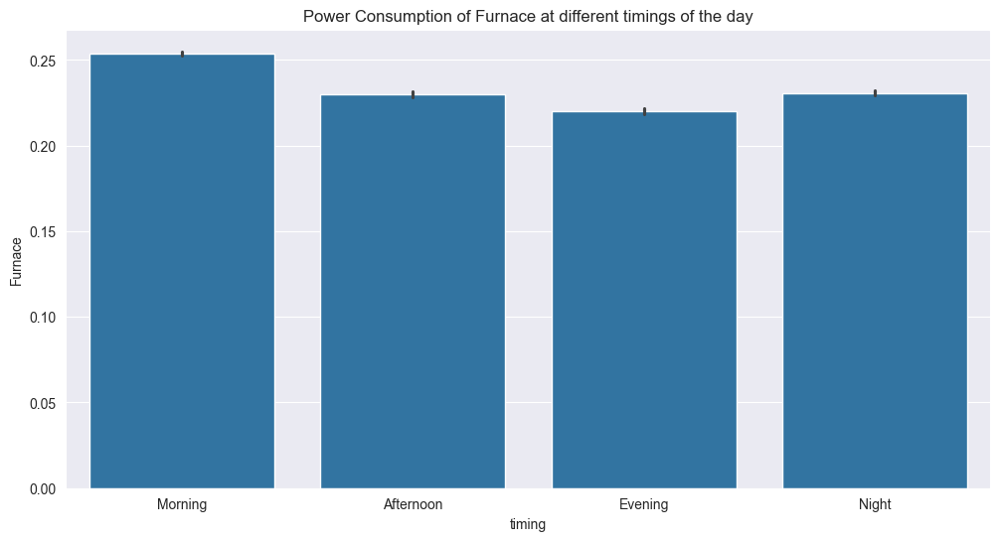

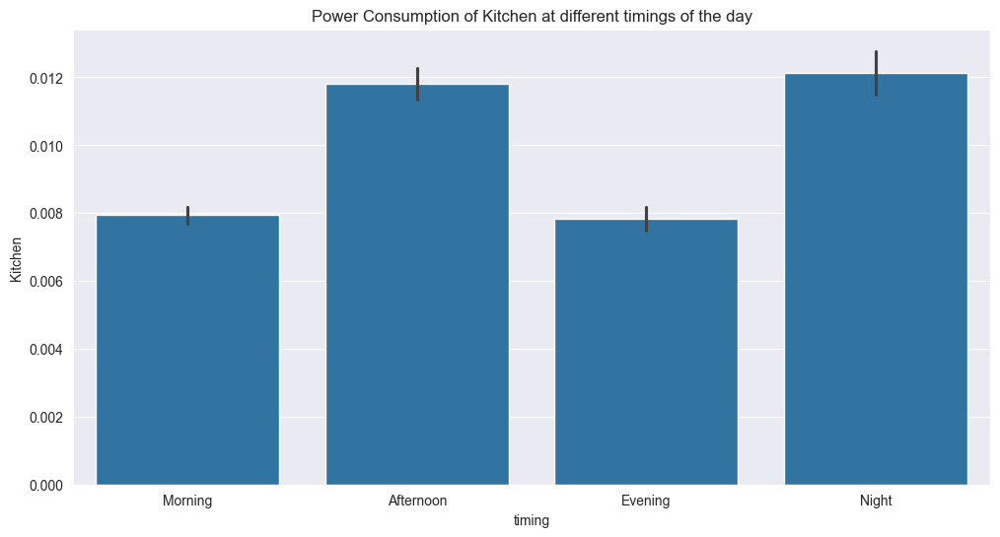

In [84]:
for i in energy_data:
  plt.figure(figsize=(12,6))
  sns.barplot(x=data['timing'], y=data[i])
  plt.title('Power Consumption of {} at different timings of the day'.format(i))
  plt.show()

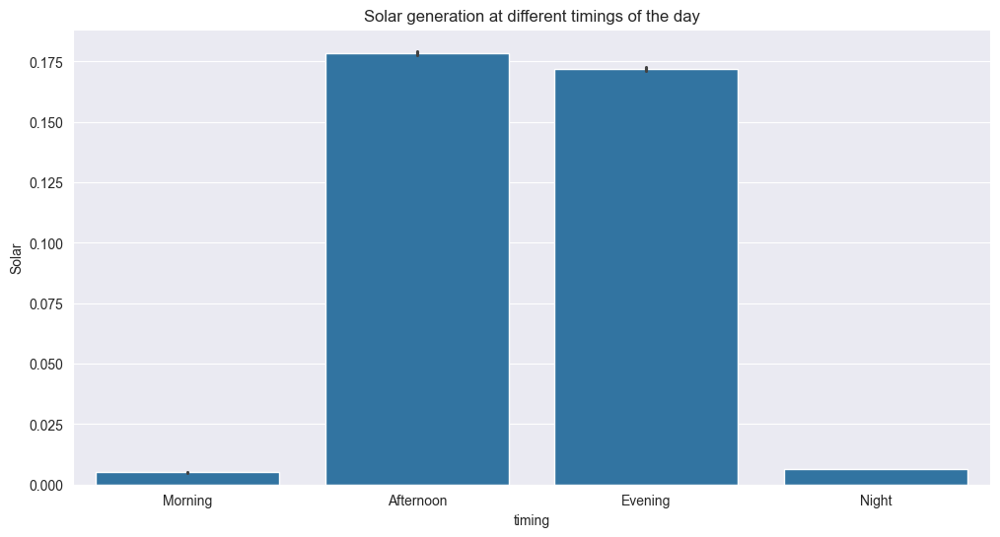

In [85]:
plt.figure(figsize=(12,6))
sns.barplot(x=data['timing'], y=data['Solar'])
plt.title('Solar generation at different timings of the day')
plt.show()

<Axes: title={'center': 'Mean Temperature Per Month'}, xlabel='time', ylabel='°F'>

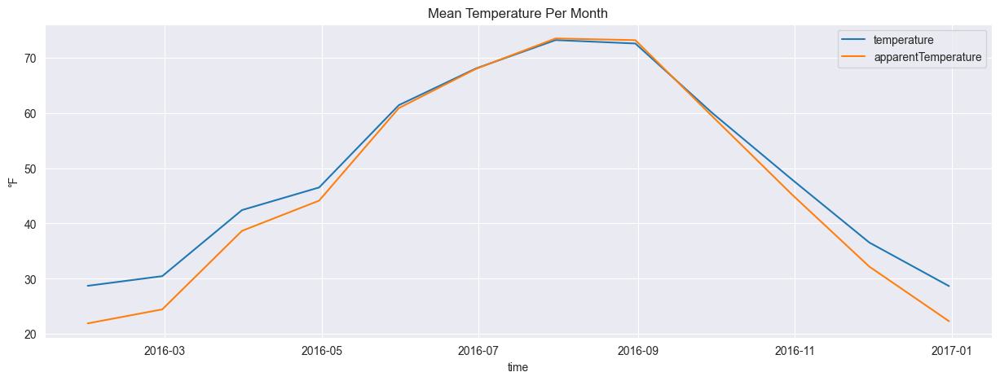

In [86]:
#Plot of Average Temperature per month
plt.figure(figsize=(15,5))
plt.ylabel('°F')
plt.title("Mean Temperature Per Month")
sns.lineplot(data = weather_per_month[['temperature', 'apparentTemperature']],dashes=False)

<Axes: title={'center': 'Mean Humidity Per Month'}, xlabel='time', ylabel='humidity'>

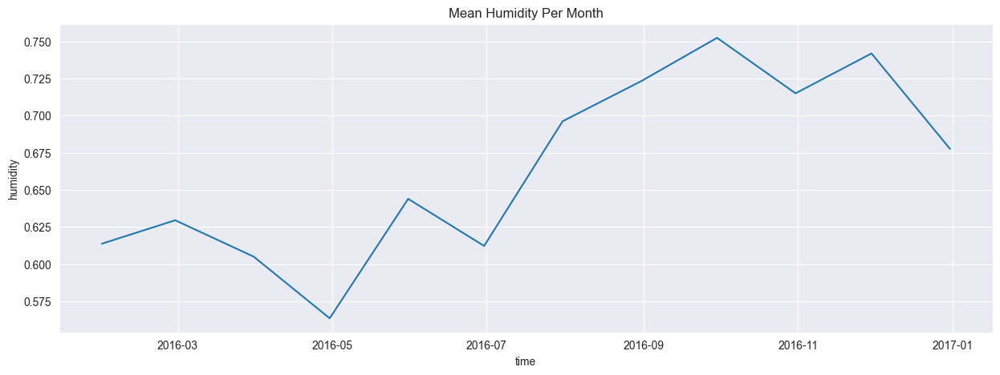

In [87]:
plt.figure(figsize=(15,5))
plt.title("Mean Humidity Per Month")
sns.lineplot(data = weather_per_month['humidity'],dashes=False)

## **Calulating Total Energy Consumption per month for rooms and appliances respectively**

In [88]:
rooms_energy_per_month = energy_per_month[['Home office', 'Living room', 'Kitchen']]
app_energy_per_month = energy_per_month[['Dishwasher', 'Fridge', 'Garage door', 'Well', 'Microwave', 'Furnace']]

In [89]:
rooms_tot_consum_per_month = rooms_energy_per_month.sum()
app_tot_consum_per_month = app_energy_per_month.sum()

In [90]:
print('The total energy consumption of rooms per month is :\n', rooms_tot_consum_per_month, '\n')
print('The total energy consumption of appliances per month is :\n', app_tot_consum_per_month)

The total energy consumption of rooms per month is :
 Home office    40961.277962
Living room    17794.476716
Kitchen         4927.461209
dtype: float64 

The total energy consumption of appliances per month is :
 Dishwasher      15806.409510
Fridge          32026.710600
Garage door      7124.847316
Well             7882.163852
Microwave        5534.440218
Furnace        118917.457954
dtype: float64


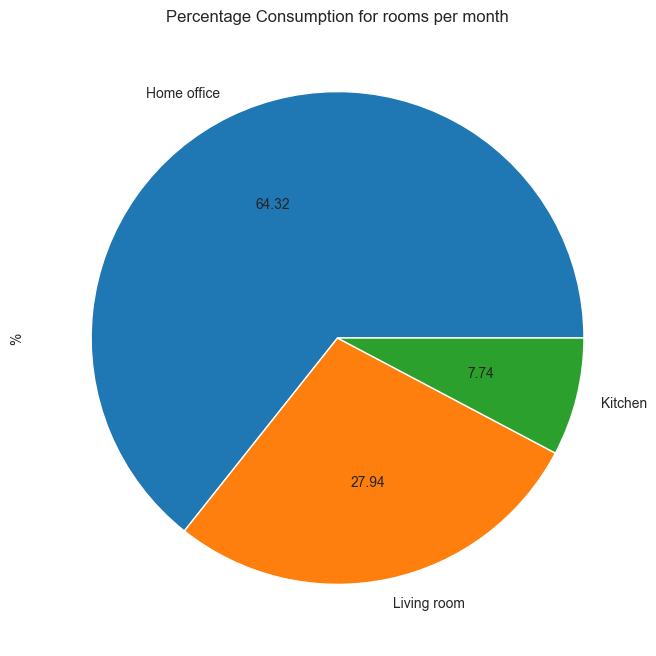

In [91]:
# Plotting Pie Chart to show % Consumption of rooms per month  

rooms_tot_consum_per_month.plot(kind="pie", autopct='%.2f', figsize=(8,8))
plt.title("Percentage Consumption for rooms per month")
plt.ylabel('%')
plt.show()

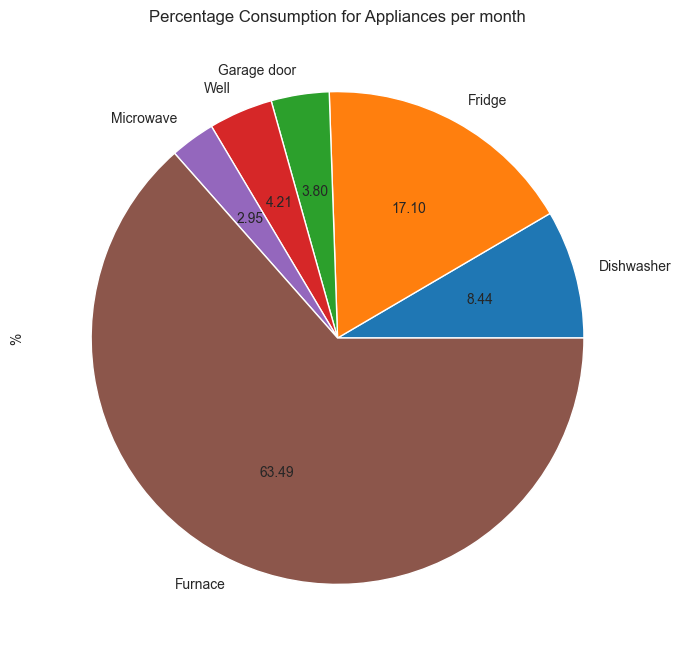

In [92]:
# Plotting Pie Chart to show % Consumption of devices per month 

app_tot_consum_per_month.plot(kind="pie", autopct='%.2f', figsize=(8,8))
plt.title("Percentage Consumption for Appliances per month")
plt.ylabel('%')
plt.show()

## Regplot showing regression line between two parameters and the linear relationship 

how tight the datapoints occuring around them determines the extent of linear relationship

If the datapoints appears close to the regression line. the line seems to be a good fit regression line

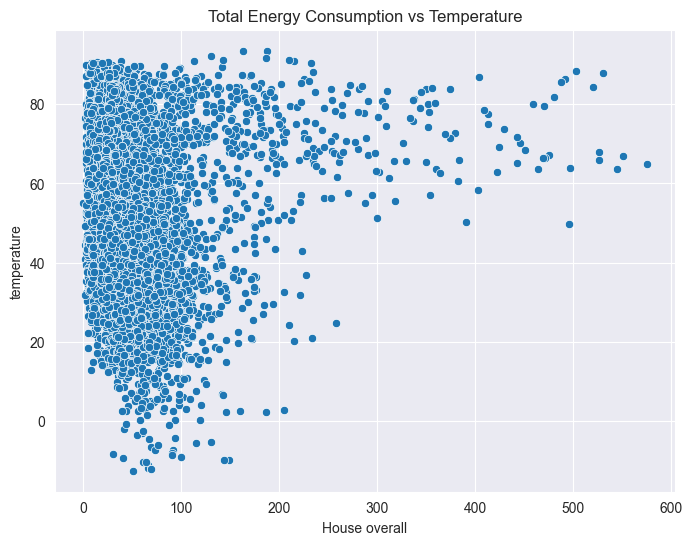

In [93]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=energy_per_hour['House overall'], y= weather_per_hour['temperature'])
plt.title('Total Energy Consumption vs Temperature')
plt.show()

plt.show()
Inference- 

When temperature is in the range of 60 to 80 degree F energy consumption seems to be the most.

When Temperatures occurs between 0 to 10 degree F House Overall it at its minimum range

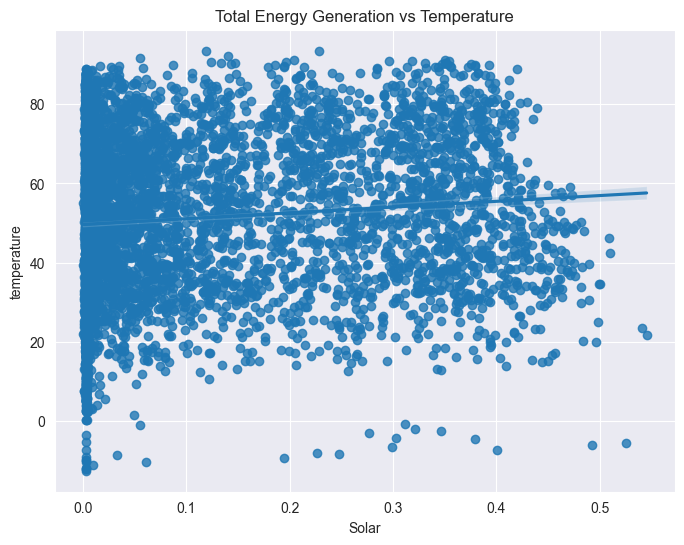

In [94]:
plt.figure(figsize=(8,6))
sns.regplot(x=weather_per_hour['Solar'], y= weather_per_hour['temperature'])
plt.title('Total Energy Generation vs Temperature')
plt.show()

There doesnt seem to be any linear relationship between Solar generation and temperature in our data


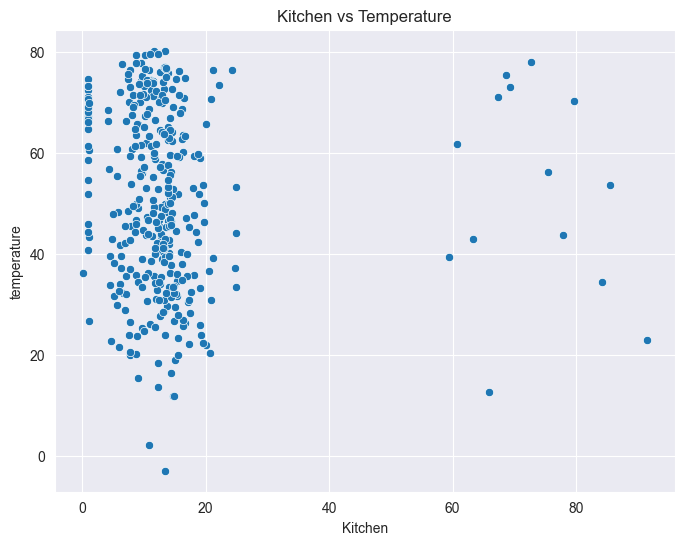

In [95]:
plt.figure(figsize=(8,6))
sns.scatterplot(x = energy_per_day['Kitchen'], y = weather_per_day['temperature'])
plt.title('Kitchen vs Temperature')
plt.show()

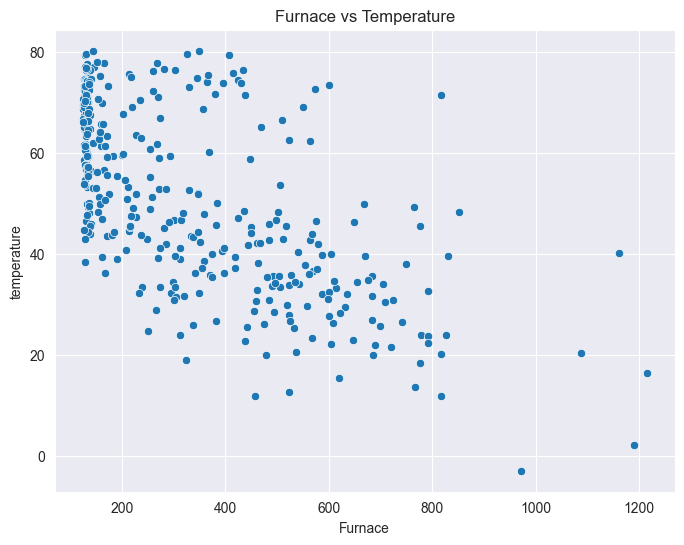

In [96]:
plt.figure(figsize=(8,6))
sns.scatterplot(x = energy_per_day['Furnace'], y = weather_per_day['temperature'])
plt.title('Furnace vs Temperature')
plt.show()

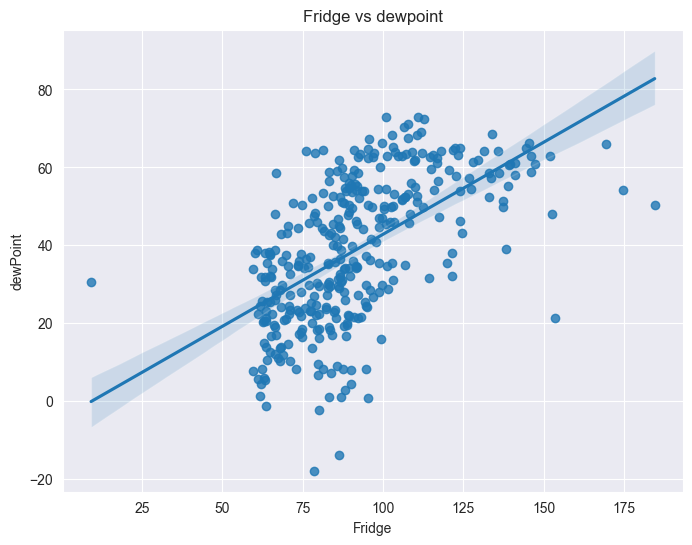

In [97]:
plt.figure(figsize=(8,6))
sns.regplot(x = energy_per_day['Fridge'], y = weather_per_day['dewPoint'])
plt.title('Fridge vs dewpoint')
plt.show()

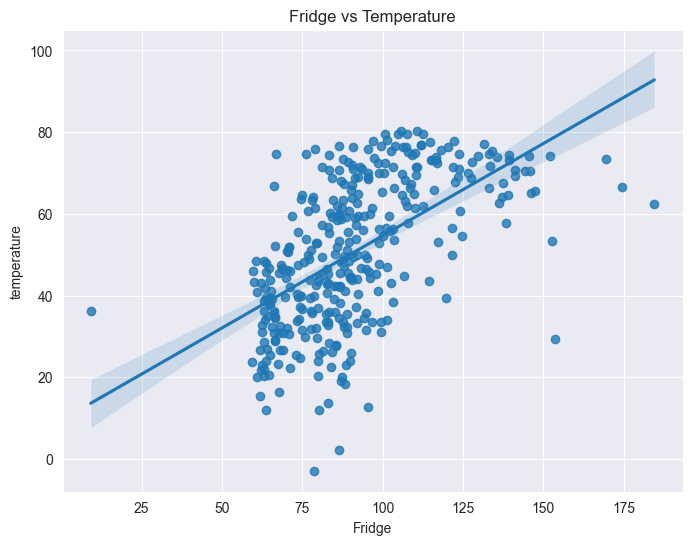

In [98]:
plt.figure(figsize=(8,6))
sns.regplot(x = energy_per_day['Fridge'], y = weather_per_day['temperature'])
plt.title('Fridge vs Temperature')
plt.show()

### **Usage of different appliabnces are ploted using univcarite plots below**

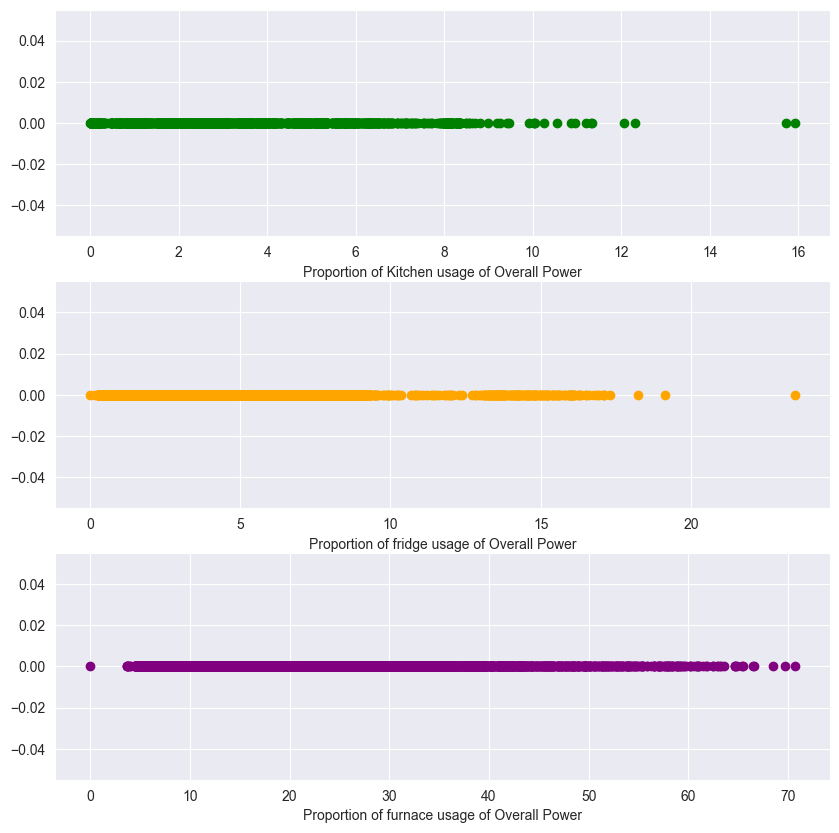

In [99]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.plot(energy_per_hour['Kitchen'],np.zeros_like(energy_per_hour['Kitchen']),'o',color='green')
plt.xlabel('Proportion of Kitchen usage of Overall Power')
plt.subplot(3,1,2)
plt.plot(energy_per_hour['Fridge'],np.zeros_like(energy_per_hour['Fridge']),'o',color='Orange')
plt.xlabel('Proportion of fridge usage of Overall Power')
plt.subplot(3,1,3)
plt.plot(energy_per_hour['Furnace'],np.zeros_like(energy_per_hour['Furnace']),'o',color='Purple')   
plt.xlabel('Proportion of furnace usage of Overall Power')
plt.show()

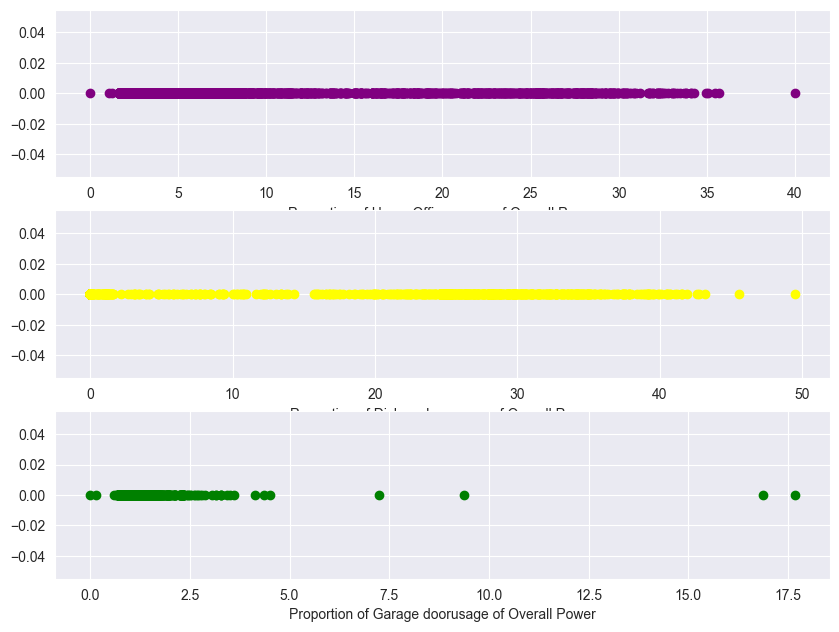

In [100]:
plt.figure(figsize=(10,10))
plt.subplot(4,1,1)
plt.plot(energy_per_hour['Home office'],np.zeros_like(energy_per_hour['Home office']),'o',color='Purple')
plt.xlabel('Proportion of Home Office usage of Overall Power')
plt.subplot(4,1,2)
plt.plot(energy_per_hour['Dishwasher'],np.zeros_like(energy_per_hour['Dishwasher']),'o',color='Yellow')
plt.xlabel('Proportion of Dishwasher usage of Overall Power')
plt.subplot(4,1,3)
plt.plot(energy_per_hour['Garage door'],np.zeros_like(energy_per_hour['Garage door']),'o',color='green')
plt.xlabel('Proportion of Garage doorusage of Overall Power')
plt.show()

# Bivariate Analysis

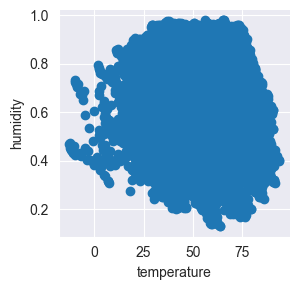

In [101]:
sns.FacetGrid(weather_per_hour).map(plt.scatter,'temperature','humidity').add_legend()
plt.show()

### Facet Grid of temperature and dewpoint= showing positive correlation

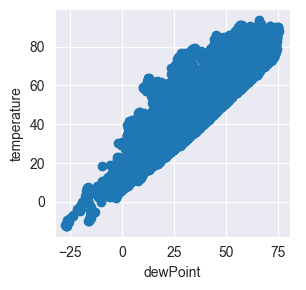

In [102]:
sns.FacetGrid(weather_per_hour).map(plt.scatter,'dewPoint','temperature').add_legend()
plt.show()

**Temperature and dewpoint has a positive correlation**

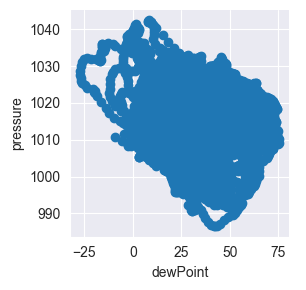

In [103]:
sns.FacetGrid(weather_per_hour).map(plt.scatter,'dewPoint','pressure').add_legend()
plt.show()

### **Pair Plot of weather parameters with solar energy generation and Power Consumption**

In [104]:
weather_energy =pd.concat([weather_data[['temperature', 'humidity', 'pressure', 'windSpeed', 'cloudCover','Solar']], energy_data[['House overall']]], axis=1)
weather_energy

,temperature,humidity,pressure,windSpeed,cloudCover,Solar,House overall
time,,,,,,,
2016-01-01 05:00:00,36.14,0.62,1016.91,9.18,0.75,0.003483,0.932833
2016-01-01 05:01:00,36.14,0.62,1016.91,9.18,0.75,0.003467,0.934333
2016-01-01 05:02:00,36.14,0.62,1016.91,9.18,0.75,0.003467,0.931817
2016-01-01 05:03:00,36.14,0.62,1016.91,9.18,0.75,0.003483,1.022050
2016-01-01 05:04:00,36.14,0.62,1016.91,9.18,0.75,0.003467,1.139400
...,...,...,...,...,...,...,...
2016-12-16 03:25:00,35.12,0.86,1011.49,6.72,0.31,0.003183,1.601233
2016-12-16 03:26:00,35.12,0.86,1011.49,6.72,0.31,0.003233,1.599333
2016-12-16 03:27:00,35.12,0.86,1011.49,6.72,0.31,0.003217,1.924267


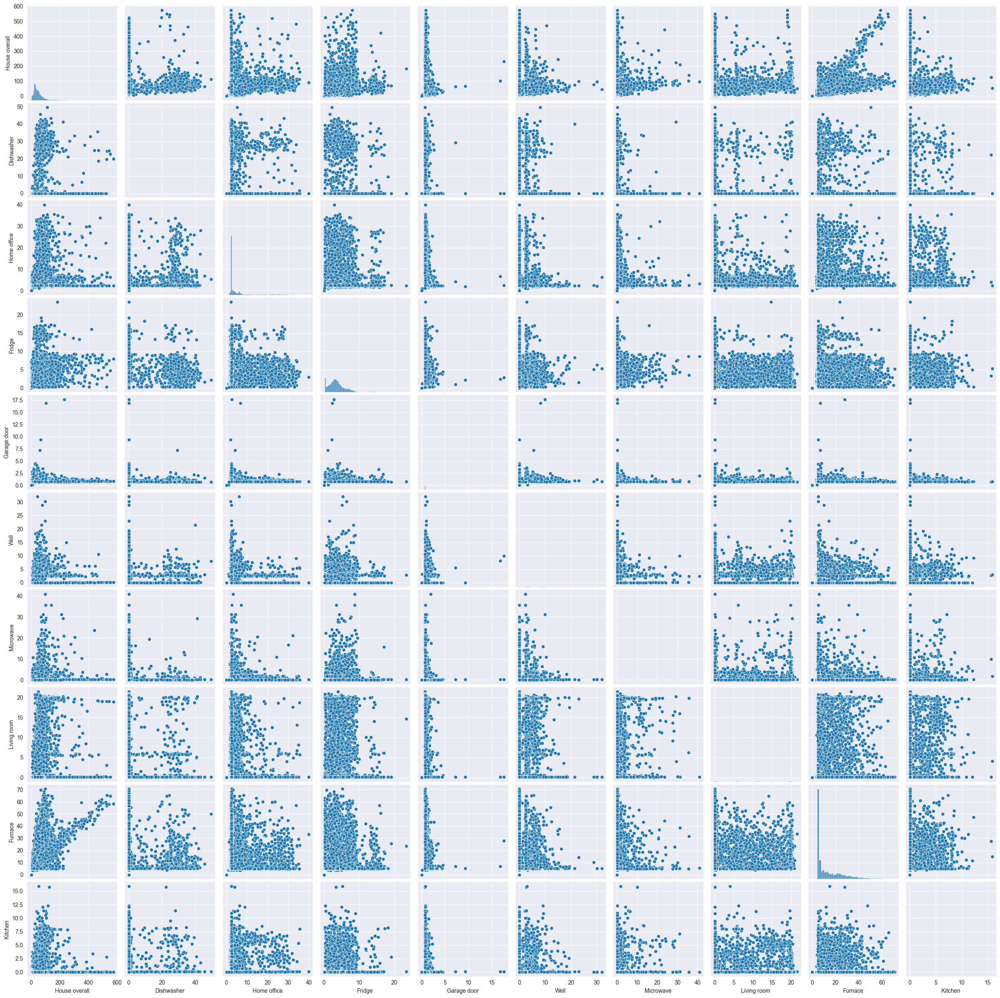

In [105]:
sns.pairplot(energy_per_hour)

## **Distribution of Numerical Data**

Distplot

In [106]:
numerical

['House overall',
 'Dishwasher',
 'Home office',
 'Fridge',
 'Garage door',
 'Kitchen',
 'Well',
 'Microwave',
 'Living room',
 'Solar',
 'temperature',
 'humidity',
 'visibility',
 'apparentTemperature',
 'pressure',
 'windSpeed',
 'cloudCover',
 'windBearing',
 'precipIntensity',
 'dewPoint',
 'precipProbability',
 'Furnace']

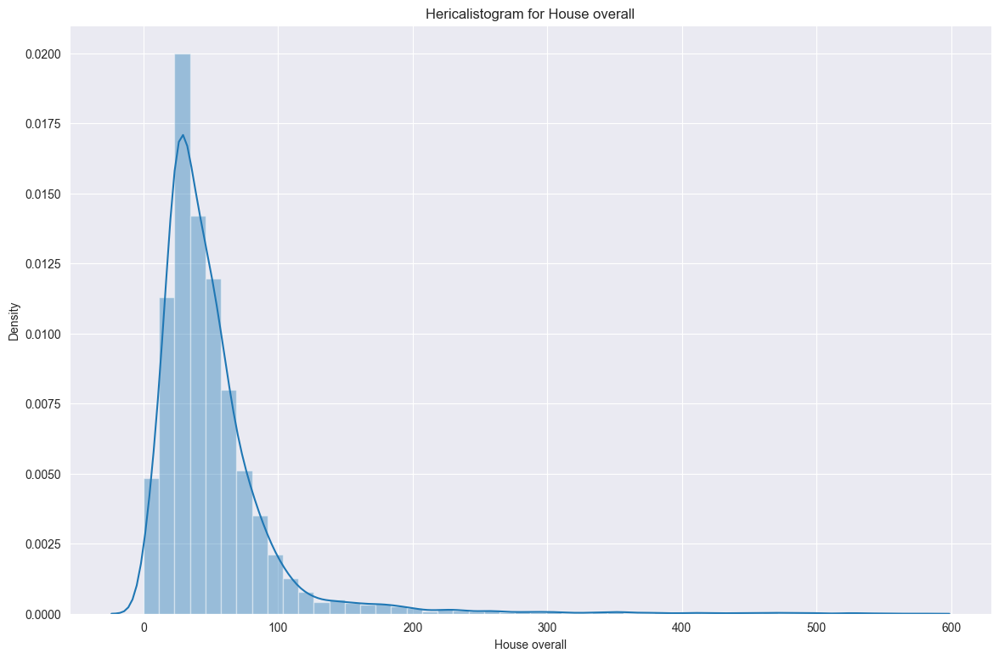

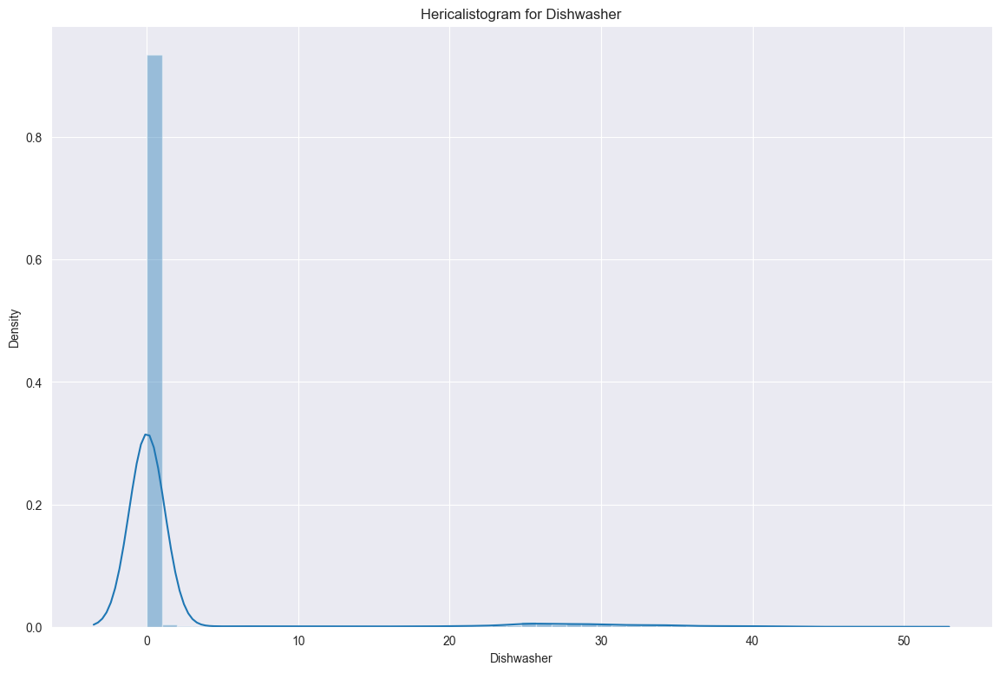

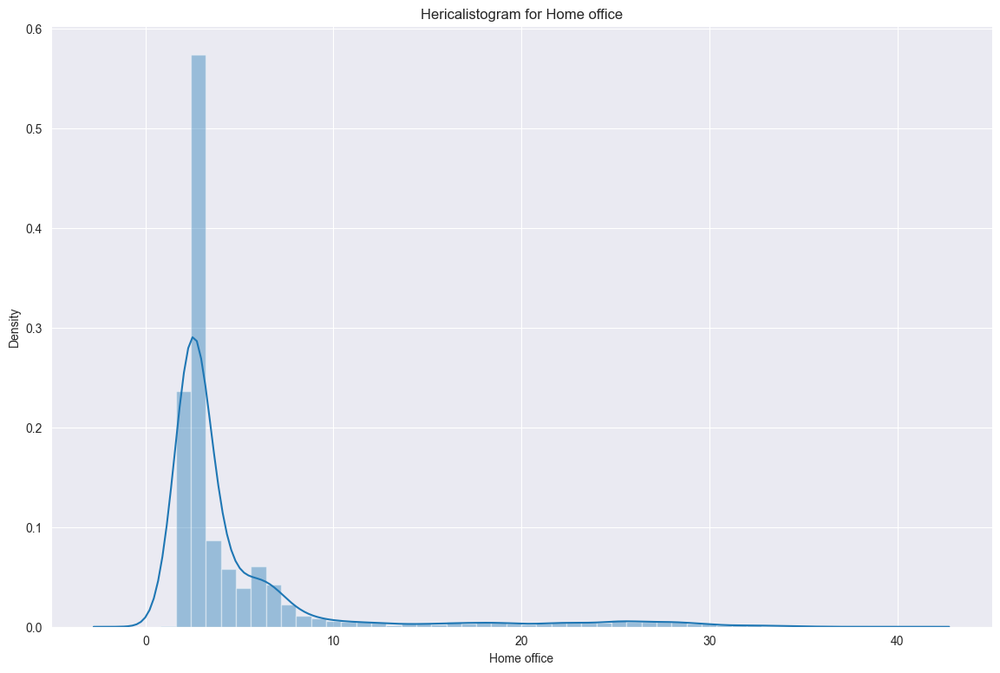

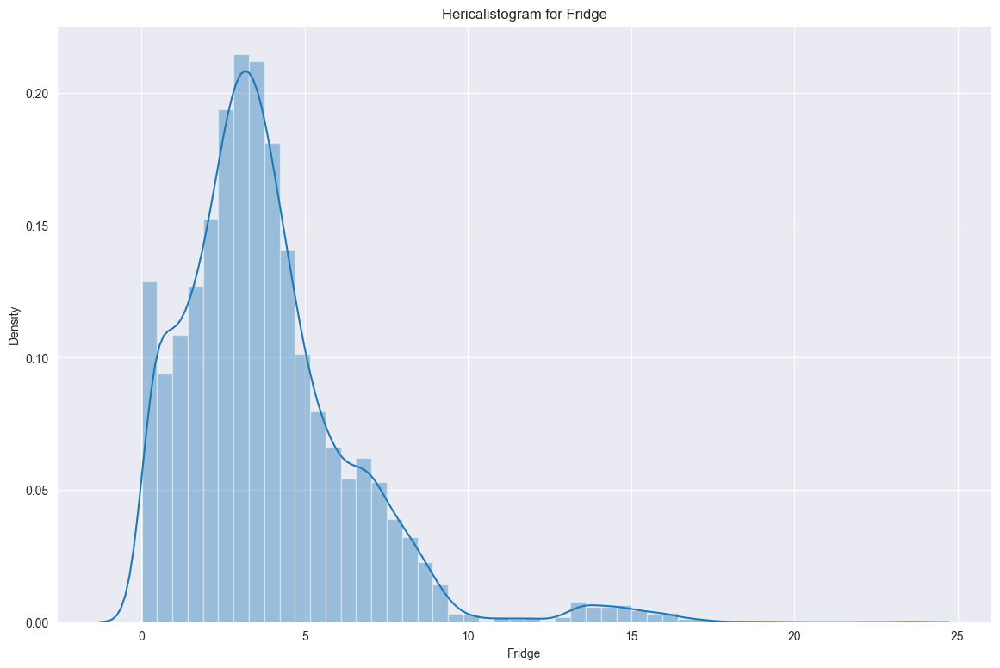

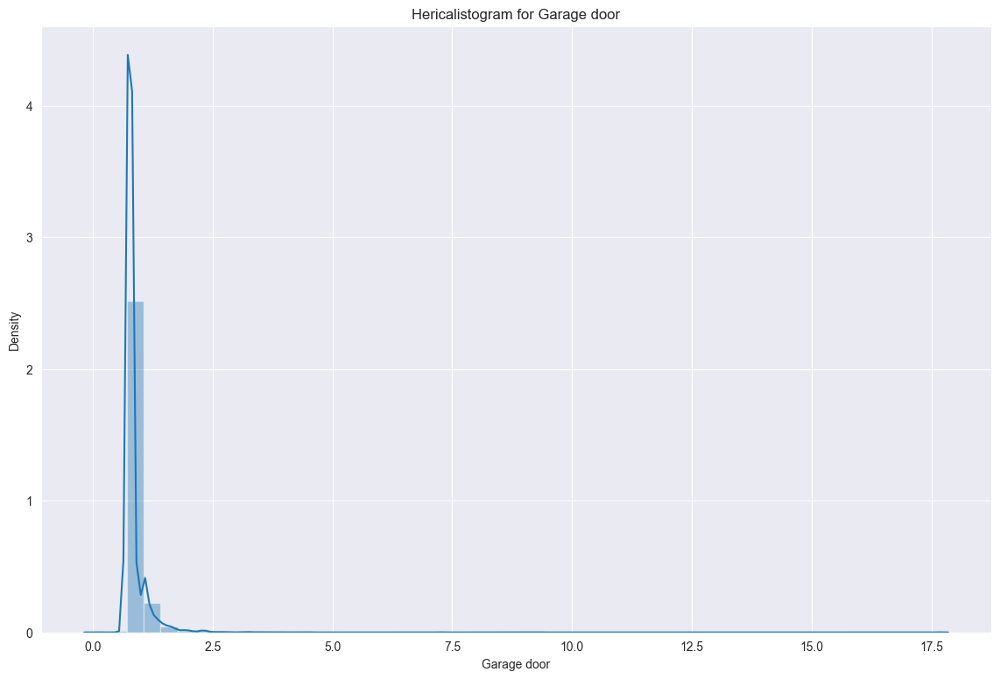

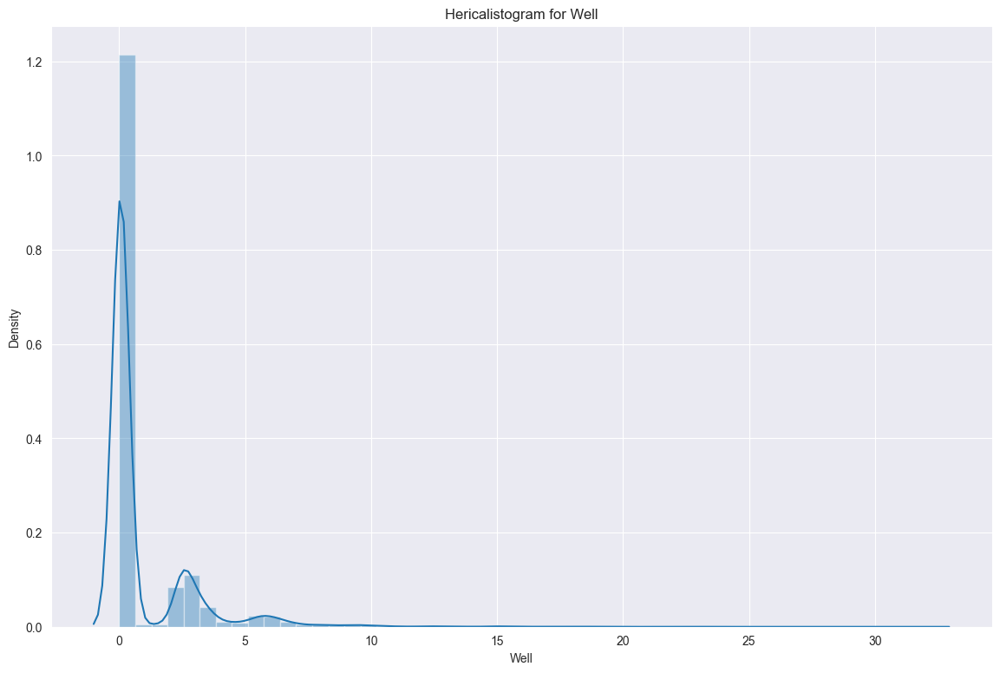

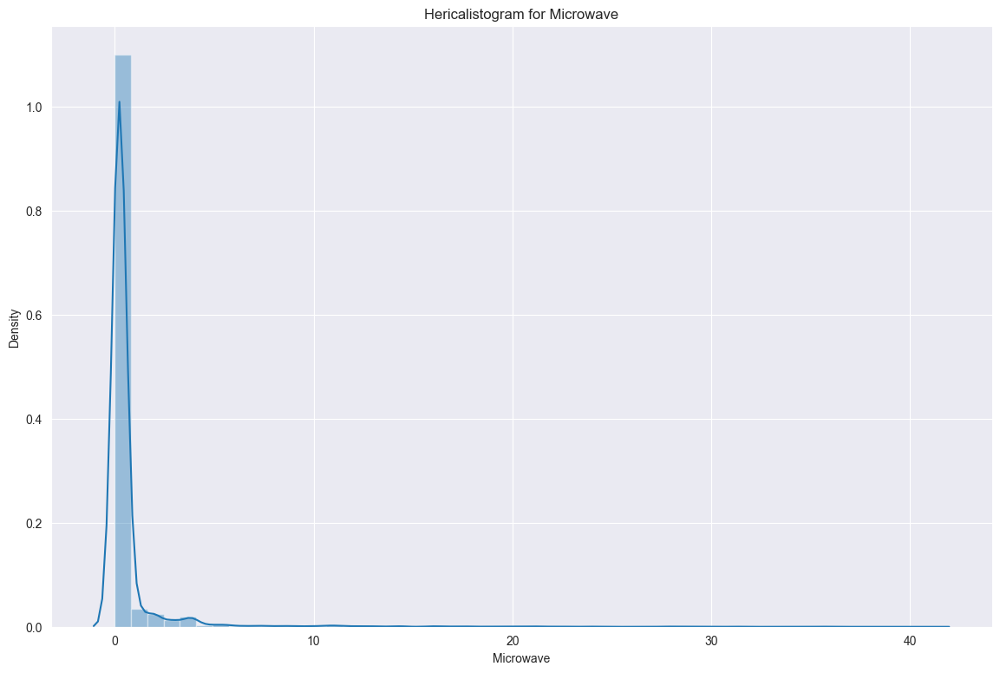

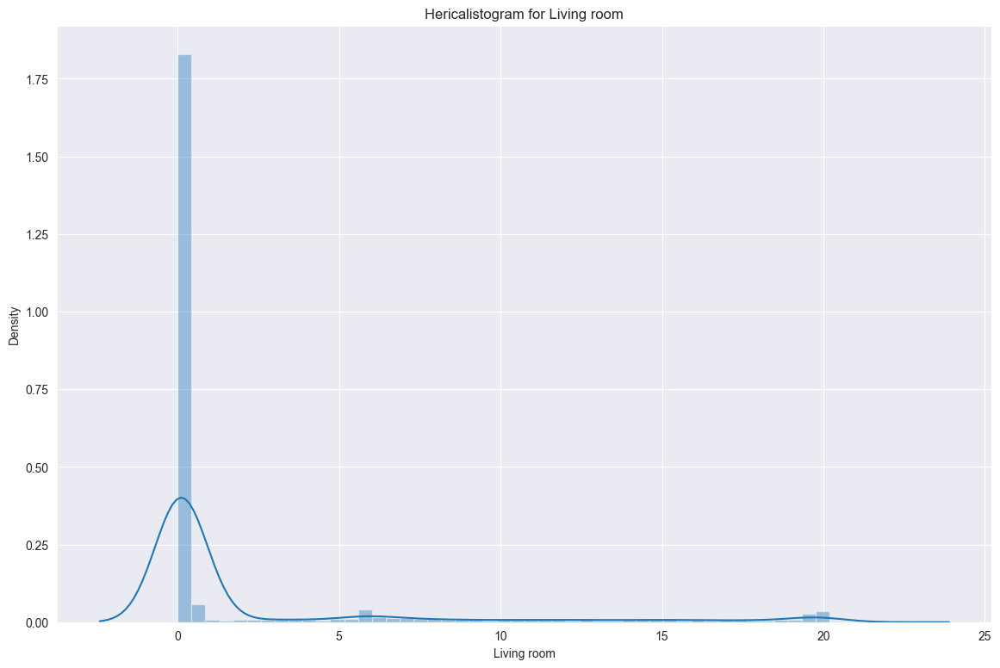

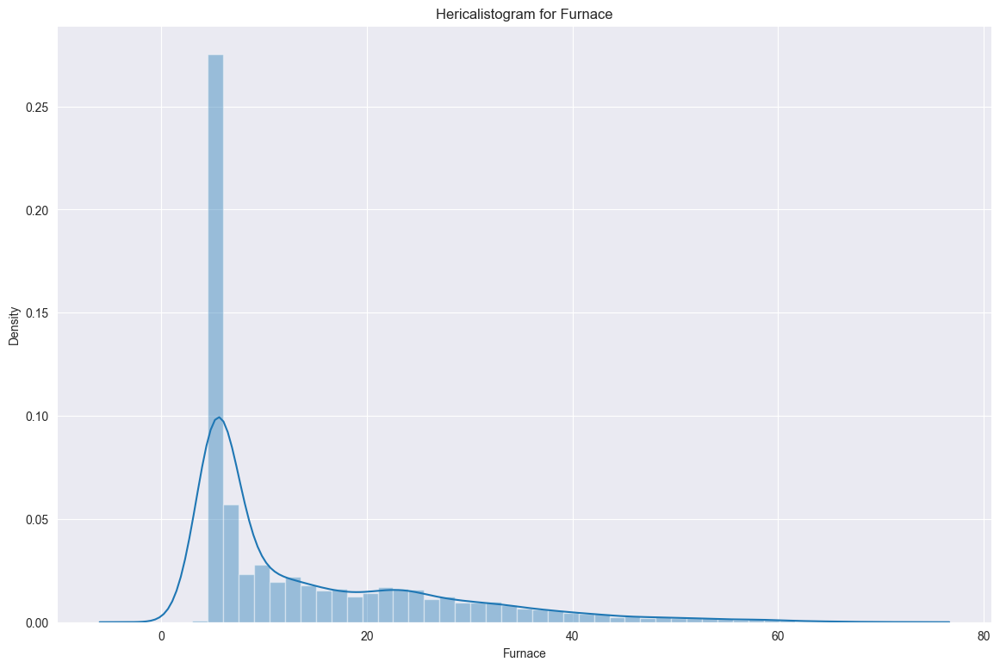

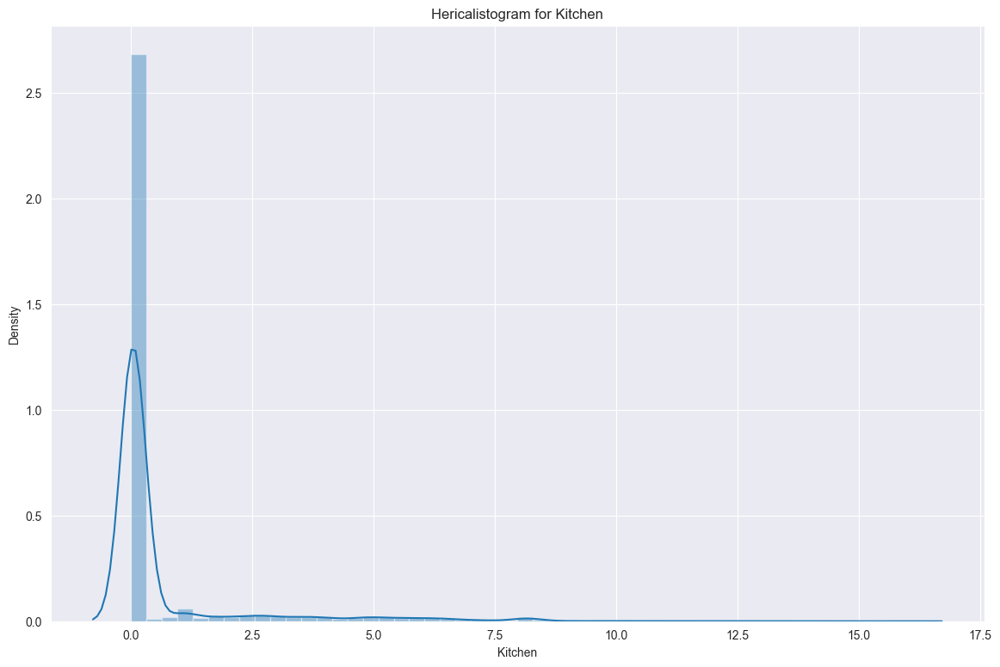

In [107]:
for feature in energy_per_hour:
  sns.distplot(energy_per_hour[feature], kde=True)
  plt.title('Hericalistogram for {}'.format(feature))
  plt.show()

In [108]:
weather_per_hour.skew()

Solar                  1.656858
temperature           -0.086616
humidity              -0.357622
visibility            -2.796324
apparentTemperature   -0.207651
pressure              -0.179318
windSpeed              0.925340
cloudCover             1.856251
windBearing           -0.511308
precipIntensity        7.287962
dewPoint              -0.278095
precipProbability      3.059458
dtype: float64

Null Value Handlingµ

In [109]:
data.isna().sum()

time                       0
House overall              0
Dishwasher                 0
Home office                0
Fridge                     0
Garage door                0
Kitchen                    0
Well                       0
Microwave                  0
Living room                0
Solar                      0
temperature                0
icon                    6465
humidity                   0
visibility                 0
summary                    0
apparentTemperature    12894
pressure                   0
windSpeed                  0
cloudCover                 0
windBearing                0
precipIntensity            0
dewPoint                   0
precipProbability          0
Furnace                    0
year                       0
month                      0
day                        0
hour                       0
minute                     0
timing                     0
season                     0
dtype: int64

In [110]:
data['icon'].fillna(data['icon'].mode()[0],inplace=True)
data['apparentTemperature'].fillna(data['apparentTemperature'].median(),inplace=True)
data.isna().sum()

time                   0
House overall          0
Dishwasher             0
Home office            0
Fridge                 0
Garage door            0
Kitchen                0
Well                   0
Microwave              0
Living room            0
Solar                  0
temperature            0
icon                   0
humidity               0
visibility             0
summary                0
apparentTemperature    0
pressure               0
windSpeed              0
cloudCover             0
windBearing            0
precipIntensity        0
dewPoint               0
precipProbability      0
Furnace                0
year                   0
month                  0
day                    0
hour                   0
minute                 0
timing                 0
season                 0
dtype: int64

Label encoding categorical column

In [111]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()#le has operations for label encoding


data['summary']=le.fit_transform(data['summary'])

## **Again taking energy per hour and weather per hour after filling null values, then resampling and concating into data per hour**

In [112]:
energy_data1 = data[['House overall', 'Dishwasher', 'Home office',
       'Fridge',  'Garage door',  'Well', 'Microwave',
       'Living room','Solar', 'Furnace','Kitchen']]
weather_data1 = data[['temperature', 'humidity', 'visibility', 'apparentTemperature',
       'pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity',
       'dewPoint', 'precipProbability']]
energy_data1.index = pd.to_datetime(energy_data.index)
weather_data1.index = pd.to_datetime(weather_data.index)

In [113]:
energy_data1 = energy_data1.set_index(data['time'])
energy_per_hour1 = energy_data1.resample('H').sum()
weather_data1 = weather_data1.set_index(data['time'])
weather_per_hour1 = weather_data1.resample('H').mean()
data_per_hour= pd.concat([energy_per_hour1, weather_per_hour1],axis=1)
data_per_hour

,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,visibility,apparentTemperature,pressure,windSpeed,cloudCover,windBearing,precipIntensity,dewPoint,precipProbability
time,,,,,,,,,,,,,,,,,,,,,,
2016-01-01 05:00:00,62.647783,0.003817,14.508850,2.271667,0.782767,0.062533,1.299100,0.090283,0.198417,23.591283,0.048667,36.131000,0.619667,10.000000,29.615000,1016.888000,9.150333,0.750,282.100000,0.000000,24.383333,0.000
2016-01-01 06:00:00,55.090017,0.005950,2.597617,4.531317,0.770167,0.061250,0.252967,0.097083,0.205300,27.402450,0.044116,35.838667,0.610000,10.000000,30.069500,1016.232000,8.284000,0.750,284.733333,0.000000,23.866000,0.000
2016-01-01 07:00:00,42.884167,0.002550,2.604967,3.569133,0.797917,0.060833,0.254733,0.097717,0.206900,22.330200,0.042717,35.385000,0.613000,10.000000,29.747667,1015.989000,7.927000,0.750,279.400000,0.000000,23.469000,0.000
2016-01-01 08:00:00,57.600767,0.008300,3.900833,3.624717,0.775517,0.060983,0.256450,0.098067,0.206850,36.982217,0.047550,35.282000,0.640000,10.000000,31.398167,1016.042000,5.684667,0.750,265.000000,0.000000,24.202667,0.000
2016-01-01 09:00:00,38.390183,0.003617,2.603500,2.106350,0.793200,0.060817,0.255467,0.099000,0.206350,20.630550,0.047167,35.451667,0.641667,10.000000,30.704833,1015.815000,6.975000,0.625,265.500000,0.000000,24.423333,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,65.819917,0.004500,2.511183,2.654150,0.768850,0.059550,0.185067,0.075633,0.248250,46.348000,0.042850,36.990000,0.712000,9.380000,29.392667,1012.775333,11.183333,0.816,189.666667,0.000373,28.414667,0.008
2016-12-16 00:00:00,76.595083,0.003568,2.502683,3.029500,0.751583,2.431317,0.180050,0.074133,0.246533,47.760350,0.037334,37.584167,0.721667,8.855333,29.813667,1012.628500,11.969500,0.310,197.633333,0.004313,29.379167,0.182
2016-12-16 01:00:00,75.613833,0.006000,2.515267,2.948417,0.764567,0.059950,0.186267,0.076550,0.248483,49.405067,0.044850,36.429333,0.801000,8.576333,28.988000,1012.129667,10.720667,0.310,197.900000,0.010600,30.864333,0.510


## **Correlation Table Weather data and Energy Data**


In [114]:
consumptions = energy_per_hour1.columns.tolist()
weather = weather_per_hour1.columns.tolist()
lists = [consumptions,]
for j in weather_per_hour1:
  correlations = []
  for i in energy_per_hour1:
    cor = data[i].corr(data[j])
    correlations.append(cor)
  lists.append(correlations)

names=['consumptions',]
for i in weather:
  names.append(i+'_corr')
data_corr = pd.DataFrame(np.column_stack(lists), columns=names).set_index('consumptions')

for i in data_corr.columns[:].tolist():
  data_corr[i] = data_corr[i].apply(float)

In [115]:
data_corr.style.applymap(lambda x: "background-color: red" if x > 0.1 else "background-color: orange" if x < -0.1 else "background-color: white")


,temperature_corr,humidity_corr,visibility_corr,apparentTemperature_corr,pressure_corr,windSpeed_corr,cloudCover_corr,windBearing_corr,precipIntensity_corr,dewPoint_corr,precipProbability_corr
consumptions,,,,,,,,,,,
House overall,0.010379,0.011511,-0.002609,0.003587,0.010730,-0.003853,-0.033460,0.011183,0.024836,0.016040,-0.003317
Dishwasher,-0.015716,-0.001868,-0.008064,-0.014559,0.000211,-0.001672,-0.002395,0.004016,0.006265,-0.016099,0.008189
Home office,0.011908,-0.006008,0.020638,0.009820,0.027091,-0.017898,-0.039897,0.012427,-0.029890,0.007594,-0.032861
Fridge,0.107466,0.030749,0.009019,0.105883,-0.000517,-0.024886,-0.023490,-0.008589,0.014253,0.115169,0.004794
Garage door,0.013511,-0.007399,0.002262,0.010961,-0.000276,0.000419,-0.007457,0.012327,-0.006941,0.008350,-0.006639
Well,-0.004691,-0.006590,-0.001069,-0.004666,0.002994,0.000677,-0.003029,0.004085,-0.004377,-0.007346,-0.002788
Microwave,0.001369,0.012541,-0.018359,0.002374,-0.001248,-0.006129,0.009580,-0.006218,0.026936,0.006286,0.016222
Living room,-0.049781,0.003189,-0.014494,-0.046451,0.013774,-0.013427,-0.009402,0.016713,-0.007506,-0.044865,-0.012254
Solar,0.090983,0.007608,-0.017650,0.088956,-0.000222,-0.056554,0.000664,-0.007882,0.030447,0.089664,0.041192


<Axes: >

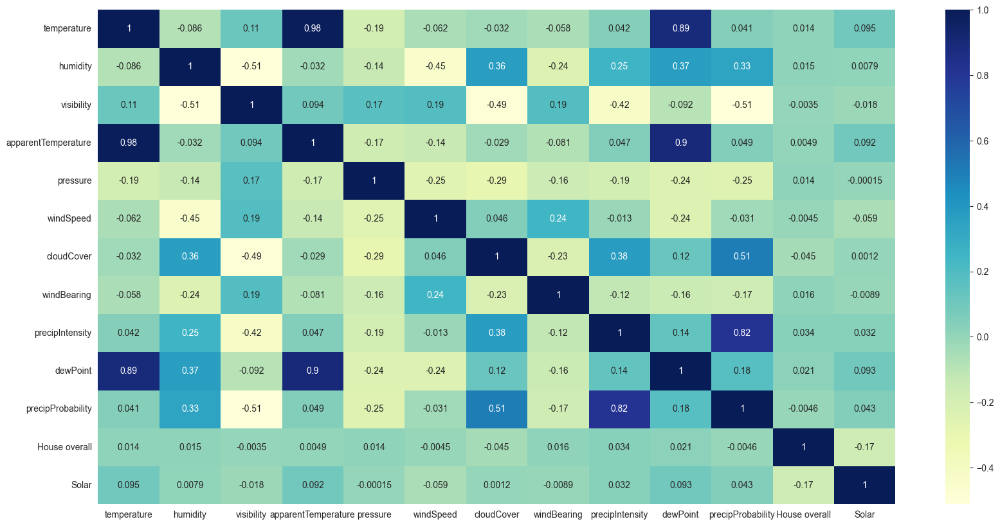

In [116]:
dfw = pd.concat([weather_per_hour1[['temperature', 'humidity', 'visibility', 'apparentTemperature','pressure', 'windSpeed', 'cloudCover', 'windBearing', 'precipIntensity','dewPoint','precipProbability']],energy_per_hour1[['House overall','Solar']]],axis=1)
corrmatrix = dfw.corr()
plt.subplots(figsize=(20,10))
sns.heatmap(corrmatrix,annot=True,cmap = 'YlGnBu')

<Axes: >

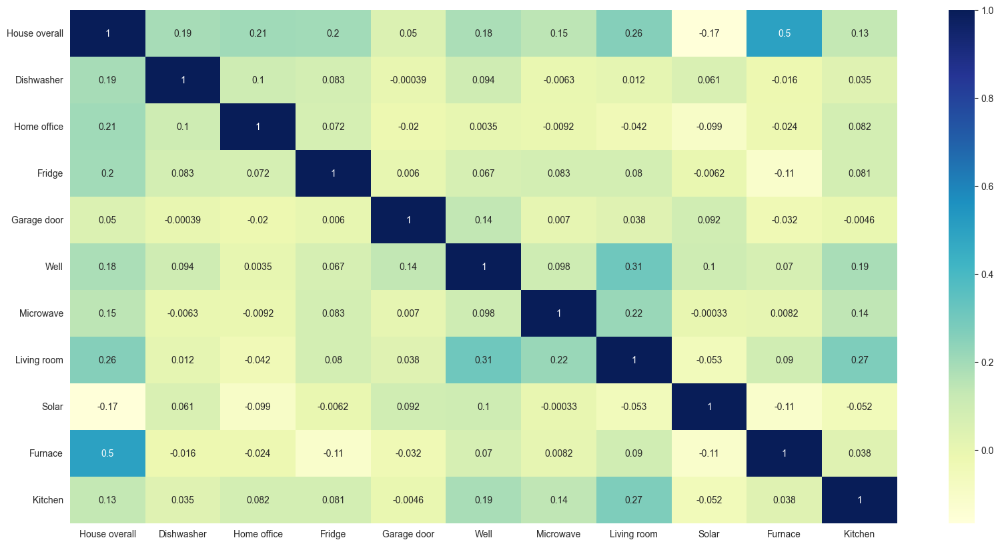

In [117]:
dfe= data_per_hour[['House overall','Dishwasher', 'Home office','Fridge',  'Garage door',  'Well', 'Microwave','Living room','Solar', 'Furnace','Kitchen']]
corrmatrix = dfe.corr()
plt.subplots(figsize=(20,10))
sns.heatmap(corrmatrix,annot=True,cmap = 'YlGnBu')

In [118]:
data_per_hour = data_per_hour.drop(['apparentTemperature','precipProbability','visibility',
       'cloudCover', 'windBearing', 'precipIntensity'],axis=1)

In [119]:
numerical=[features for features in data_per_hour.columns if data_per_hour[features].dtypes!="O"]

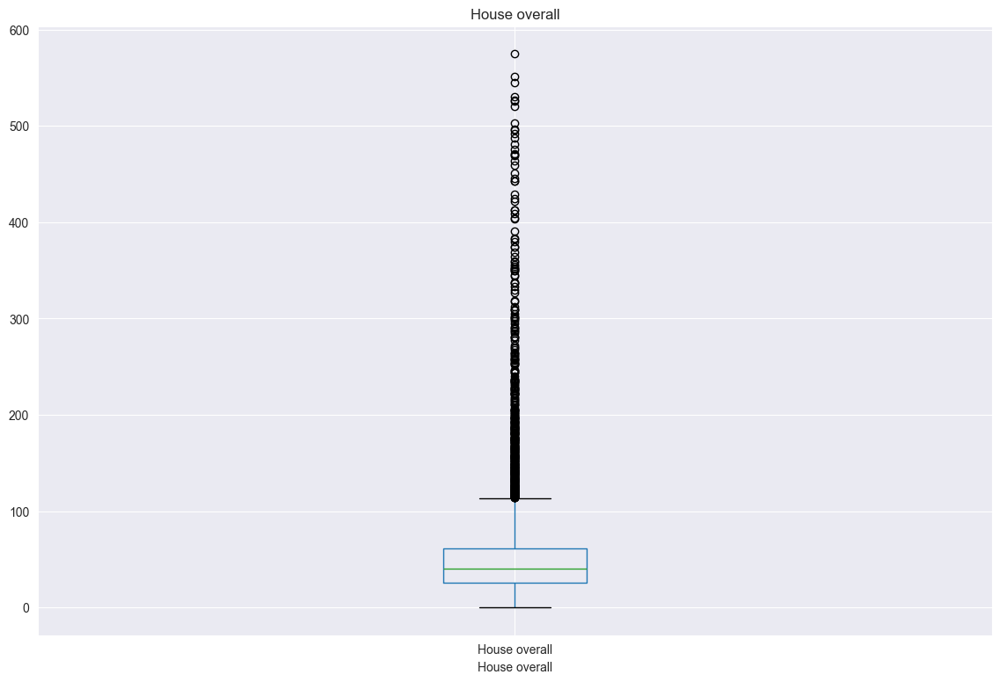

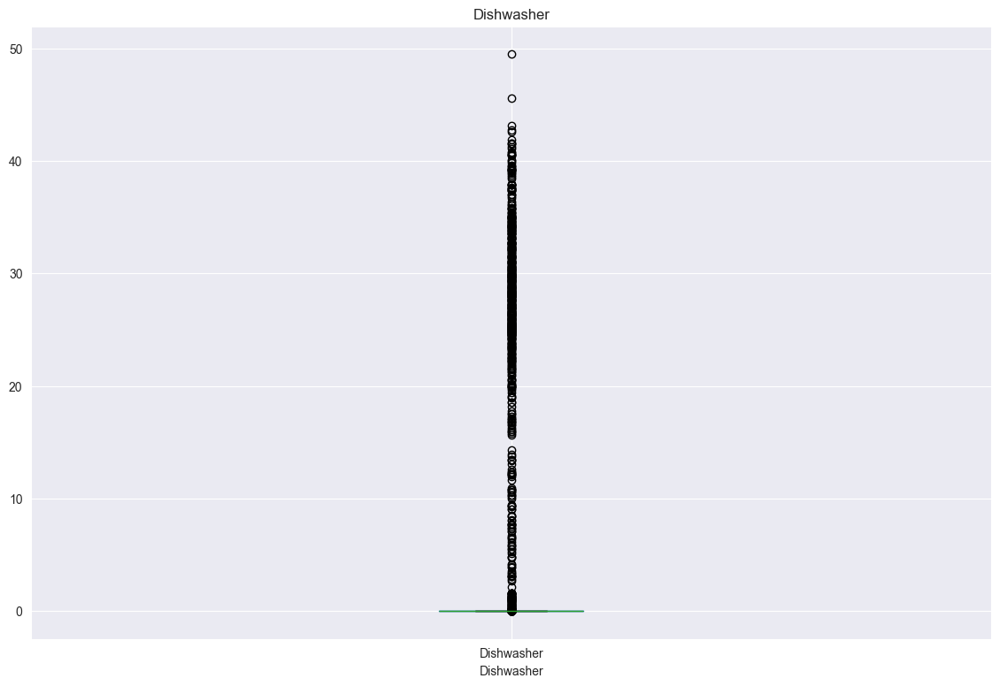

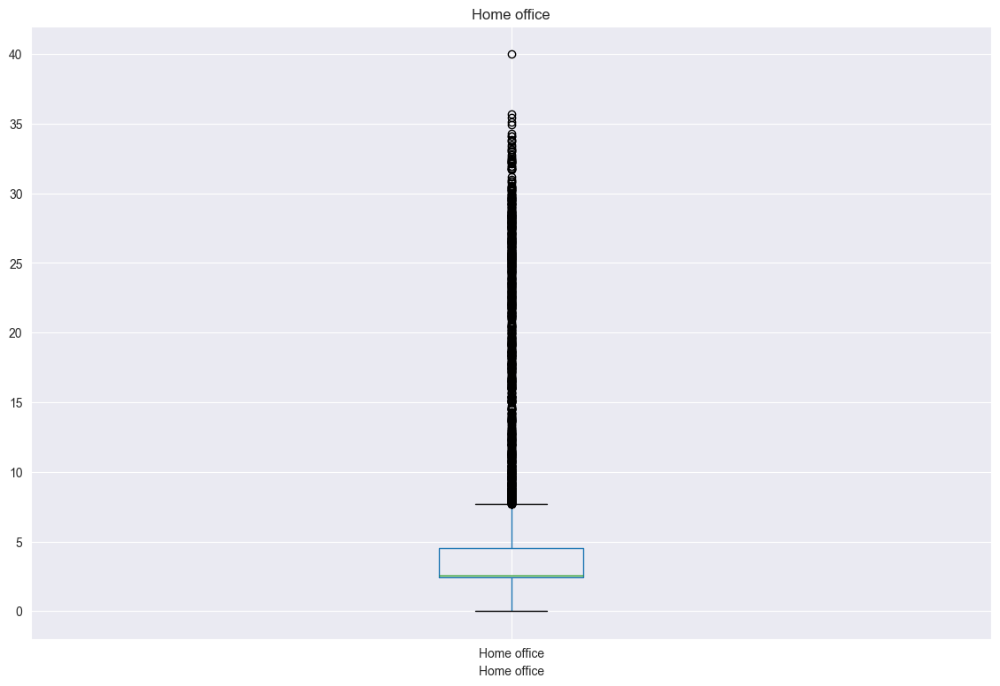

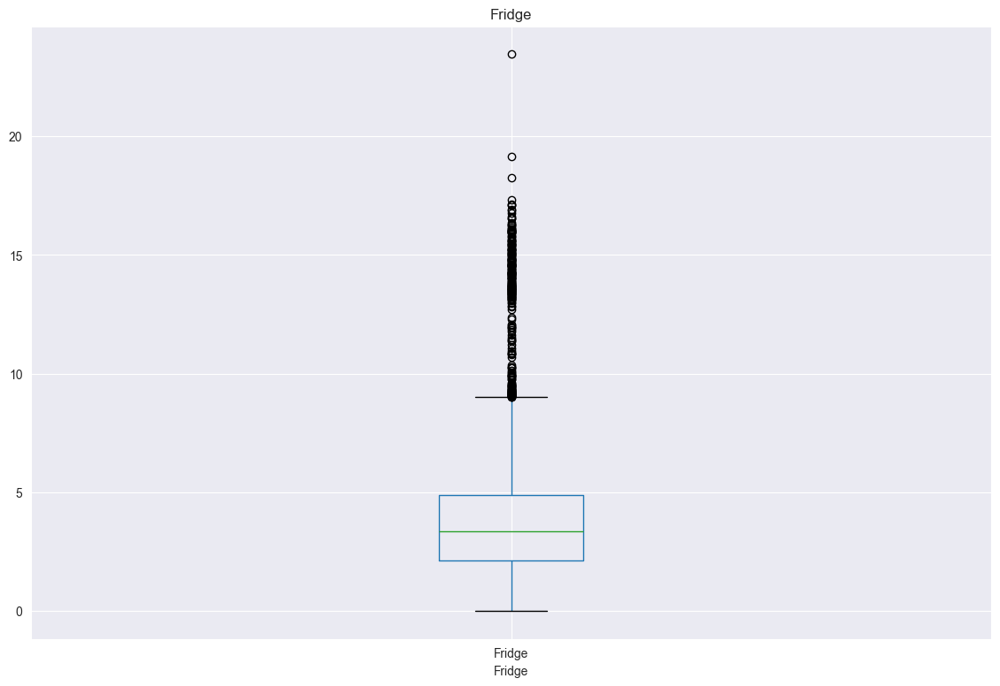

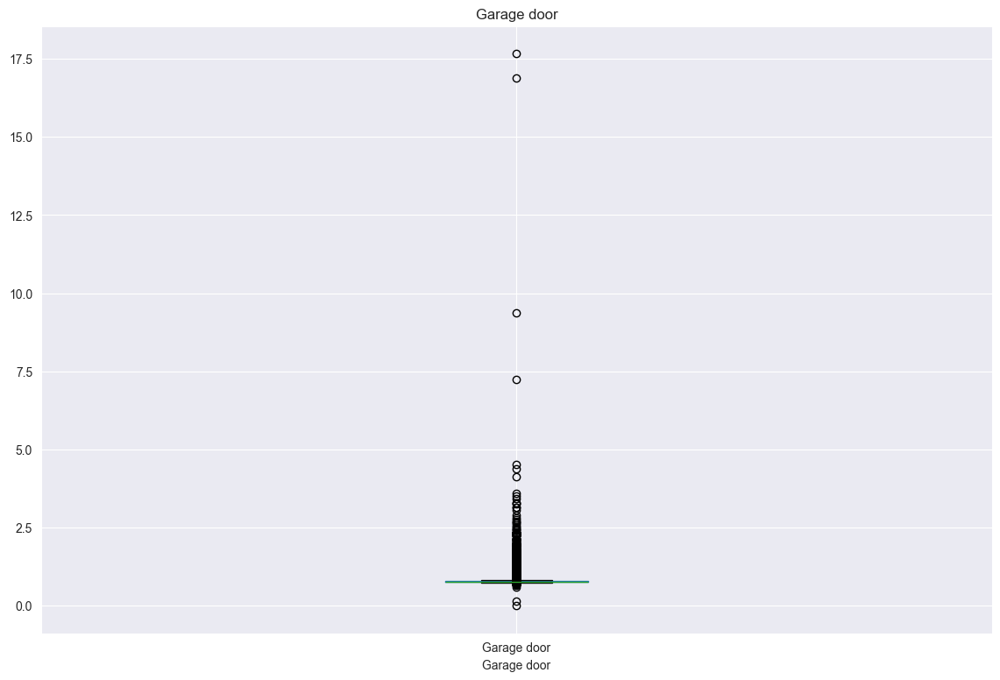

...

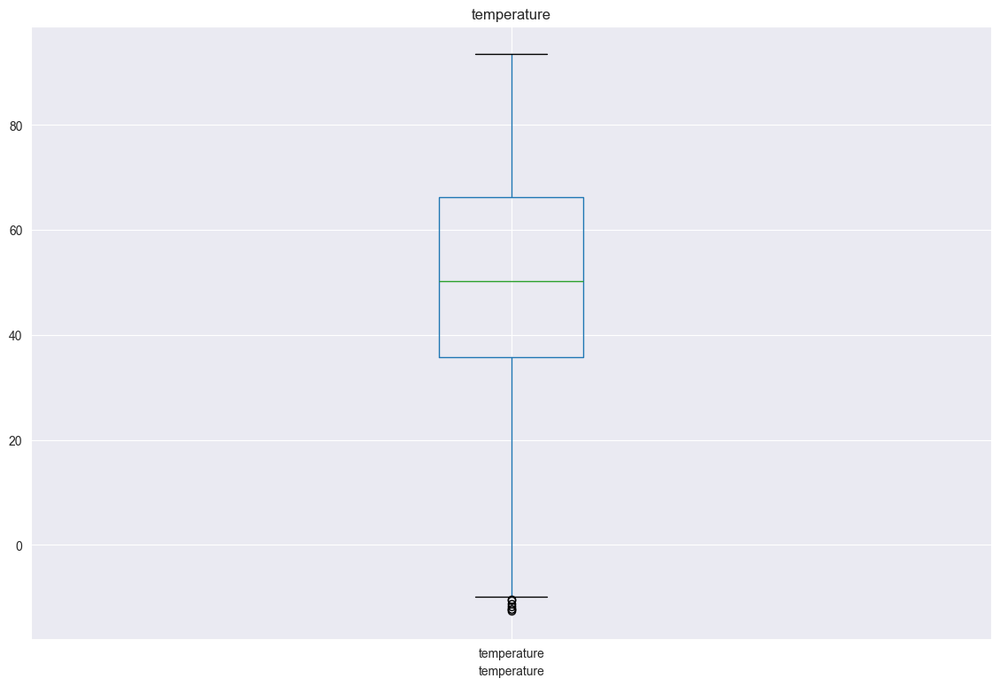

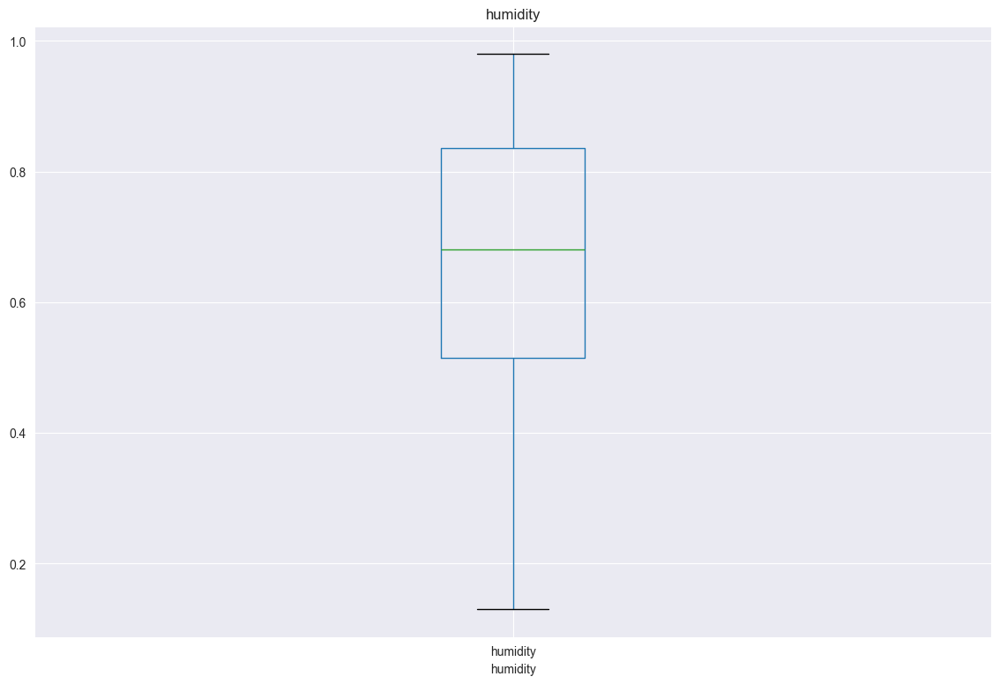

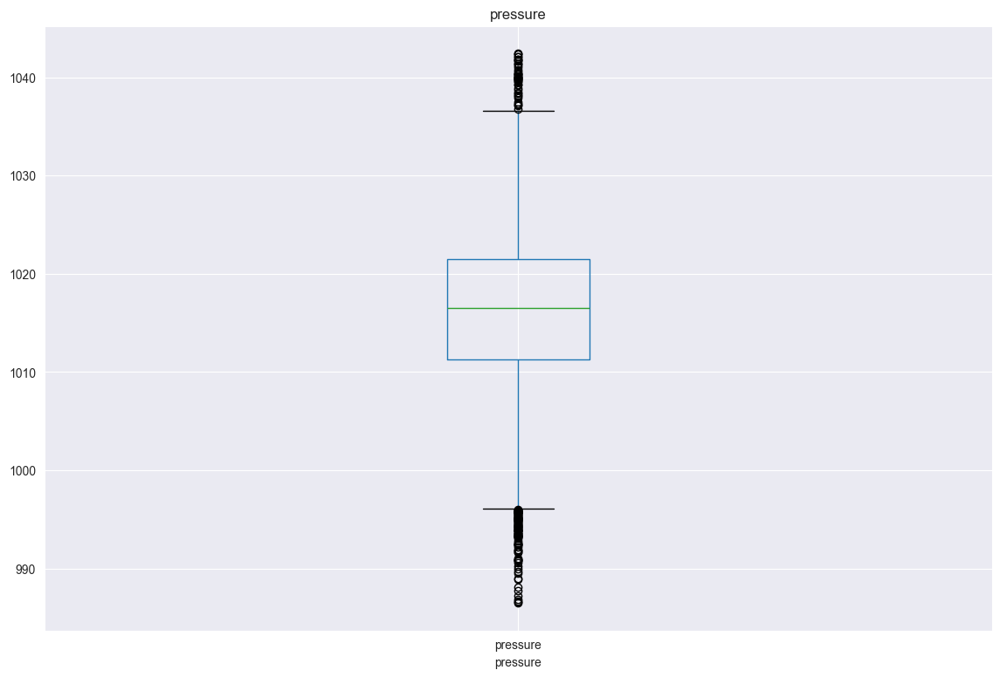

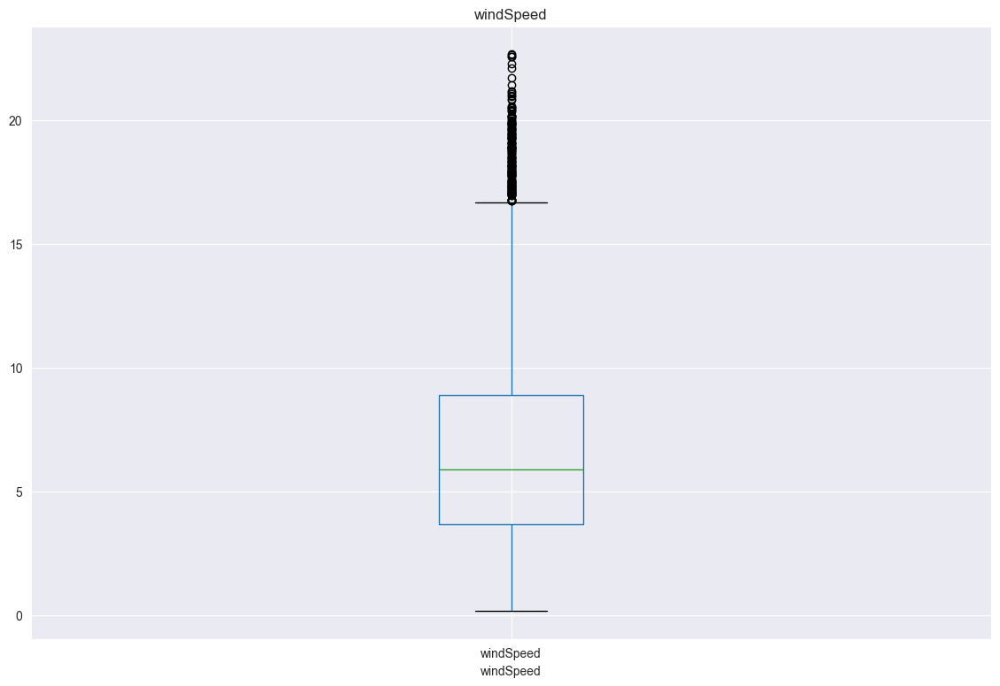

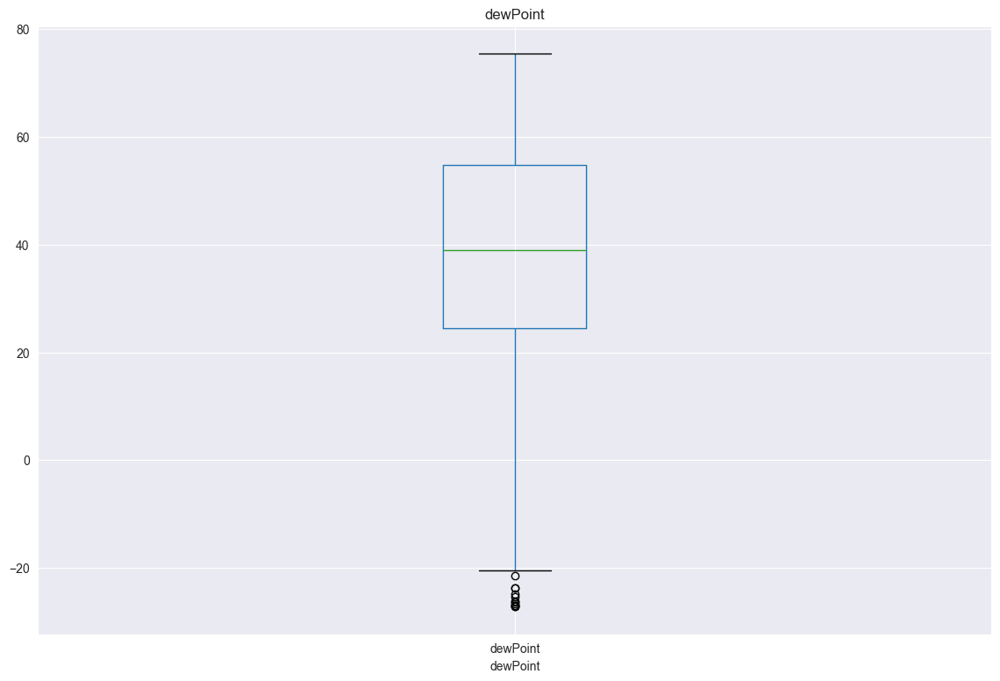

In [120]:
for feature in numerical:
  data_per_hour.boxplot(column= feature )
  plt.xlabel(feature)
  plt.title(feature)
  plt.show()

In [121]:
def find_outliers_IQR(data_per_hour):
    q1=data_per_hour.quantile(0.25)
    q3=data_per_hour.quantile(0.75)
    IQR=q3-q1
    outliers = data_per_hour[((data_per_hour<(q1-1.5*IQR)) | (data_per_hour>(q3+1.5*IQR)))]
    
    return outliers

for feature in numerical:
    outliers = find_outliers_IQR(data_per_hour[feature])

    print(feature)
    print('number of outliers: '+ str(len(outliers)))
    print('max outlier value: '+ str(outliers.max()))
    print('min outlier value: '+ str(outliers.min()))
    print('% of outliers: '+ str(len(outliers)/(len(data_per_hour[feature]))*100))
    print('\n')

House overall
number of outliers: 458
max outlier value: 574.811066651
min outlier value: 114.006366665
% of outliers: 5.453030122633646


Dishwasher
number of outliers: 761
max outlier value: 49.475366667
min outlier value: 0.025650001
% of outliers: 9.060602452672937


Home office
number of outliers: 933
max outlier value: 39.994233333
min outlier value: 7.692966666
% of outliers: 11.10846529348732


Fridge
number of outliers: 250
max outlier value: 23.459183333
min outlier value: 9.037066665
% of outliers: 2.976544826765091


Garage door
number of outliers: 1450
max outlier value: 17.666049995999998
min outlier value: 0.003
% of outliers: 17.263959995237528


Well
number of outliers: 2035
max outlier value: 31.924766662
min outlier value: 0.0
% of outliers: 24.229074889867842


Microwave
number of outliers: 2779
max outlier value: 40.893600002
min outlier value: 0.0
% of outliers: 33.087272294320755


Living room
number of outliers: 1992
max outlier value: 21.482916668
min outlier v

In [122]:
data_outlier=data_per_hour.copy()
data_outlier.reset_index(inplace=True)

In [123]:
def Season(month):
  if month in [1,2,3]:
    season = 'Winter'
  elif month in [4,5,6]:
     season = 'Spring'

  elif month in [7,8,9]:
     season = 'Summer' 
  elif month in [10,11,12]:
    season = 'Autumn'

  else:
    season='X'

  return season  

In [124]:
data_outlier['year'] = data_outlier['time'].apply(lambda x: x.year)
data_outlier['month'] = data_outlier['time'].apply(lambda x: x.month)
data_outlier['day'] = data_outlier['time'].apply(lambda x: x.day)

data_outlier['hour'] = data_outlier['time'].apply(lambda x: x.hour)
data_outlier['minute'] = data_outlier['time'].apply(lambda x: x.minute)
data_outlier['season'] = data_outlier['month'].apply(Season)
data_outlier

,time,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint,year,month,day,hour,minute,season
0,2016-01-01 05:00:00,62.647783,0.003817,14.508850,2.271667,0.782767,0.062533,1.299100,0.090283,0.198417,23.591283,0.048667,36.131000,0.619667,1016.888000,9.150333,24.383333,2016,1,1,5,0,Winter
1,2016-01-01 06:00:00,55.090017,0.005950,2.597617,4.531317,0.770167,0.061250,0.252967,0.097083,0.205300,27.402450,0.044116,35.838667,0.610000,1016.232000,8.284000,23.866000,2016,1,1,6,0,Winter
2,2016-01-01 07:00:00,42.884167,0.002550,2.604967,3.569133,0.797917,0.060833,0.254733,0.097717,0.206900,22.330200,0.042717,35.385000,0.613000,1015.989000,7.927000,23.469000,2016,1,1,7,0,Winter
3,2016-01-01 08:00:00,57.600767,0.008300,3.900833,3.624717,0.775517,0.060983,0.256450,0.098067,0.206850,36.982217,0.047550,35.282000,0.640000,1016.042000,5.684667,24.202667,2016,1,1,8,0,Winter
4,2016-01-01 09:00:00,38.390183,0.003617,2.603500,2.106350,0.793200,0.060817,0.255467,0.099000,0.206350,20.630550,0.047167,35.451667,0.641667,1015.815000,6.975000,24.423333,2016,1,1,9,0,Winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,2016-12-15 23:00:00,65.819917,0.004500,2.511183,2.654150,0.768850,0.059550,0.185067,0.075633,0.248250,46.348000,0.042850,36.990000,0.712000,1012.775333,11.183333,28.414667,2016,12,15,23,0,Autumn
8395,2016-12-16 00:00:00,76.595083,0.003568,2.502683,3.029500,0.751583,2.431317,0.180050,0.074133,0.246533,47.760350,0.037334,37.584167,0.721667,1012.628500,11.969500,29.379167,2016,12,16,0,0,Autumn
8396,2016-12-16 01:00:00,75.613833,0.006000,2.515267,2.948417,0.764567,0.059950,0.186267,0.076550,0.248483,49.405067,0.044850,36.429333,0.801000,1012.129667,10.720667,30.864333,2016,12,16,1,0,Autumn
8397,2016-12-16 02:00:00,66.021450,0.005117,2.513983,3.003783,0.777433,0.059600,0.186633,0.076183,0.249867,42.402033,0.043283,35.580833,0.836667,1011.711667,7.361667,31.118333,2016,12,16,2,0,Autumn


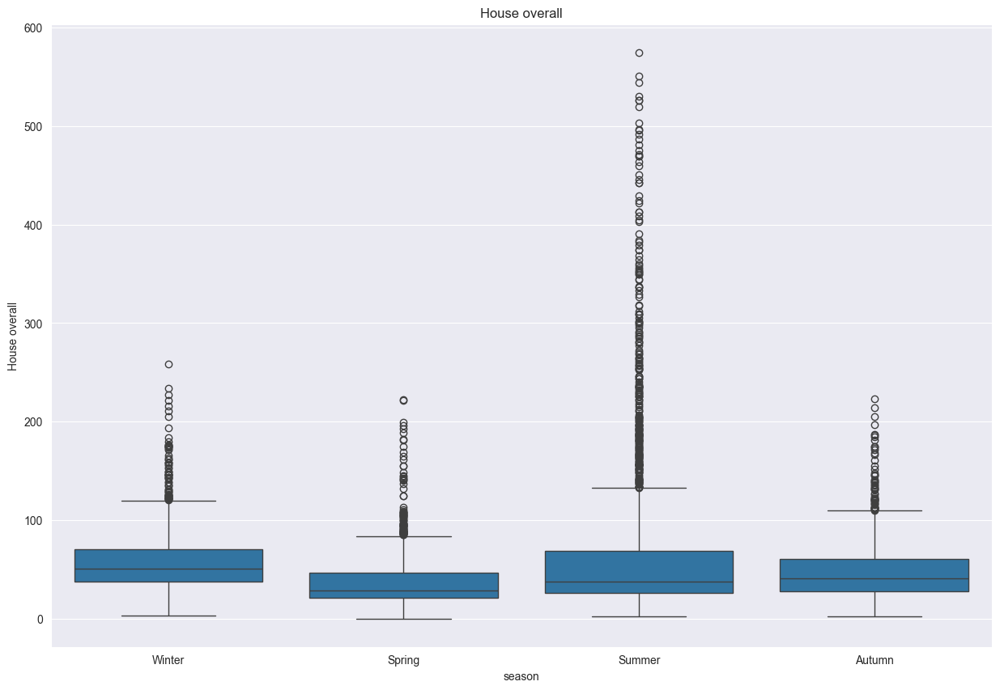

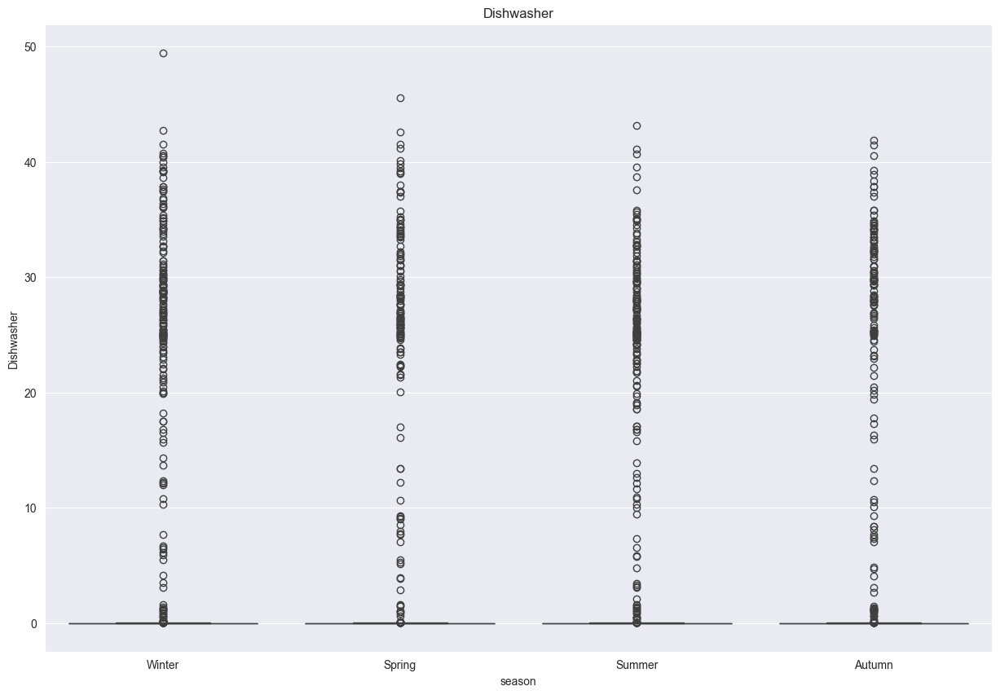

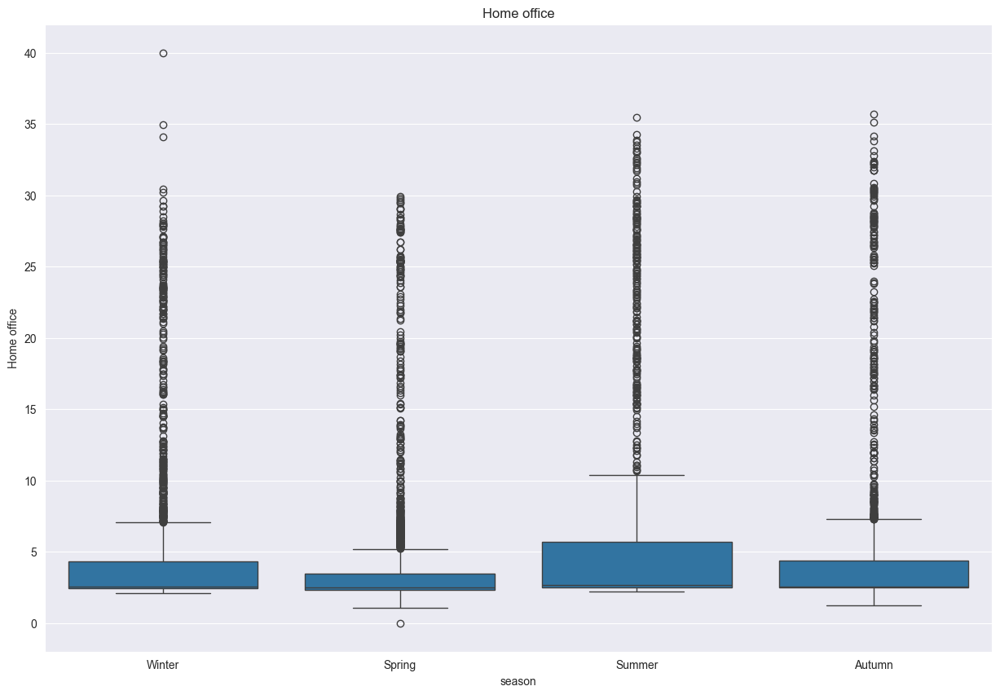

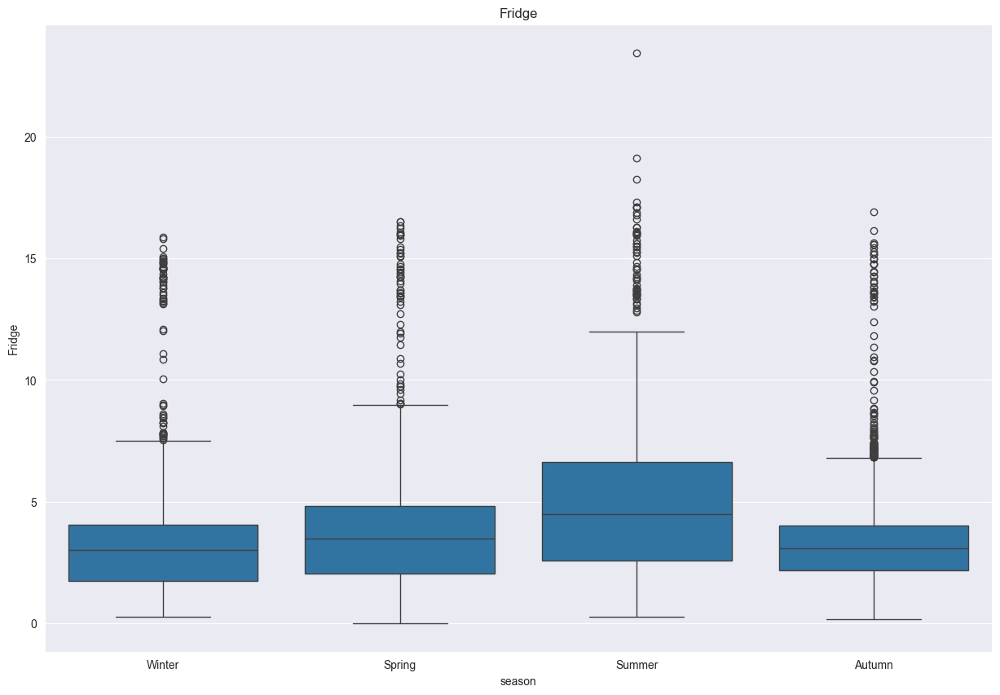

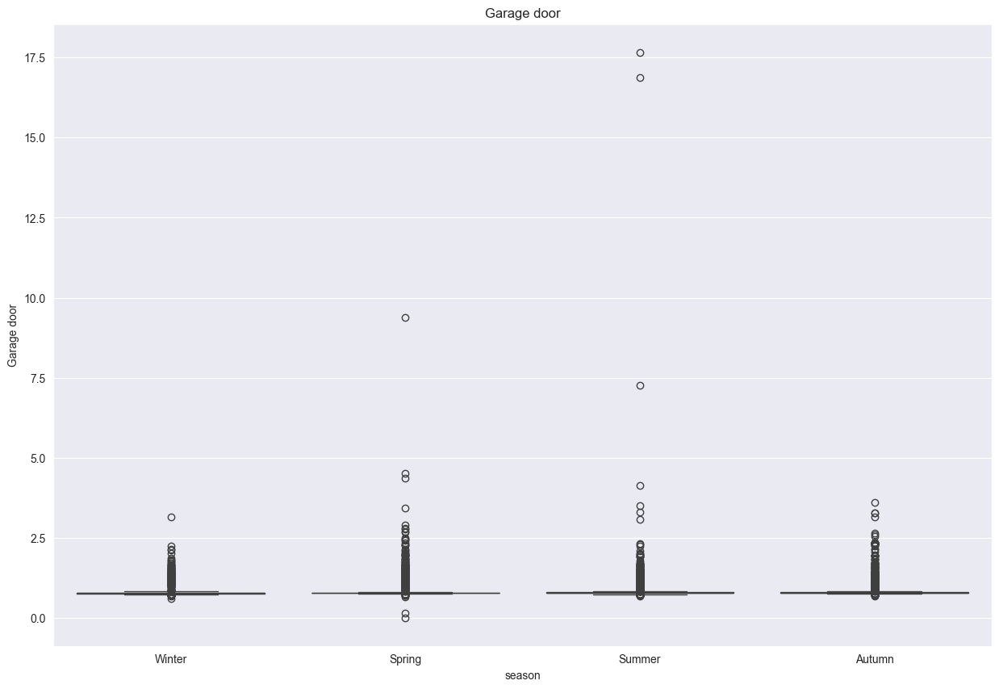

...

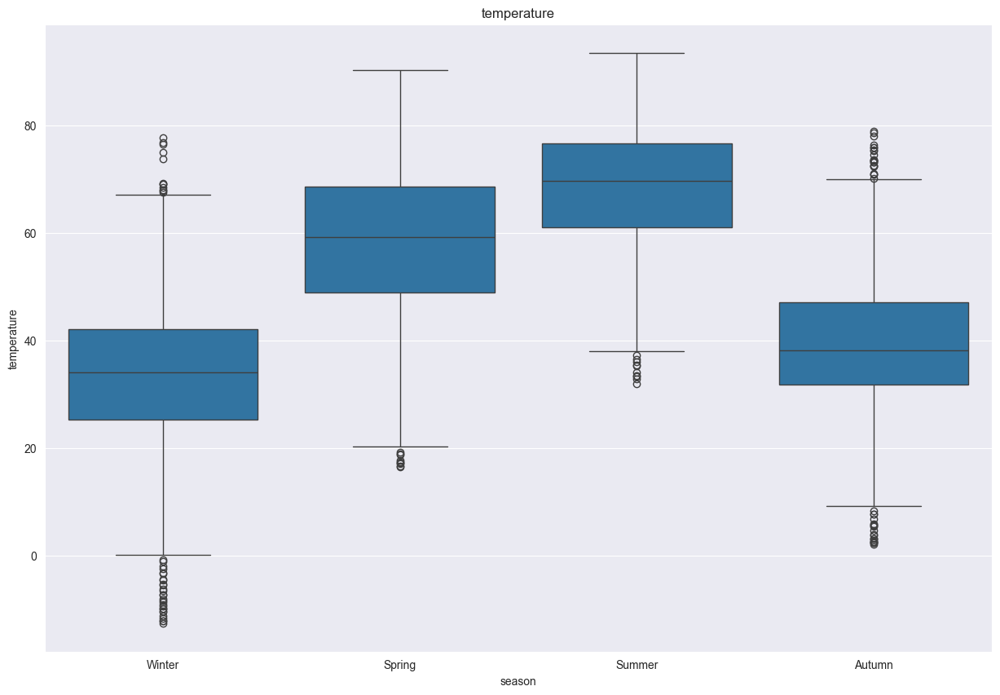

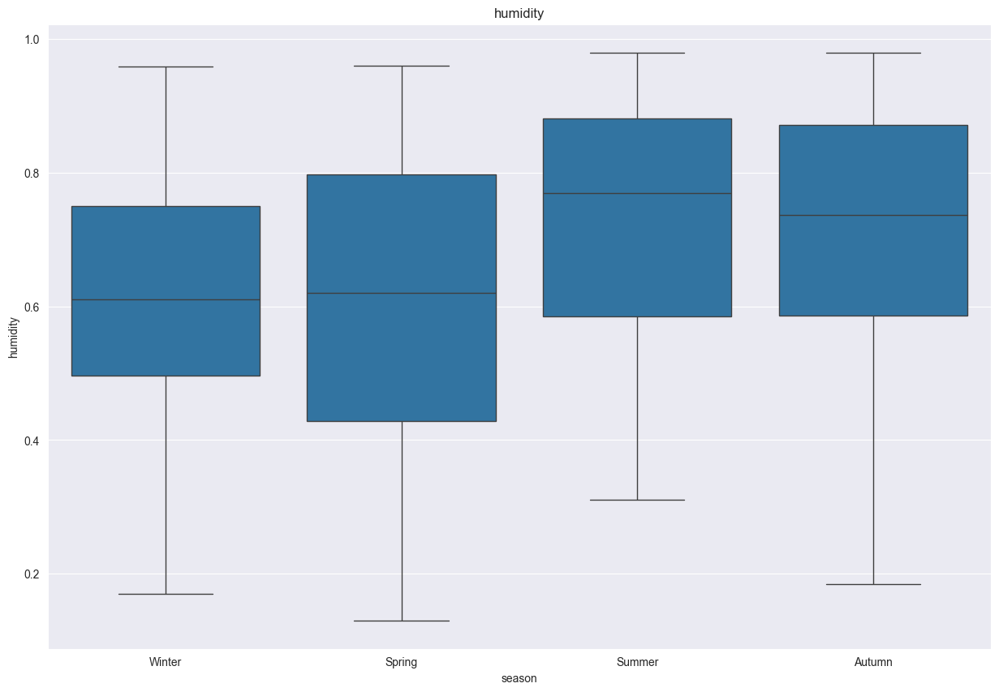

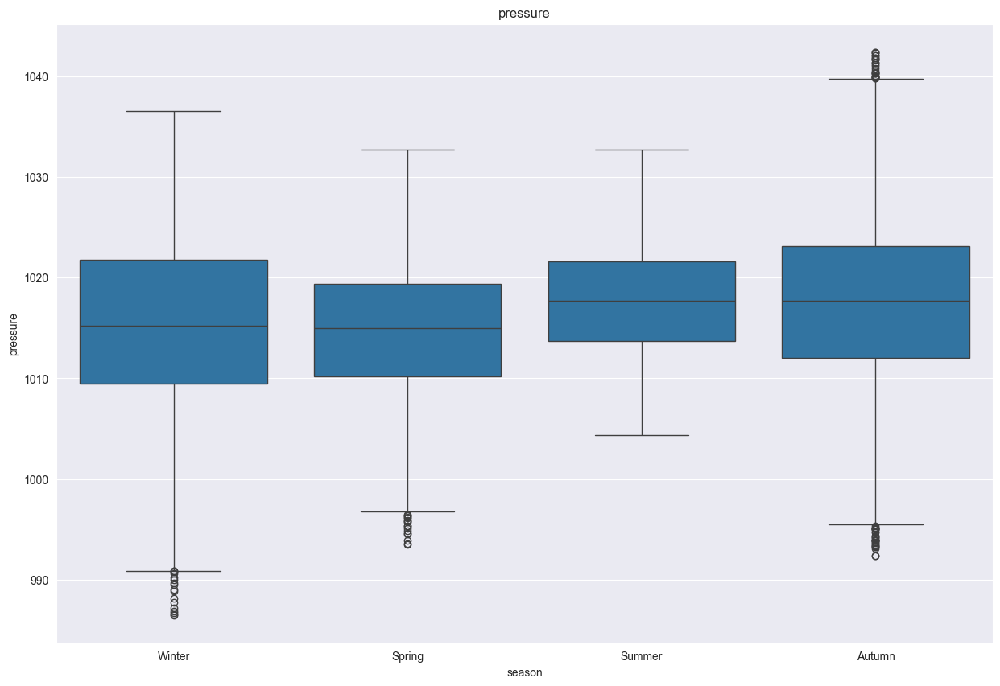

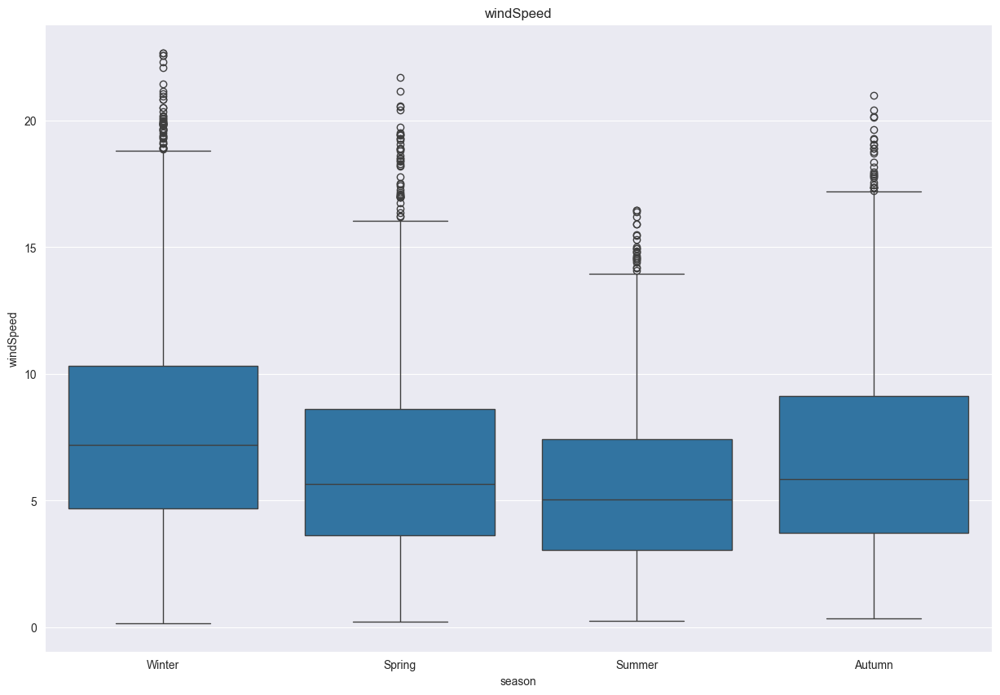

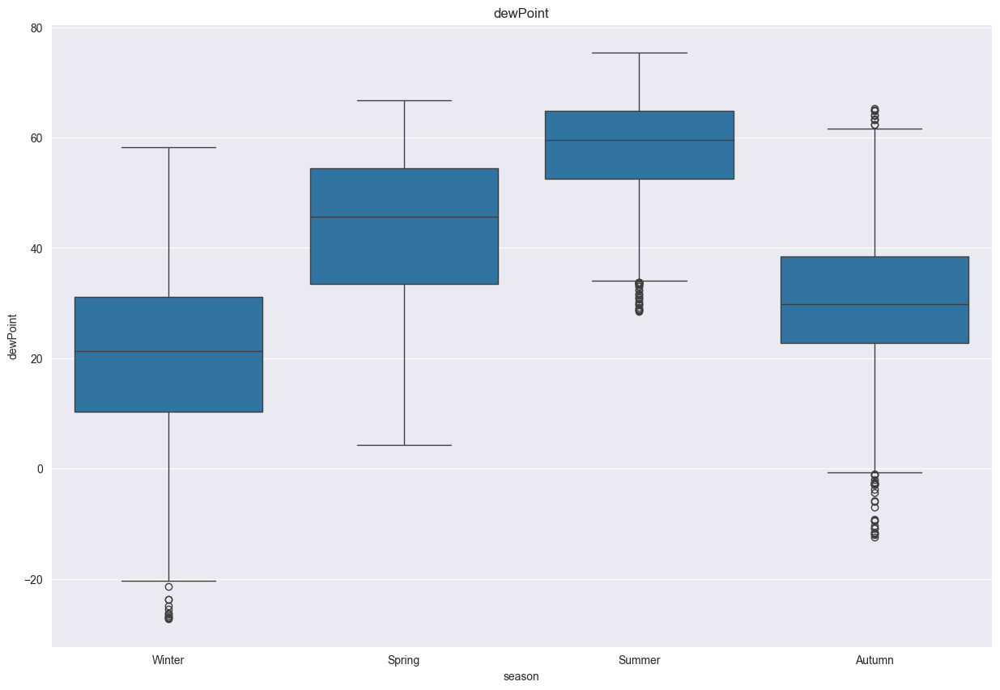

In [125]:
for feature in numerical:
    plt.figure(figsize=(15,10))
    sns.boxplot(x = 'season', y = feature, data = data_outlier)
    plt.title(feature)
    plt.show()
    

**Checking for Skewness**


In [126]:
numerical=[features for features in data_per_hour.columns if data_per_hour[features].dtypes!="O" ]


data_per_hour[numerical].agg(['skew', 'kurtosis']).transpose()

,skew,kurtosis
House overall,4.391533,29.006960
Dishwasher,3.795790,13.207983
Home office,3.126173,9.509382
Fridge,1.652709,4.752145
Garage door,26.430662,1097.543926
Well,4.072585,29.069358
Microwave,8.752651,97.012878
Living room,2.527888,5.292486
Solar,1.656856,1.423588
Furnace,1.531377,1.874823


## **Using Log and Box cox to transform data and bring down skewness**

In [127]:
numerical

['House overall',
 'Dishwasher',
 'Home office',
 'Fridge',
 'Garage door',
 'Well',
 'Microwave',
 'Living room',
 'Solar',
 'Furnace',
 'Kitchen',
 'temperature',
 'humidity',
 'pressure',
 'windSpeed',
 'dewPoint']

In [128]:
df1=data_per_hour.copy()
df1

,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint
time,,,,,,,,,,,,,,,,
2016-01-01 05:00:00,62.647783,0.003817,14.508850,2.271667,0.782767,0.062533,1.299100,0.090283,0.198417,23.591283,0.048667,36.131000,0.619667,1016.888000,9.150333,24.383333
2016-01-01 06:00:00,55.090017,0.005950,2.597617,4.531317,0.770167,0.061250,0.252967,0.097083,0.205300,27.402450,0.044116,35.838667,0.610000,1016.232000,8.284000,23.866000
2016-01-01 07:00:00,42.884167,0.002550,2.604967,3.569133,0.797917,0.060833,0.254733,0.097717,0.206900,22.330200,0.042717,35.385000,0.613000,1015.989000,7.927000,23.469000
2016-01-01 08:00:00,57.600767,0.008300,3.900833,3.624717,0.775517,0.060983,0.256450,0.098067,0.206850,36.982217,0.047550,35.282000,0.640000,1016.042000,5.684667,24.202667
2016-01-01 09:00:00,38.390183,0.003617,2.603500,2.106350,0.793200,0.060817,0.255467,0.099000,0.206350,20.630550,0.047167,35.451667,0.641667,1015.815000,6.975000,24.423333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,65.819917,0.004500,2.511183,2.654150,0.768850,0.059550,0.185067,0.075633,0.248250,46.348000,0.042850,36.990000,0.712000,1012.775333,11.183333,28.414667
2016-12-16 00:00:00,76.595083,0.003568,2.502683,3.029500,0.751583,2.431317,0.180050,0.074133,0.246533,47.760350,0.037334,37.584167,0.721667,1012.628500,11.969500,29.379167
2016-12-16 01:00:00,75.613833,0.006000,2.515267,2.948417,0.764567,0.059950,0.186267,0.076550,0.248483,49.405067,0.044850,36.429333,0.801000,1012.129667,10.720667,30.864333


In [129]:
for i in df1[[ 'Well', 'Microwave', 'Living room','Dishwasher','Kitchen']]:
  df1[i] = df1[i].apply(lambda x:x**(1/3))
  print('original skewness: {}'.format(i),data_per_hour[i].skew(),'\nSkewness after transformation :',df1[i].skew())
  

original skewness: Well 4.072585006851056 
Skewness after transformation : 1.603356939585632
original skewness: Microwave 8.752651338248734 
Skewness after transformation : 4.179675315198244
original skewness: Living room 2.5278882202891744 
Skewness after transformation : 1.8424430275757255
original skewness: Dishwasher 3.795789769397606 
Skewness after transformation : 3.3493276681313584
original skewness: Kitchen 3.4560468474129094 
Skewness after transformation : 2.376458185603015


In [130]:
df1['windSpeed'] = df1['windSpeed'].apply(lambda x: x ** (1 / 2))
print('original skewness: {}'.format(i), data_per_hour['windSpeed'].skew(), '\nSkewness after transformation :',df1['windSpeed'].skew())
df1['Home office'] = df1['Home office'].apply(lambda x:x**(1/2))
print('original skewness: {}'.format(i),data_per_hour['Home office'].skew(),'\nSkewness after transformation :',df1['Home office'].skew())
df1['House overall'] = df1['House overall'].apply(lambda x:x**(1/3))
print('original skewness:{}'.format(i),data_per_hour['House overall'].skew(),'\nSkewness after transformation :',df1['House overall'].skew())
df1['dewPoint'] = df1['dewPoint'].apply(lambda x:x**(1/0.25))
print('original skewness:{}'.format(i),data_per_hour['dewPoint'].skew(),'\nSkewness after transformation :',df1['dewPoint'].skew())

original skewness: Kitchen 0.9253398373318391 
Skewness after transformation : 0.21153357895844974
original skewness: Kitchen 3.126172516242845 
Skewness after transformation : 2.441687480101787
original skewness:Kitchen 4.391532509988488 
Skewness after transformation : 1.031661399913449
original skewness:Kitchen -0.278095314978115 
Skewness after transformation : 1.3377775779907923


In [131]:
for i in df1[[ 'Fridge', 'Solar']]:
  df1[i] = df1[i].apply(lambda x:x**(1/-3))
  print('original skewness : {}'.format(i),data_per_hour[i].skew(),'\nSkewness after transformation :',df1[i].skew())

original skewness : Fridge 1.6527092852044682 
Skewness after transformation : 2.574661132070794
original skewness : Solar 1.6568563616586276 
Skewness after transformation : -0.36996222169212445


In [132]:
df1['Garage door'] = df1['Garage door'].apply(lambda x:x**(1/3))
print('original skewness: {}'.format(i),data_per_hour['Garage door'].skew(),'\nSkewness after transformation :',df1['Garage door'].skew())

original skewness: Solar 26.430661528042787 
Skewness after transformation : 6.295830782631489


In [133]:
df1.skew()

House overall    1.031661
Dishwasher       3.349328
Home office      2.441687
Fridge           2.574661
Garage door      6.295831
Well             1.603357
Microwave        4.179675
Living room      1.842443
Solar           -0.369962
Furnace          1.531377
Kitchen          2.376458
temperature     -0.086616
humidity        -0.357622
pressure        -0.179318
windSpeed        0.211534
dewPoint         1.337778
dtype: float64

In [134]:
df1

,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint
time,,,,,,,,,,,,,,,,
2016-01-01 05:00:00,3.971628,0.156284,3.809048,0.760709,0.921603,0.396921,1.091141,0.448610,1.714512,23.591283,0.365099,36.131000,0.619667,1016.888000,3.024952,353486.069148
2016-01-01 06:00:00,3.805026,0.181209,1.611712,0.604308,0.916632,0.394187,0.632443,0.459602,1.695133,27.402450,0.353346,35.838667,0.610000,1016.232000,2.878194,324428.161272
2016-01-01 07:00:00,3.500249,0.136627,1.613991,0.654353,0.927511,0.393291,0.633911,0.460599,1.690752,22.330200,0.349569,35.385000,0.613000,1015.989000,2.815493,303373.987474
2016-01-01 08:00:00,3.861975,0.202471,1.975053,0.650991,0.918749,0.393614,0.635332,0.461148,1.690888,36.982217,0.362285,35.282000,0.640000,1016.042000,2.384254,343125.407794
2016-01-01 09:00:00,3.373443,0.153504,1.613536,0.780111,0.925680,0.393255,0.634519,0.462607,1.692253,20.630550,0.361309,35.451667,0.641667,1015.815000,2.641023,355811.308856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,4.037561,0.165096,1.584671,0.722257,0.916109,0.390506,0.569870,0.422900,1.591122,46.348000,0.349932,36.990000,0.712000,1012.775333,3.344149,651883.911460
2016-12-16 00:00:00,4.246850,0.152799,1.581987,0.691103,0.909199,1.344664,0.564674,0.420086,1.594807,47.760350,0.334221,37.584167,0.721667,1012.628500,3.459697,745002.777474
2016-12-16 01:00:00,4.228637,0.181714,1.585959,0.697381,0.914405,0.391378,0.571099,0.424602,1.590624,49.405067,0.355294,36.429333,0.801000,1012.129667,3.274243,907460.233836


In [135]:
(df1 < 0).sum().sum()

np.int64(28)

In [136]:
for i in df1.columns:
  print(np.where((df1[i] < 0)))

(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026,
       1027, 1028, 1029, 1030, 1031, 1041, 1042, 1043, 1044, 1045, 1046,
       1047, 1048, 1049, 1050, 1051, 1052]),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)
(array([], dtype=int64),)


In [137]:
df1.skew()

House overall    1.031661
Dishwasher       3.349328
Home office      2.441687
Fridge           2.574661
Garage door      6.295831
Well             1.603357
Microwave        4.179675
Living room      1.842443
Solar           -0.369962
Furnace          1.531377
Kitchen          2.376458
temperature     -0.086616
humidity        -0.357622
pressure        -0.179318
windSpeed        0.211534
dewPoint         1.337778
dtype: float64

House overall
Skew : 1.03


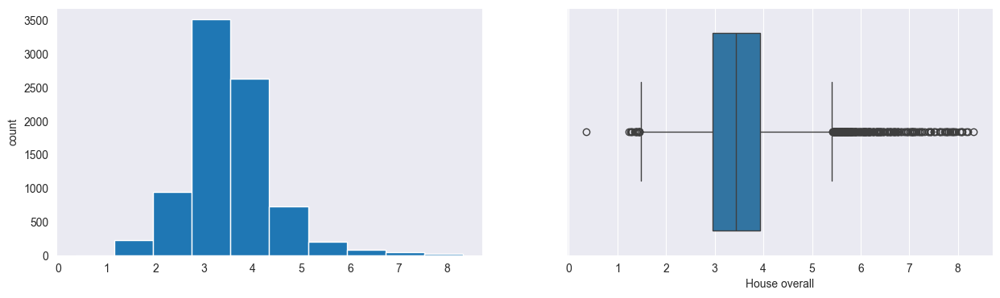

Dishwasher
Skew : 3.35


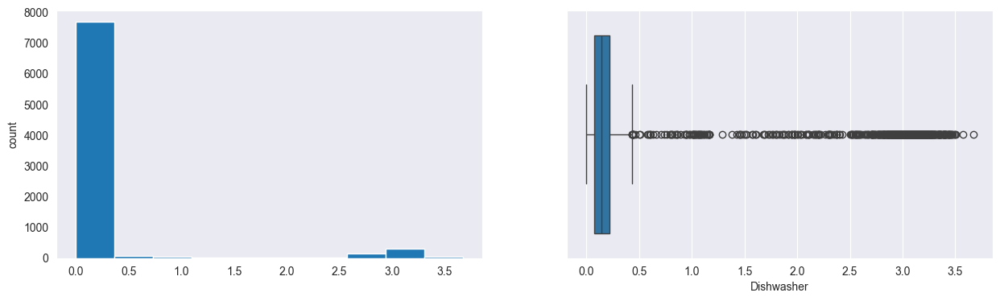

Home office
Skew : 2.44


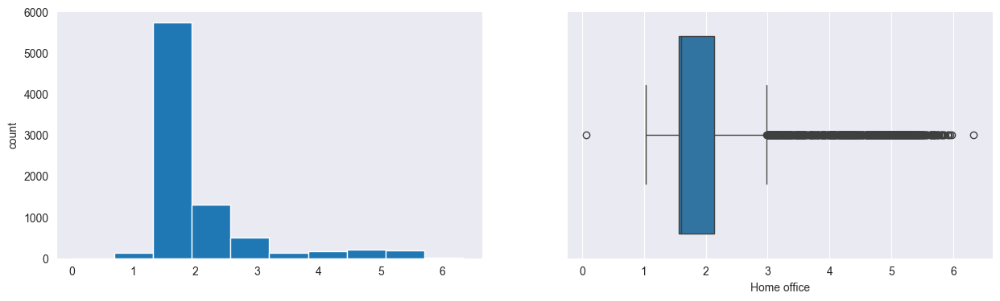

Fridge
Skew : 2.57


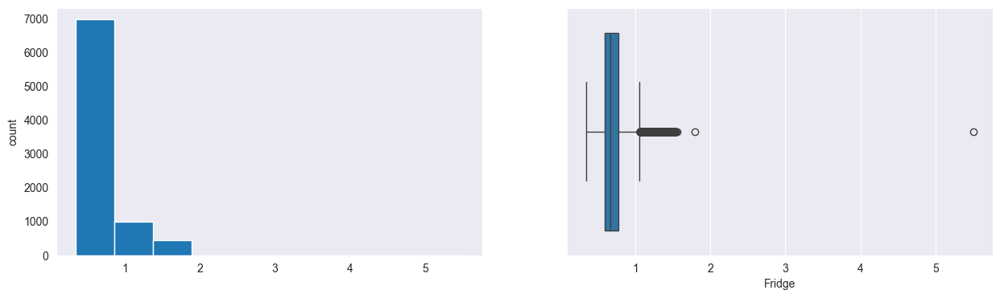

Garage door
Skew : 6.3


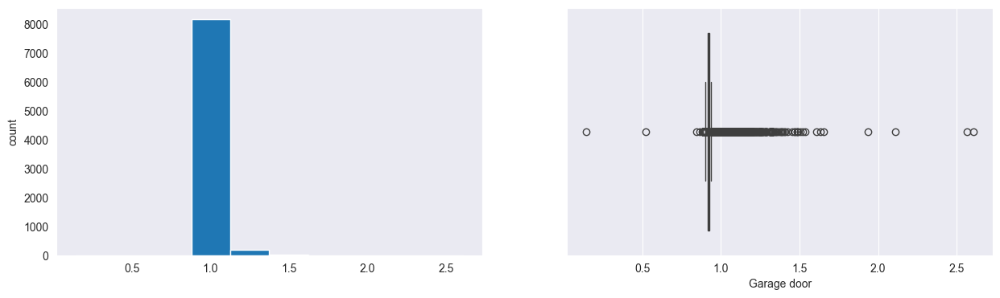

Well
Skew : 1.6


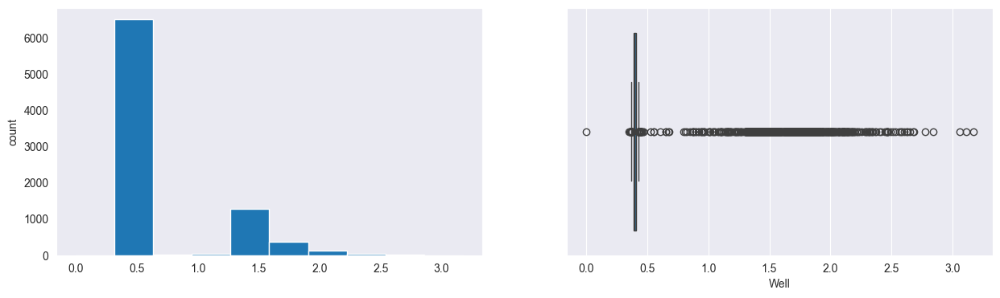

Microwave
Skew : 4.18


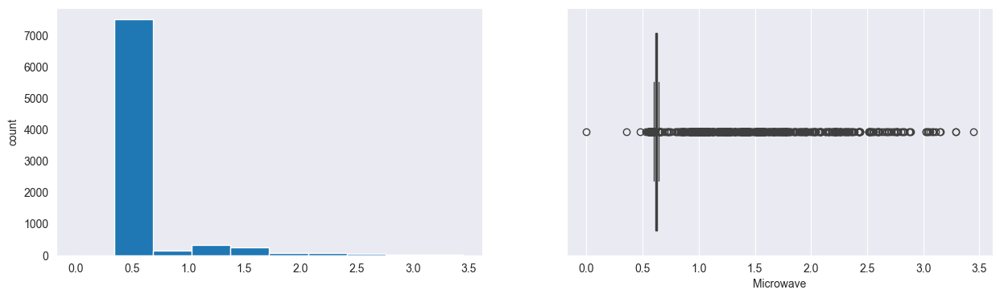

Living room
Skew : 1.84


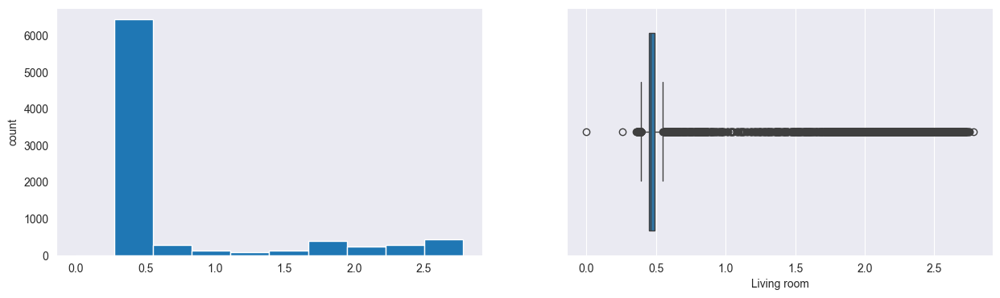

Solar
Skew : -0.37


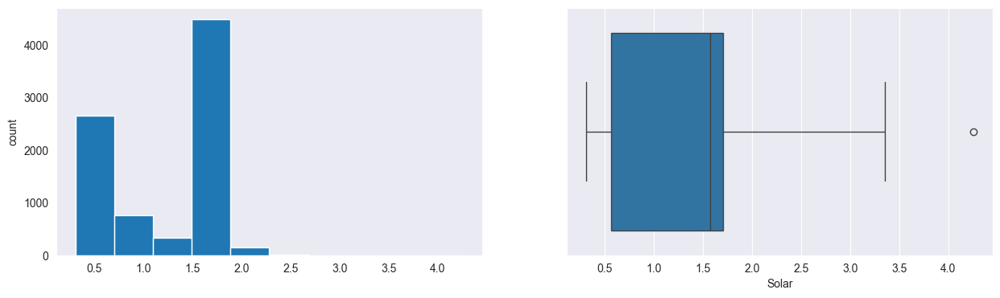

Furnace
Skew : 1.53


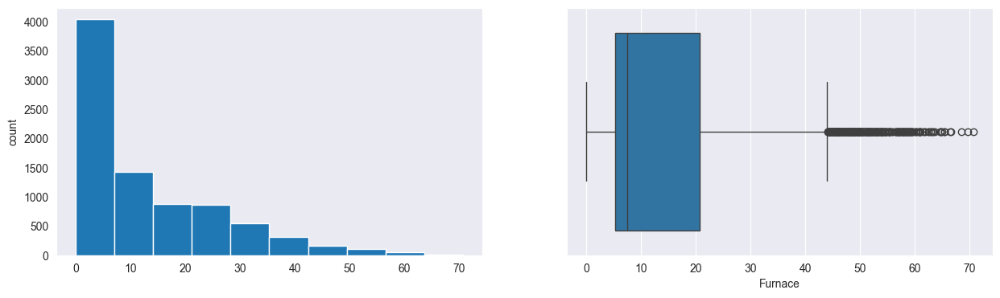

Kitchen
Skew : 2.38


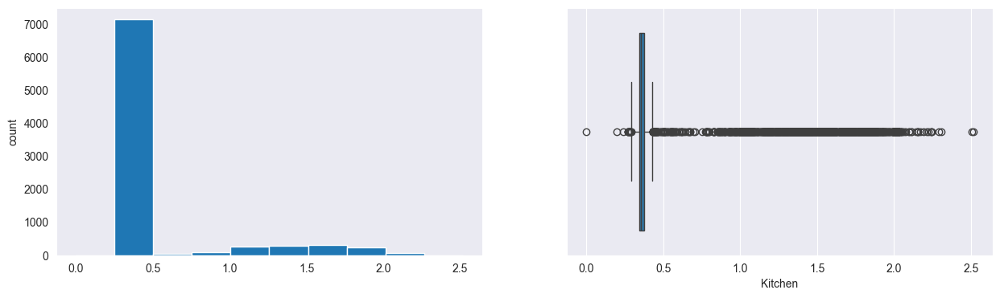

temperature
Skew : -0.09


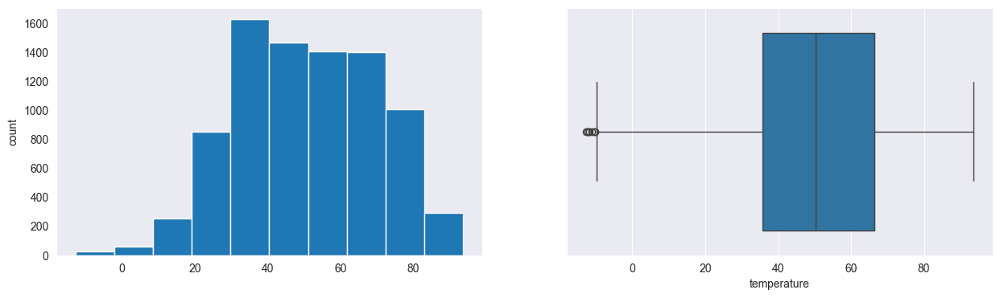

humidity
Skew : -0.36


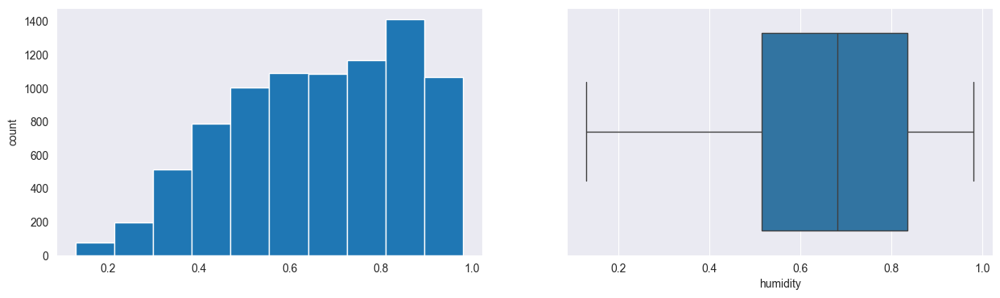

pressure
Skew : -0.18


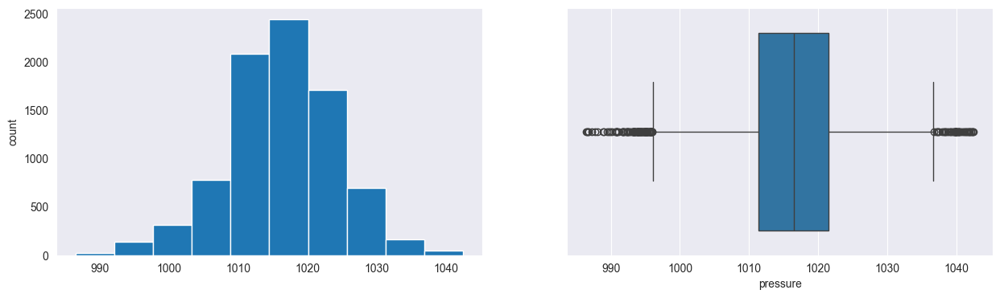

windSpeed
Skew : 0.21


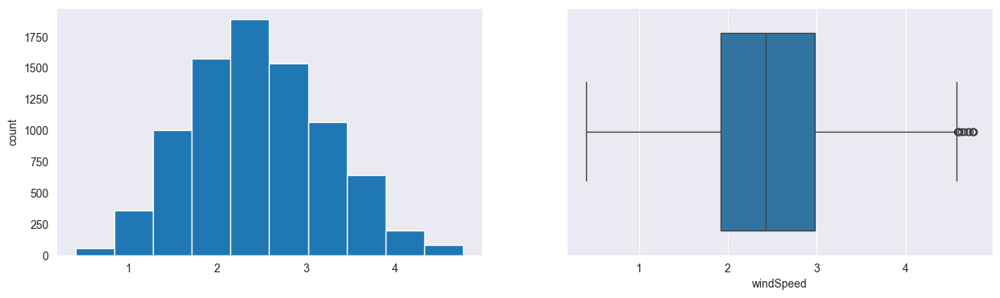

dewPoint
Skew : 1.34


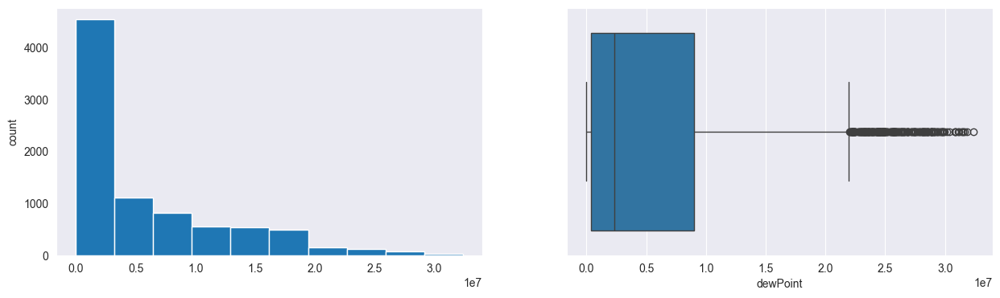

In [138]:
for col in numerical:
  print(col)
  print('Skew :', round(df1[col].skew(), 2))
  plt.figure(figsize = (15, 4))
  plt.subplot(1, 2, 1)
  df1[col].hist(grid=False)
  plt.ylabel('count')
  plt.subplot(1, 2, 2)
  sns.boxplot(x=df1[col])
  plt.show()

**Taking count of outliers and its Percentage after Data Transformations**


In [139]:
def find_outliers_IQR(df1):
    q1=df1.quantile(0.25)
    q3=df1.quantile(0.75)
    IQR=q3-q1
    outliers = df1[((df1<(q1-1.5*IQR)) | (df1>(q3+1.5*IQR)))]
    
    return outliers

for feature in numerical:
    outliers = find_outliers_IQR(df1[feature])

    print(feature)
    print('number of outliers: '+ str(len(outliers)))
    print('max outlier value: '+ str(outliers.max()))
    print('min outlier value: '+ str(outliers.min()))
    print('% of outliers: '+ str(len(outliers)/(len(df1[feature]))*100))
    print('\n')

House overall
number of outliers: 273
max outlier value: 8.314606624247233
min outlier value: 0.363424118566428
% of outliers: 3.2503869508274796


Dishwasher
number of outliers: 668
max outlier value: 3.671101062888269
min outlier value: 0.431961659263047
% of outliers: 7.953327777116323


Home office
number of outliers: 802
max outlier value: 6.324099408848662
min outlier value: 0.07069653456853454
% of outliers: 9.548755804262413


Fridge
number of outliers: 802
max outlier value: 5.503212081491044
min outlier value: 1.0588253966534649
% of outliers: 9.548755804262413


Garage door
number of outliers: 1461
max outlier value: 2.60443277332148
min outlier value: 0.14422495703074084
% of outliers: 17.394927967615192


Well
number of outliers: 2067
max outlier value: 3.172312120733244
min outlier value: 0.0
% of outliers: 24.610072627693775


Microwave
number of outliers: 2785
max outlier value: 3.4452318083431517
min outlier value: 0.0
% of outliers: 33.158709370163116


Living room
nu

In [140]:
def detect_outliers(df1):
    outliers = {}
    for column in df1:
        # Calculate the IQR for the column
        Q1 = df1[column].quantile(0.25)
        Q3 = df1[column].quantile(0.75)
        IQR = Q3 - Q1

        # Identify the outliers using the IQR method
        outliers[column] = df1[(df1[column] < (Q1 - 1.5 * IQR)) | (df1[column] > (Q3 + 1.5 * IQR))].index

        # Print the number of outliers in the column
        print(f"{column}: {len(outliers[column])} outliers")

    # Check for duplicate outliers
    duplicate_outliers = []
    for column in outliers:
        for i in range(len(outliers[column])):
            index = outliers[column][i]
            for j in range(i+1, len(outliers[column])):
                if index == outliers[column][j]:
                    duplicate_outliers.append(index)
    if len(duplicate_outliers) > 0:
        print(f"Duplicate outliers found: {set(duplicate_outliers)}")
    else:
        print("No duplicate outliers found")

    return outliers

In [141]:
df1

,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint
time,,,,,,,,,,,,,,,,
2016-01-01 05:00:00,3.971628,0.156284,3.809048,0.760709,0.921603,0.396921,1.091141,0.448610,1.714512,23.591283,0.365099,36.131000,0.619667,1016.888000,3.024952,353486.069148
2016-01-01 06:00:00,3.805026,0.181209,1.611712,0.604308,0.916632,0.394187,0.632443,0.459602,1.695133,27.402450,0.353346,35.838667,0.610000,1016.232000,2.878194,324428.161272
2016-01-01 07:00:00,3.500249,0.136627,1.613991,0.654353,0.927511,0.393291,0.633911,0.460599,1.690752,22.330200,0.349569,35.385000,0.613000,1015.989000,2.815493,303373.987474
2016-01-01 08:00:00,3.861975,0.202471,1.975053,0.650991,0.918749,0.393614,0.635332,0.461148,1.690888,36.982217,0.362285,35.282000,0.640000,1016.042000,2.384254,343125.407794
2016-01-01 09:00:00,3.373443,0.153504,1.613536,0.780111,0.925680,0.393255,0.634519,0.462607,1.692253,20.630550,0.361309,35.451667,0.641667,1015.815000,2.641023,355811.308856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,4.037561,0.165096,1.584671,0.722257,0.916109,0.390506,0.569870,0.422900,1.591122,46.348000,0.349932,36.990000,0.712000,1012.775333,3.344149,651883.911460
2016-12-16 00:00:00,4.246850,0.152799,1.581987,0.691103,0.909199,1.344664,0.564674,0.420086,1.594807,47.760350,0.334221,37.584167,0.721667,1012.628500,3.459697,745002.777474
2016-12-16 01:00:00,4.228637,0.181714,1.585959,0.697381,0.914405,0.391378,0.571099,0.424602,1.590624,49.405067,0.355294,36.429333,0.801000,1012.129667,3.274243,907460.233836


In [142]:
df1_out=df1.copy()
df1_out.reset_index(inplace=True)
df1_out.index

RangeIndex(start=0, stop=8399, step=1)

In [143]:
df1_out.columns

Index(['time', 'House overall', 'Dishwasher', 'Home office', 'Fridge',
       'Garage door', 'Well', 'Microwave', 'Living room', 'Solar', 'Furnace',
       'Kitchen', 'temperature', 'humidity', 'pressure', 'windSpeed',
       'dewPoint'],
      dtype='object')

In [144]:
df1_out['year'] = df1_out['time'].apply(lambda x:x.year)
df1_out['month'] = df1_out['time'].apply(lambda x:x.month)
df1_out['day'] = df1_out['time'].apply(lambda x:x.day)
##df1_out['weekday'] = df1_out['time'].apply(lambda x:x.weekday)
##df1_out['weekofyear'] = df1_out['time'].apply(lambda x:x.weekofyear)
df1_out['hour'] = df1_out['time'].apply(lambda x:x.hour)
df1_out['minute'] = df1_out['time'].apply(lambda x:x.minute)
df1_out

,time,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint,year,month,day,hour,minute
0,2016-01-01 05:00:00,3.971628,0.156284,3.809048,0.760709,0.921603,0.396921,1.091141,0.448610,1.714512,23.591283,0.365099,36.131000,0.619667,1016.888000,3.024952,353486.069148,2016,1,1,5,0
1,2016-01-01 06:00:00,3.805026,0.181209,1.611712,0.604308,0.916632,0.394187,0.632443,0.459602,1.695133,27.402450,0.353346,35.838667,0.610000,1016.232000,2.878194,324428.161272,2016,1,1,6,0
2,2016-01-01 07:00:00,3.500249,0.136627,1.613991,0.654353,0.927511,0.393291,0.633911,0.460599,1.690752,22.330200,0.349569,35.385000,0.613000,1015.989000,2.815493,303373.987474,2016,1,1,7,0
3,2016-01-01 08:00:00,3.861975,0.202471,1.975053,0.650991,0.918749,0.393614,0.635332,0.461148,1.690888,36.982217,0.362285,35.282000,0.640000,1016.042000,2.384254,343125.407794,2016,1,1,8,0
4,2016-01-01 09:00:00,3.373443,0.153504,1.613536,0.780111,0.925680,0.393255,0.634519,0.462607,1.692253,20.630550,0.361309,35.451667,0.641667,1015.815000,2.641023,355811.308856,2016,1,1,9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,2016-12-15 23:00:00,4.037561,0.165096,1.584671,0.722257,0.916109,0.390506,0.569870,0.422900,1.591122,46.348000,0.349932,36.990000,0.712000,1012.775333,3.344149,651883.911460,2016,12,15,23,0
8395,2016-12-16 00:00:00,4.246850,0.152799,1.581987,0.691103,0.909199,1.344664,0.564674,0.420086,1.594807,47.760350,0.334221,37.584167,0.721667,1012.628500,3.459697,745002.777474,2016,12,16,0,0
8396,2016-12-16 01:00:00,4.228637,0.181714,1.585959,0.697381,0.914405,0.391378,0.571099,0.424602,1.590624,49.405067,0.355294,36.429333,0.801000,1012.129667,3.274243,907460.233836,2016,12,16,1,0
8397,2016-12-16 02:00:00,4.041678,0.172320,1.585555,0.693070,0.919506,0.390615,0.571474,0.423923,1.587683,42.402033,0.351108,35.580833,0.836667,1011.711667,2.713239,937703.019014,2016,12,16,2,0


**Splitting the dataframe based on seasons**

In [145]:
def Season(month):
    if month in [12,1,2]:
        season = 'Winter'
    elif month in [3,4,5]:
        season = 'Spring'
    elif month in [6,7,8]:
        season = 'Summer'
    elif month in [9,10,11]:
        season = 'Autumn'            
    else:
        season='X'
            
    return season

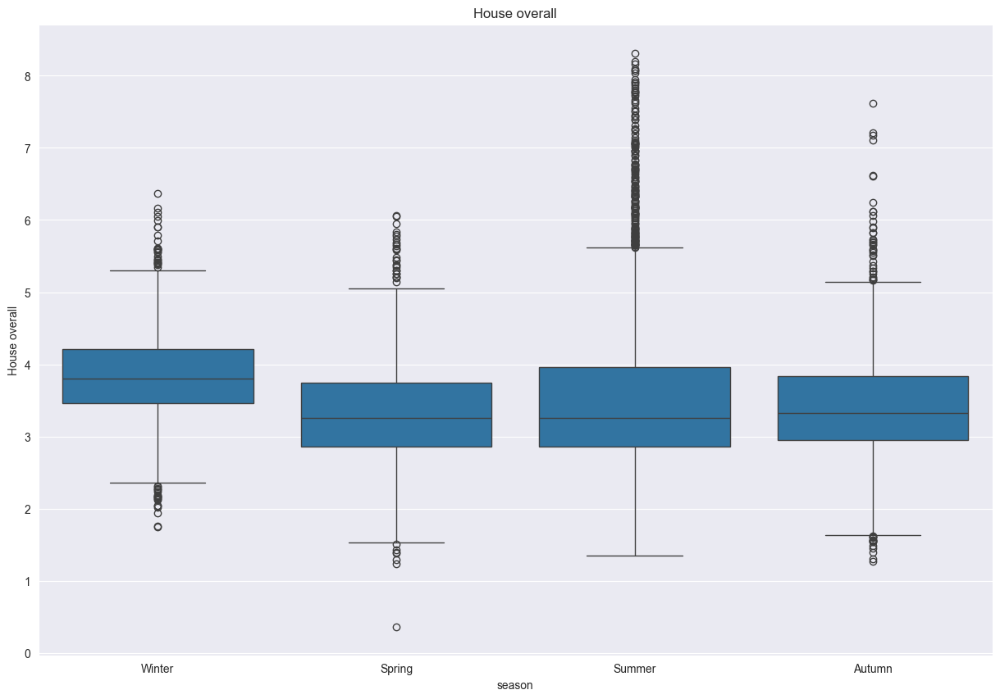

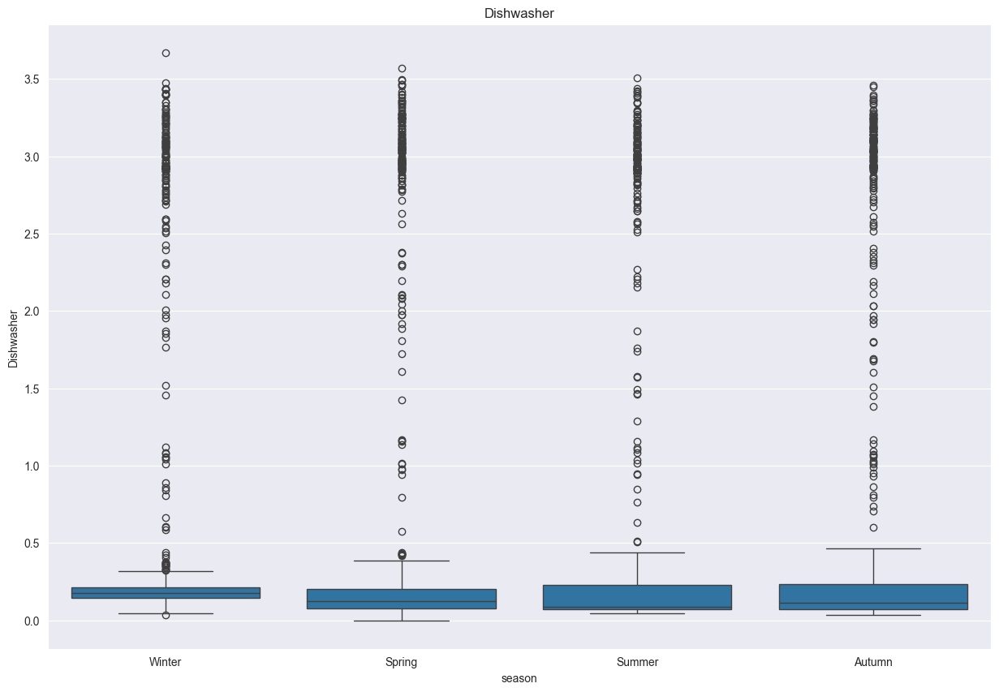

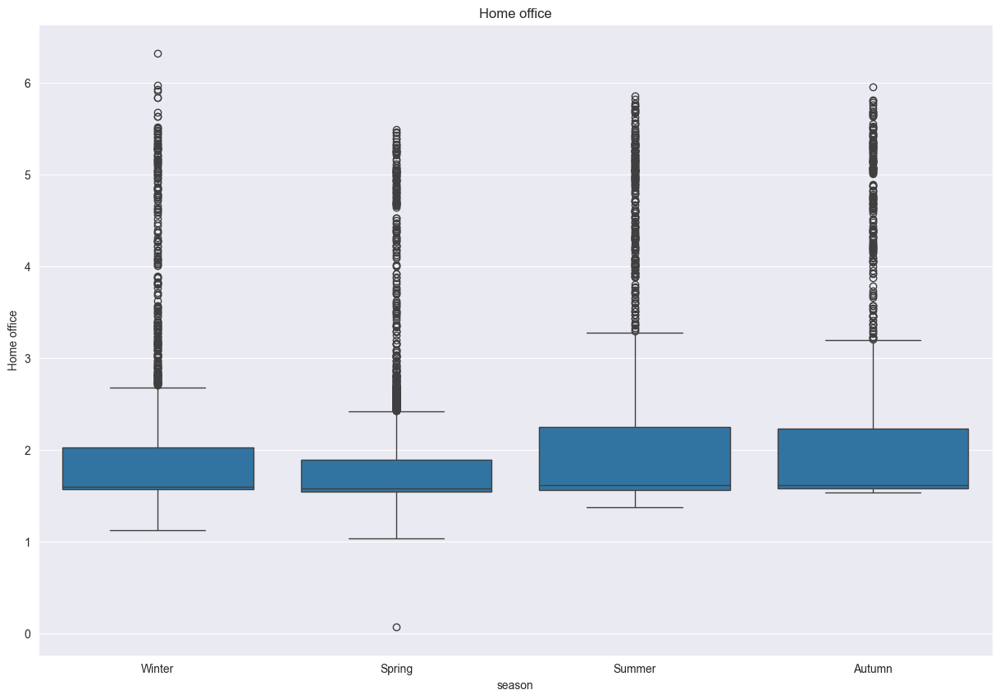

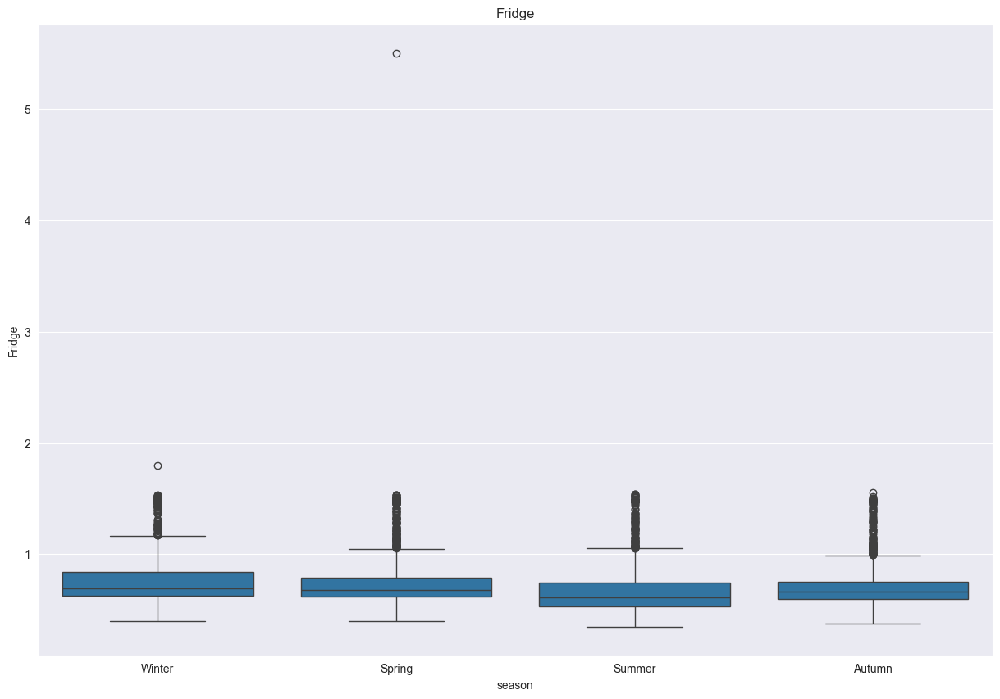

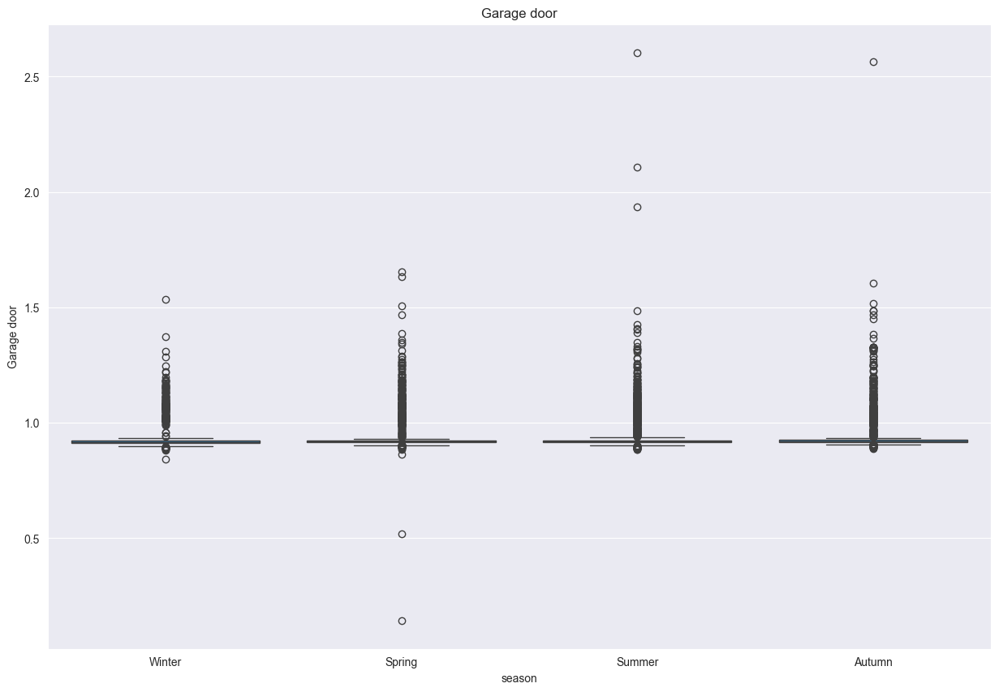

...

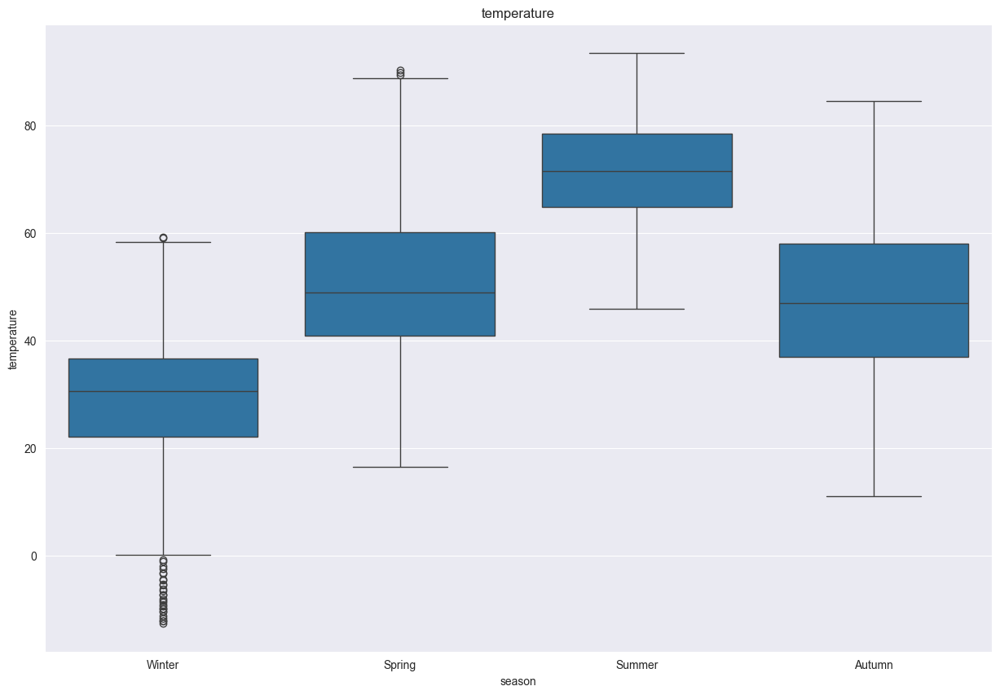

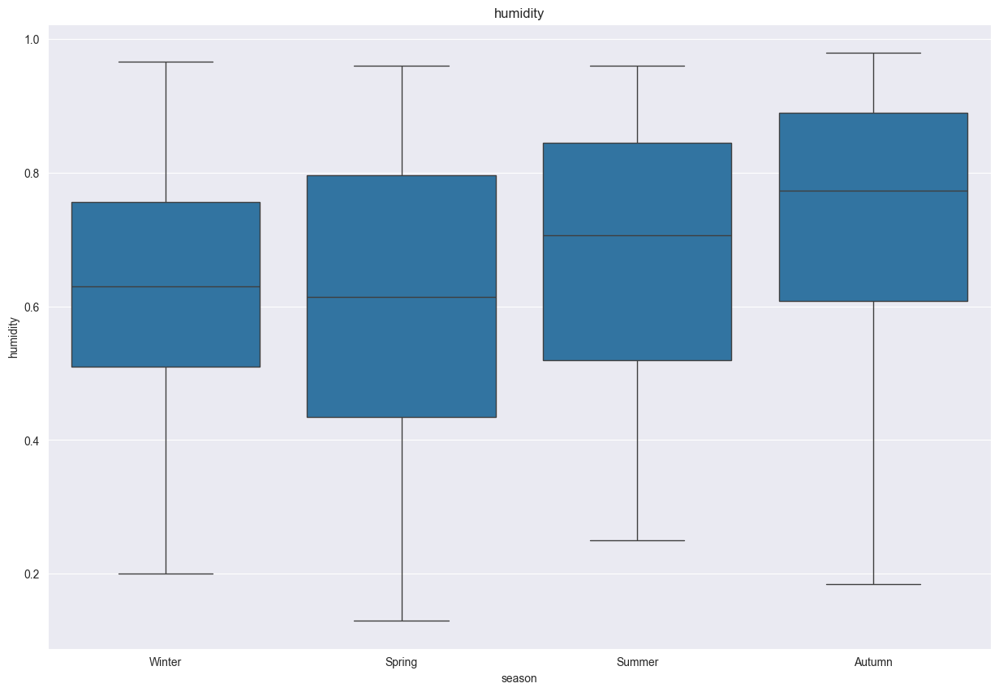

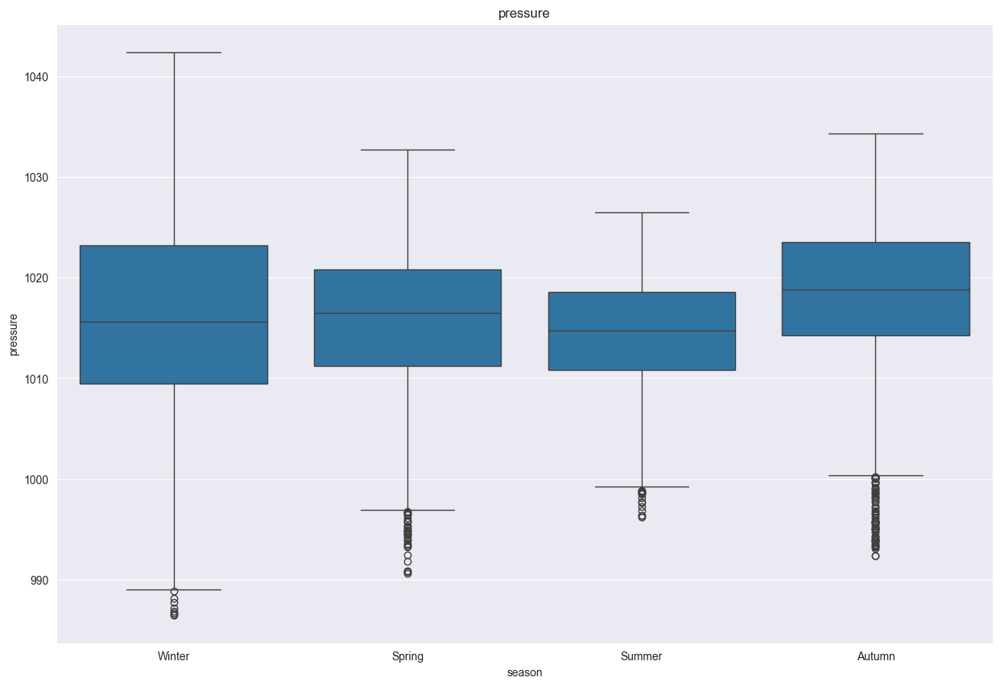

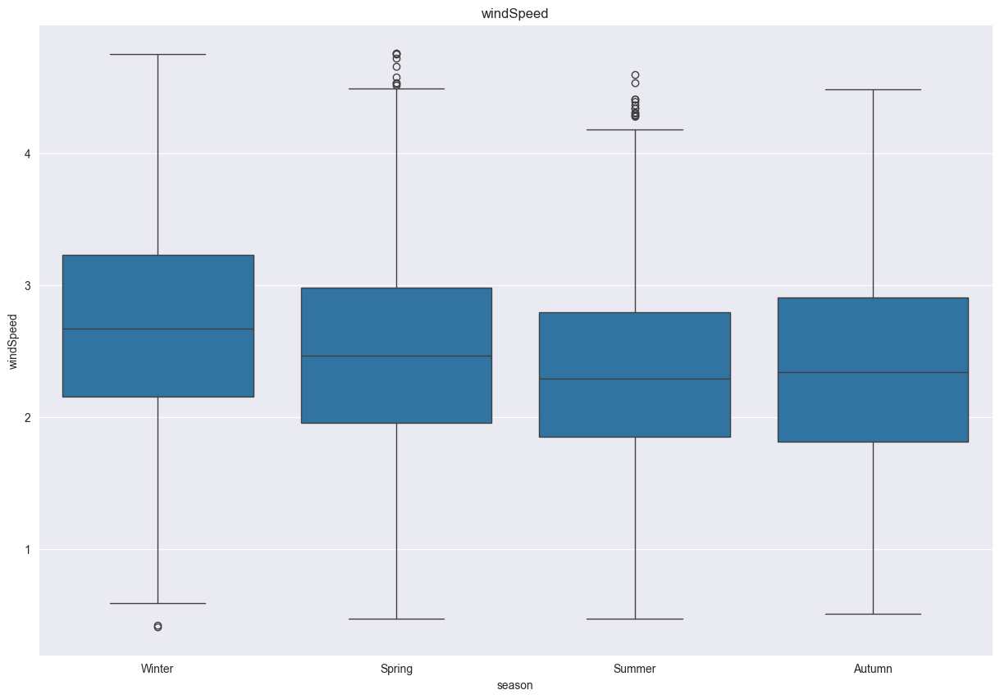

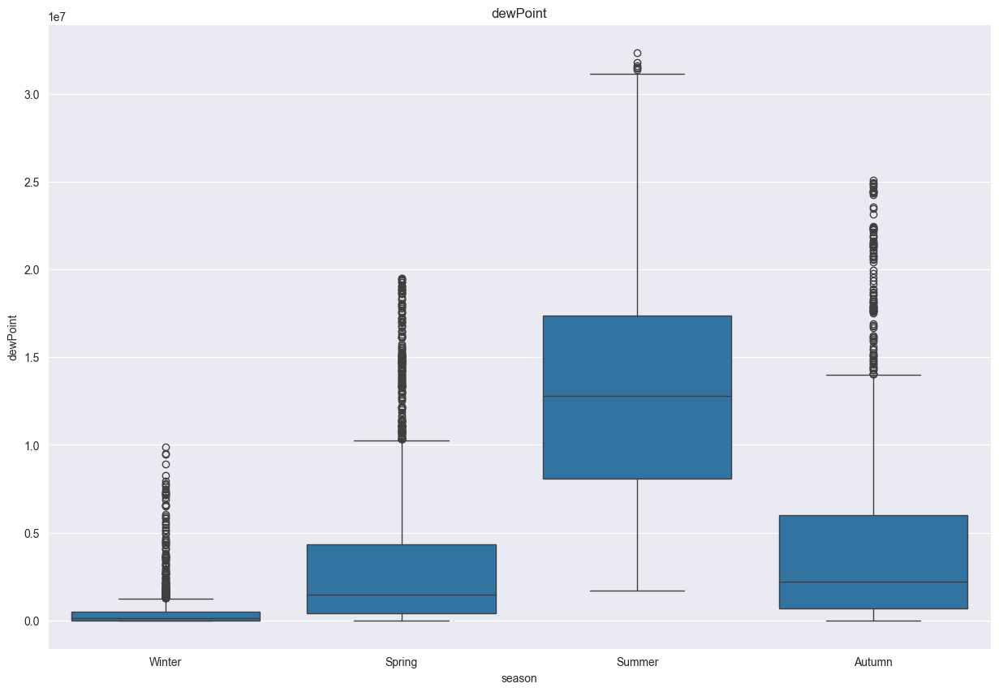

In [146]:
df1_out['season']= df1_out['month'].apply(Season)
for feature in numerical:
    plt.figure(figsize=(15,10))
    sns.boxplot(x='season', y=feature, data=df1_out)
    plt.title(feature)
    plt.show()

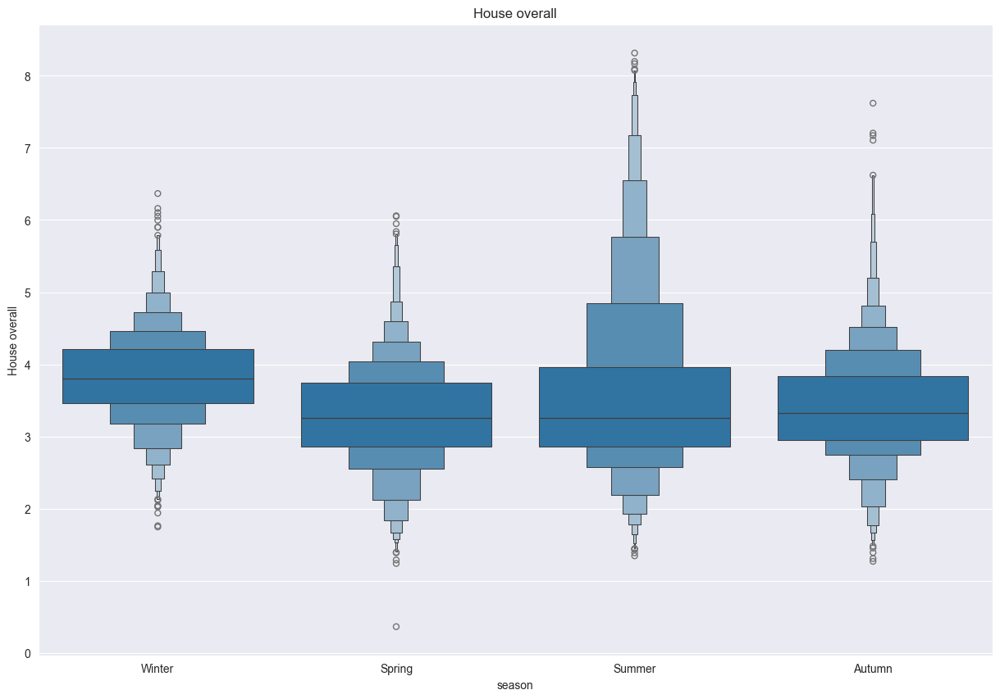

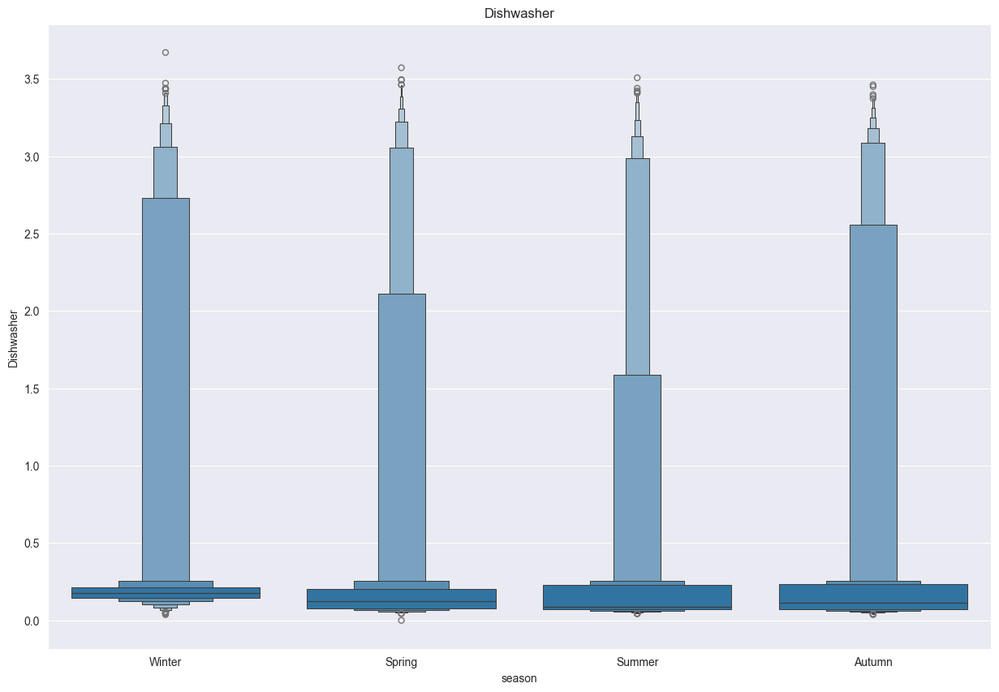

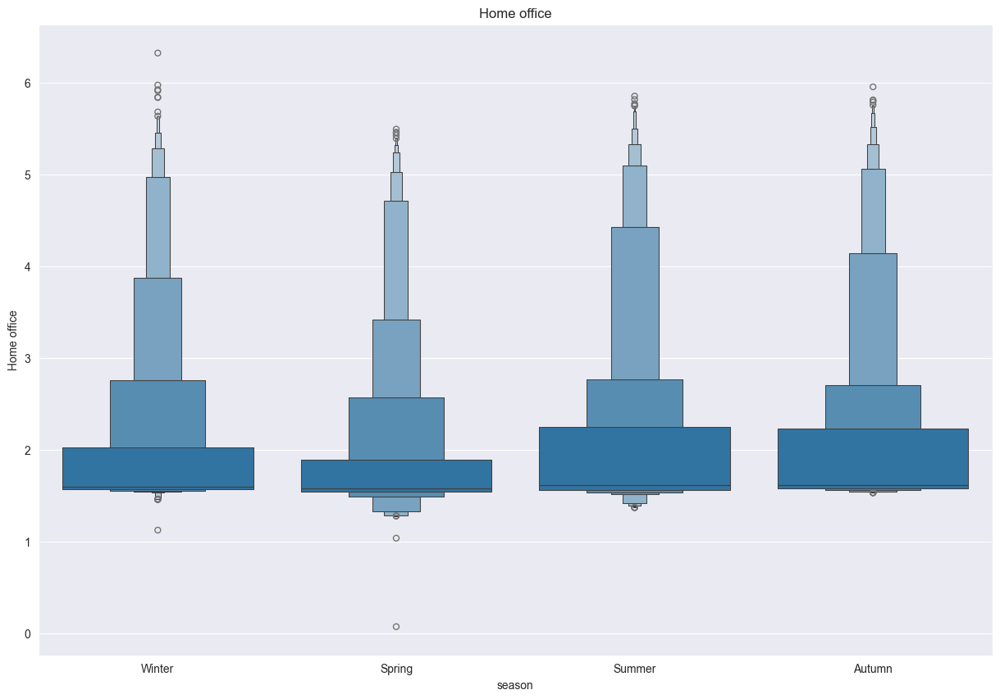

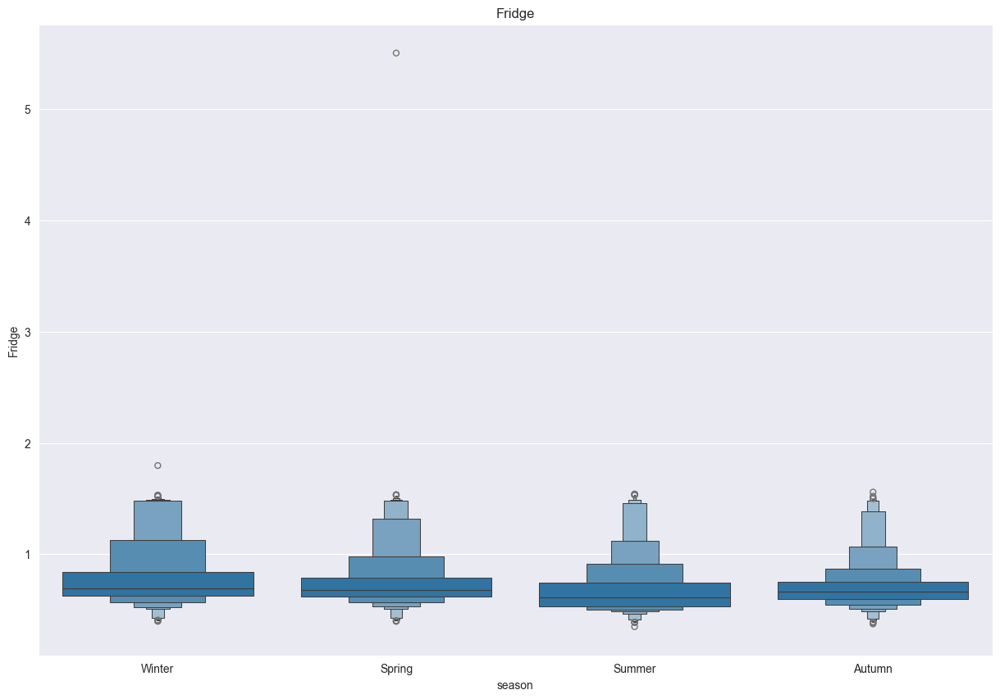

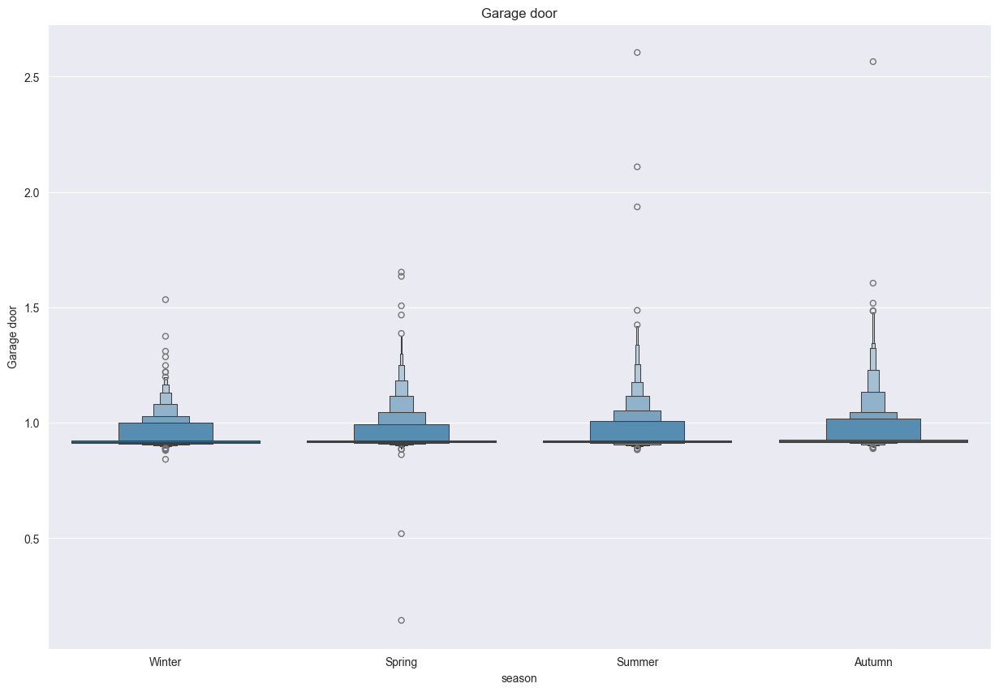

...

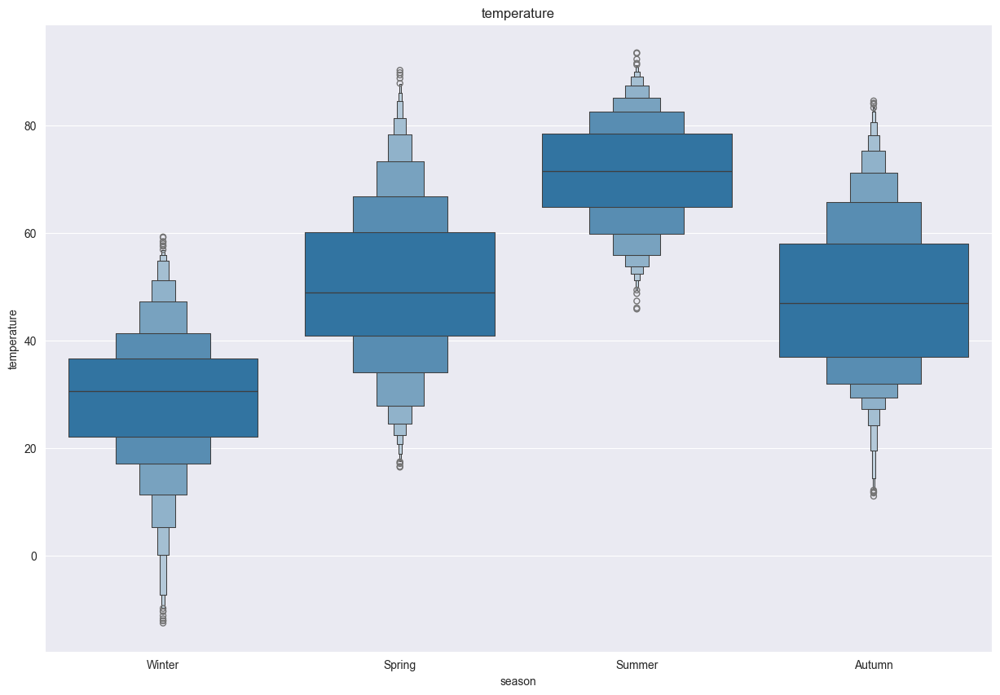

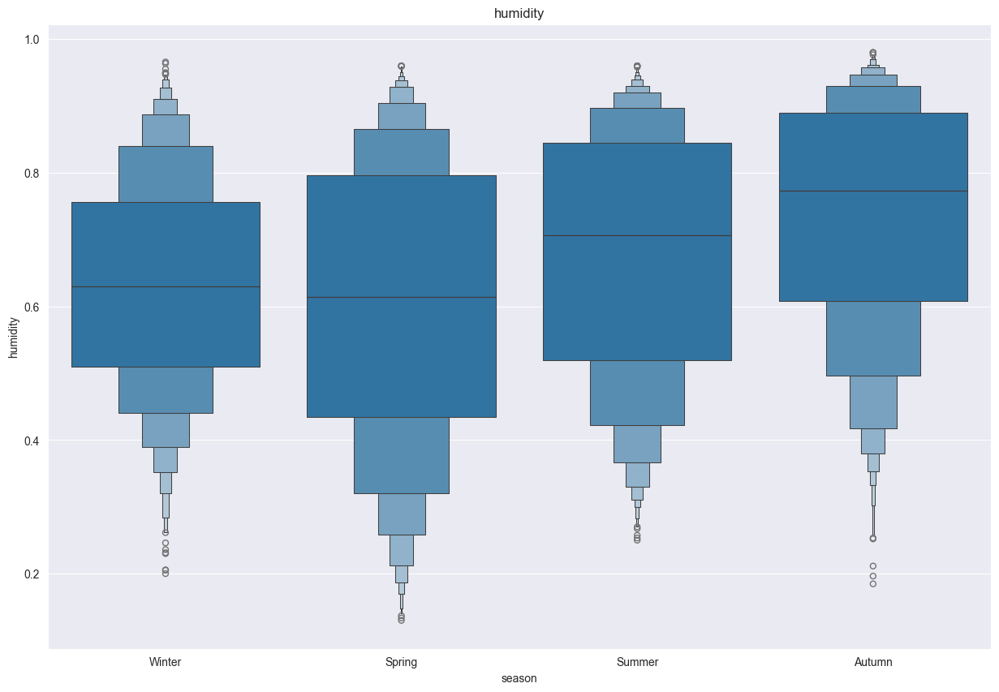

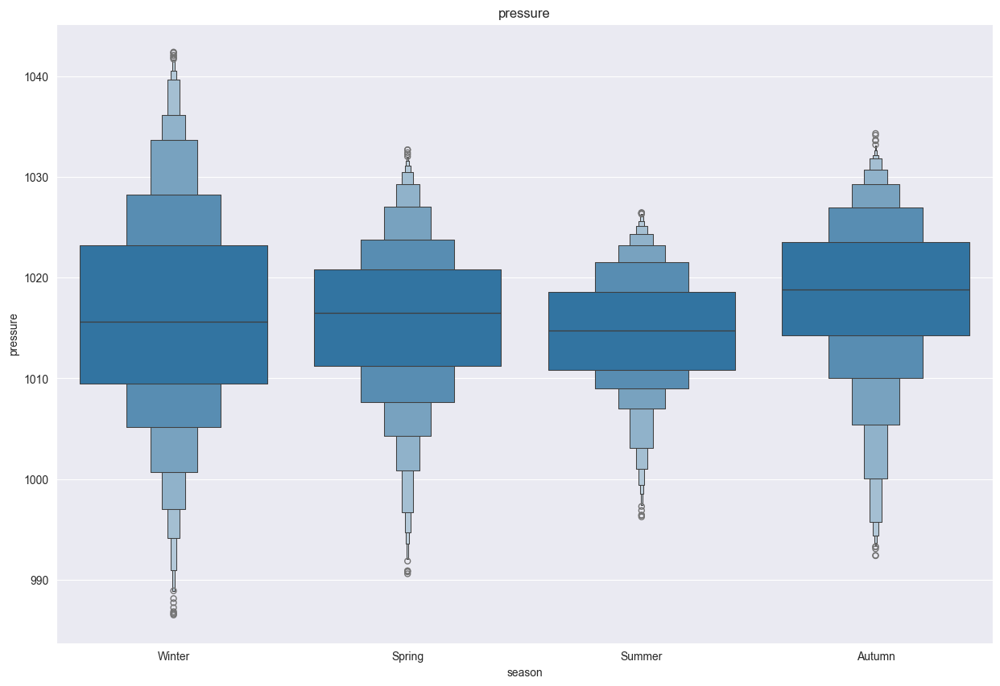

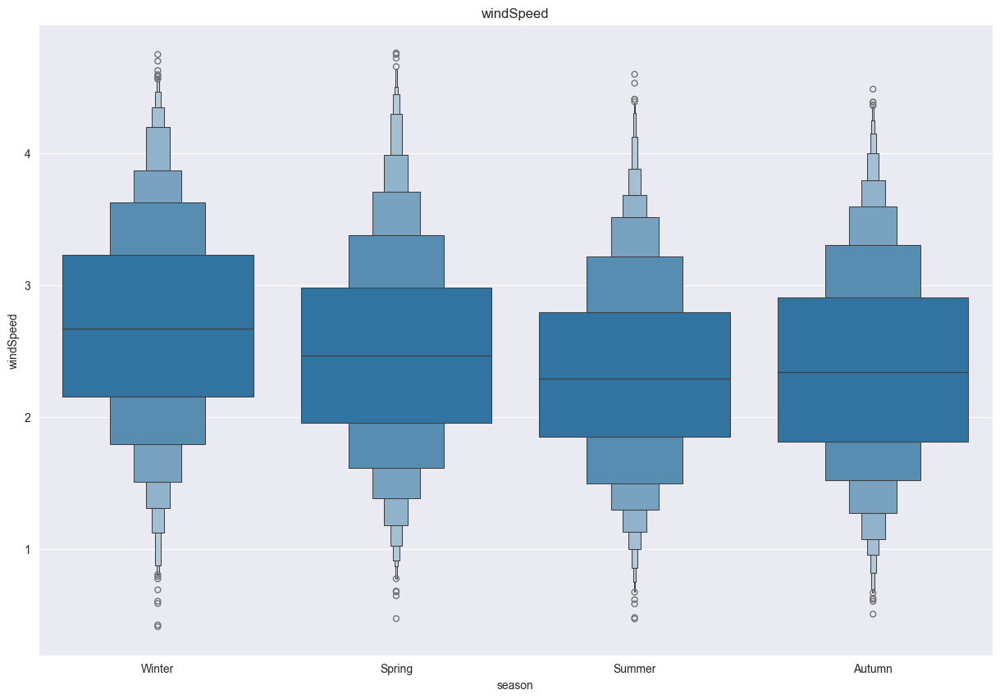

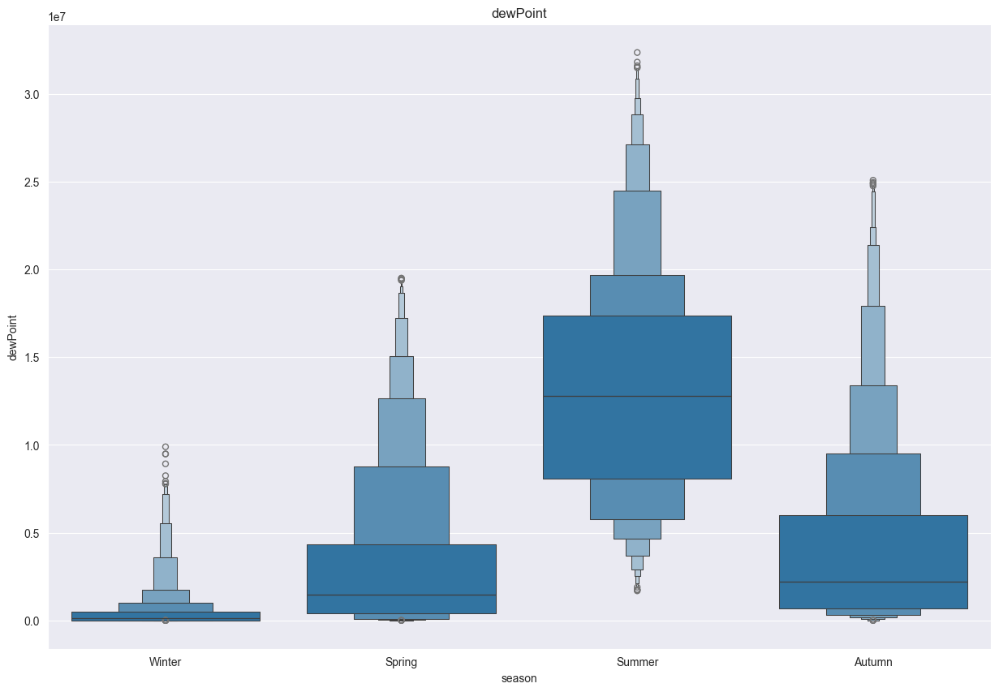

In [147]:
for feature in numerical:
    plt.figure(figsize=(15,10))
    sns.boxenplot(x='season', y=feature, data=df1_out)
    plt.title(feature)
    plt.show()

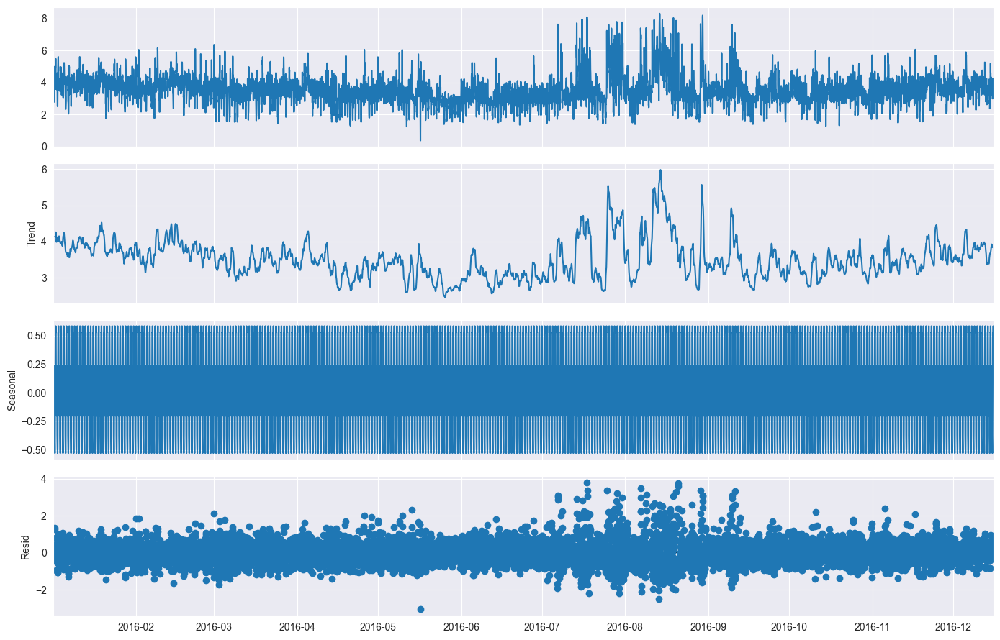

In [148]:
datause1=df1.iloc[:,0].values
#fig,ax=plt.subplots(figsize=(15,10))
plt.rcParams['figure.figsize'] = (14, 9)
seasonal_decompose(df1[['House overall']]).plot()
result = adfuller(datause1)
plt.show()

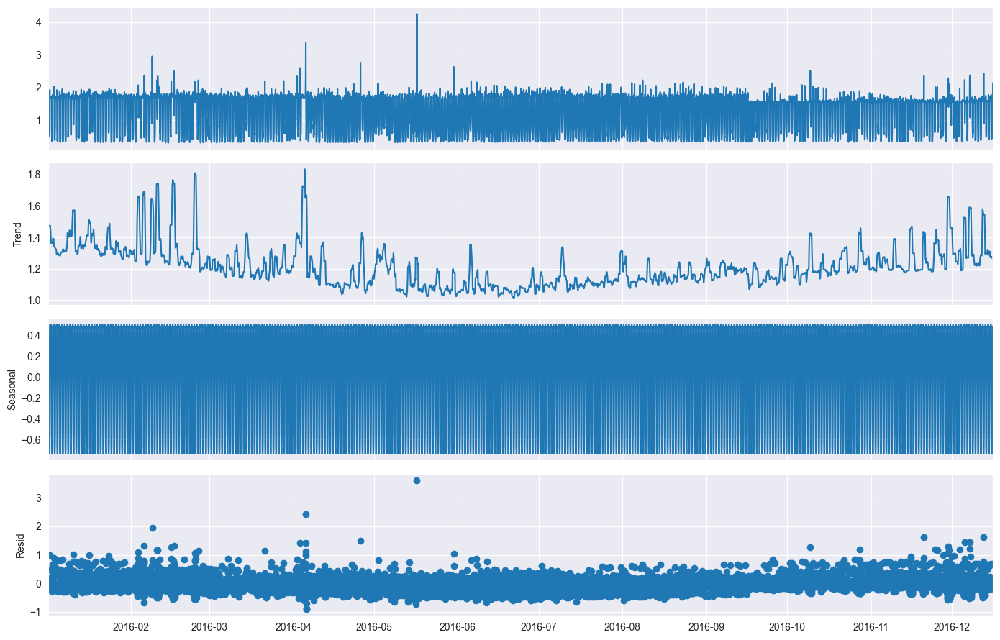

In [149]:
datause=df1.iloc[:,0].values
#fig,ax=plt.subplots(figsize=(15,10))
plt.rcParams['figure.figsize'] = (14, 9)
seasonal_decompose(df1[['Solar']]).plot()
result = adfuller(datause)
plt.show()

In [150]:
df1_prescale=df1.drop(['House overall','Solar'],axis=1)

In [151]:
df1_prescale

,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint
time,,,,,,,,,,,,,,
2016-01-01 05:00:00,0.156284,3.809048,0.760709,0.921603,0.396921,1.091141,0.448610,23.591283,0.365099,36.131000,0.619667,1016.888000,3.024952,353486.069148
2016-01-01 06:00:00,0.181209,1.611712,0.604308,0.916632,0.394187,0.632443,0.459602,27.402450,0.353346,35.838667,0.610000,1016.232000,2.878194,324428.161272
2016-01-01 07:00:00,0.136627,1.613991,0.654353,0.927511,0.393291,0.633911,0.460599,22.330200,0.349569,35.385000,0.613000,1015.989000,2.815493,303373.987474
2016-01-01 08:00:00,0.202471,1.975053,0.650991,0.918749,0.393614,0.635332,0.461148,36.982217,0.362285,35.282000,0.640000,1016.042000,2.384254,343125.407794
2016-01-01 09:00:00,0.153504,1.613536,0.780111,0.925680,0.393255,0.634519,0.462607,20.630550,0.361309,35.451667,0.641667,1015.815000,2.641023,355811.308856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,0.165096,1.584671,0.722257,0.916109,0.390506,0.569870,0.422900,46.348000,0.349932,36.990000,0.712000,1012.775333,3.344149,651883.911460
2016-12-16 00:00:00,0.152799,1.581987,0.691103,0.909199,1.344664,0.564674,0.420086,47.760350,0.334221,37.584167,0.721667,1012.628500,3.459697,745002.777474
2016-12-16 01:00:00,0.181714,1.585959,0.697381,0.914405,0.391378,0.571099,0.424602,49.405067,0.355294,36.429333,0.801000,1012.129667,3.274243,907460.233836


In [152]:
df1_prescale.index

DatetimeIndex(['2016-01-01 05:00:00', '2016-01-01 06:00:00',
               '2016-01-01 07:00:00', '2016-01-01 08:00:00',
               '2016-01-01 09:00:00', '2016-01-01 10:00:00',
               '2016-01-01 11:00:00', '2016-01-01 12:00:00',
               '2016-01-01 13:00:00', '2016-01-01 14:00:00',
               ...
               '2016-12-15 18:00:00', '2016-12-15 19:00:00',
               '2016-12-15 20:00:00', '2016-12-15 21:00:00',
               '2016-12-15 22:00:00', '2016-12-15 23:00:00',
               '2016-12-16 00:00:00', '2016-12-16 01:00:00',
               '2016-12-16 02:00:00', '2016-12-16 03:00:00'],
              dtype='datetime64[ns]', name='time', length=8399, freq='h')

In [153]:
from sklearn.preprocessing import StandardScaler
stdsclr=StandardScaler()
X2=stdsclr.fit_transform(df1_prescale)

In [154]:
(X2)

array([[-0.25592859,  2.00946285,  0.1195124 , ...,  0.07434536,
         0.73946686, -0.77647003],
       [-0.22172268, -0.46028183, -0.52185349, ..., -0.00878706,
         0.54562297, -0.78083398],
       [-0.28290519, -0.45772078, -0.31662861, ..., -0.03958154,
         0.46280488, -0.78399592],
       ...,
       [-0.22102943, -0.48922761, -0.14017998, ..., -0.52866039,
         1.06874084, -0.6932735 ],
       [-0.23392138, -0.48968242, -0.15786006, ..., -0.58163196,
         0.32774398, -0.6887316 ],
       [-0.29328276, -1.00931188,  4.36904792, ..., -0.60972295,
         0.16799766, -0.685966  ]])

In [155]:
X2=pd.DataFrame(X2,columns=[df1_prescale.columns])


In [156]:
X2

,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint
0,-0.255929,2.009463,0.119512,-0.259923,-0.507553,1.279017,-0.489505,0.773133,-0.367025,-0.765123,-0.229723,0.074345,0.739467,-0.776470
1,-0.221723,-0.460282,-0.521853,-0.329057,-0.513089,-0.220347,-0.473269,1.085506,-0.395100,-0.780433,-0.279704,-0.008787,0.545623,-0.780834
2,-0.282905,-0.457721,-0.316629,-0.177772,-0.514903,-0.215545,-0.471796,0.669771,-0.404122,-0.804191,-0.264193,-0.039582,0.462805,-0.783996
3,-0.192544,-0.051897,-0.330415,-0.299611,-0.514249,-0.210901,-0.470985,1.870688,-0.373747,-0.809585,-0.124591,-0.032865,-0.106793,-0.778026
4,-0.259744,-0.458232,0.199077,-0.203236,-0.514976,-0.213559,-0.468831,0.530464,-0.376078,-0.800700,-0.115973,-0.061632,0.232357,-0.776121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8394,-0.243836,-0.490675,-0.038172,-0.336325,-0.520543,-0.424879,-0.527481,2.638331,-0.403255,-0.720138,0.247682,-0.446837,1.161076,-0.731656
8395,-0.260711,-0.493692,-0.165925,-0.432411,1.411526,-0.441865,-0.531639,2.754091,-0.440783,-0.689021,0.297663,-0.465445,1.313696,-0.717672
8396,-0.221029,-0.489228,-0.140180,-0.360026,-0.518776,-0.420861,-0.524968,2.888896,-0.390446,-0.749500,0.707852,-0.528660,1.068741,-0.693273
8397,-0.233921,-0.489682,-0.157860,-0.289095,-0.520322,-0.419637,-0.525971,2.314910,-0.400446,-0.793935,0.892265,-0.581632,0.327744,-0.688732


In [157]:
X2.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Dishwasher,8399.0,4.081877e-17,1.00006,-0.470405,-0.367836,-0.280086,-0.171895,4.567617
Home office,8399.0,2.470276e-16,1.00006,-2.192341,-0.517292,-0.476851,0.122101,4.836310
Fridge,8399.0,3.259157e-16,1.00006,-1.567488,-0.584663,-0.267564,0.185785,19.567520
Garage door,8399.0,6.609257e-17,1.00006,-11.069797,-0.346090,-0.285350,-0.221247,23.140741
Well,8399.0,-1.021527e-16,1.00006,-1.311275,-0.520986,-0.516945,-0.493140,5.112318
Microwave,8399.0,1.302817e-16,1.00006,-2.287634,-0.275827,-0.256337,-0.238276,8.973915
Living room,8399.0,-7.190872e-17,1.00006,-1.152149,-0.488284,-0.471178,-0.430560,2.954075
Furnace,8399.0,-2.030364e-17,1.00006,-1.158993,-0.732913,-0.545632,0.539960,4.630489
Kitchen,8399.0,1.404335e-16,1.00006,-1.239135,-0.421754,-0.392130,-0.337941,4.770299
temperature,8399.0,2.030364e-17,1.00006,-3.316581,-0.783296,-0.020948,0.814870,2.239473


In [158]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
House overall,8399.0,3.503241e+00,8.655019e-01,3.634241e-01,2.953943,3.435802e+00,3.936664e+00,8.314607e+00
Dishwasher,8399.0,3.427740e-01,7.287225e-01,0.000000e+00,0.074740,1.386809e-01,2.175178e-01,3.671101e+00
Home office,8399.0,2.021226e+00,8.897547e-01,7.069653e-02,1.560991,1.596971e+00,2.129859e+00,6.324099e+00
Fridge,8399.0,7.315651e-01,2.438700e-01,3.493245e-01,0.588992,6.663181e-01,7.768698e-01,5.503212e+00
Garage door,8399.0,9.402955e-01,7.191802e-02,1.442250e-01,0.915407,9.197749e-01,9.243848e-01,2.604433e+00
Well,8399.0,6.475774e-01,4.938826e-01,0.000000e+00,0.390287,3.922826e-01,4.040388e-01,3.172312e+00
Microwave,8399.0,6.998530e-01,3.059470e-01,0.000000e+00,0.615470,6.214321e-01,6.269574e-01,3.445232e+00
Living room,8399.0,7.800047e-01,6.770400e-01,0.000000e+00,0.449437,4.610175e-01,4.885160e-01,2.779912e+00
Solar,8399.0,1.213574e+00,5.772694e-01,3.126832e-01,0.567039,1.569943e+00,1.704361e+00,4.252902e+00
Furnace,8399.0,1.415853e+01,1.220142e+01,1.800198e-02,5.216475,7.501433e+00,2.074642e+01,7.065372e+01


In [159]:
df1

,House overall,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Solar,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint
time,,,,,,,,,,,,,,,,
2016-01-01 05:00:00,3.971628,0.156284,3.809048,0.760709,0.921603,0.396921,1.091141,0.448610,1.714512,23.591283,0.365099,36.131000,0.619667,1016.888000,3.024952,353486.069148
2016-01-01 06:00:00,3.805026,0.181209,1.611712,0.604308,0.916632,0.394187,0.632443,0.459602,1.695133,27.402450,0.353346,35.838667,0.610000,1016.232000,2.878194,324428.161272
2016-01-01 07:00:00,3.500249,0.136627,1.613991,0.654353,0.927511,0.393291,0.633911,0.460599,1.690752,22.330200,0.349569,35.385000,0.613000,1015.989000,2.815493,303373.987474
2016-01-01 08:00:00,3.861975,0.202471,1.975053,0.650991,0.918749,0.393614,0.635332,0.461148,1.690888,36.982217,0.362285,35.282000,0.640000,1016.042000,2.384254,343125.407794
2016-01-01 09:00:00,3.373443,0.153504,1.613536,0.780111,0.925680,0.393255,0.634519,0.462607,1.692253,20.630550,0.361309,35.451667,0.641667,1015.815000,2.641023,355811.308856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,4.037561,0.165096,1.584671,0.722257,0.916109,0.390506,0.569870,0.422900,1.591122,46.348000,0.349932,36.990000,0.712000,1012.775333,3.344149,651883.911460
2016-12-16 00:00:00,4.246850,0.152799,1.581987,0.691103,0.909199,1.344664,0.564674,0.420086,1.594807,47.760350,0.334221,37.584167,0.721667,1012.628500,3.459697,745002.777474
2016-12-16 01:00:00,4.228637,0.181714,1.585959,0.697381,0.914405,0.391378,0.571099,0.424602,1.590624,49.405067,0.355294,36.429333,0.801000,1012.129667,3.274243,907460.233836


In [160]:
df1.info


<bound method DataFrame.info of                      House overall  Dishwasher  Home office    Fridge  \
time                                                                    
2016-01-01 05:00:00       3.971628    0.156284     3.809048  0.760709   
2016-01-01 06:00:00       3.805026    0.181209     1.611712  0.604308   
2016-01-01 07:00:00       3.500249    0.136627     1.613991  0.654353   
2016-01-01 08:00:00       3.861975    0.202471     1.975053  0.650991   
2016-01-01 09:00:00       3.373443    0.153504     1.613536  0.780111   
...                            ...         ...          ...       ...   
2016-12-15 23:00:00       4.037561    0.165096     1.584671  0.722257   
2016-12-16 00:00:00       4.246850    0.152799     1.581987  0.691103   
2016-12-16 01:00:00       4.228637    0.181714     1.585959  0.697381   
2016-12-16 02:00:00       4.041678    0.172320     1.585555  0.693070   
2016-12-16 03:00:00       3.807842    0.129065     1.123239  1.796981   

                  

In [161]:
X2.columns=['Dishwasher', 'Home office', 'Fridge', 'Garage door',
        'Well', 'Microwave', 'Living room', 'Furnace',
       'Kitchen', 'temperature', 'humidity', 'pressure', 'windSpeed',
       'dewPoint']

In [162]:
x = X2
y = df1['House overall']

In [163]:
x.set_index(df1.index,inplace=True)

In [164]:
x.index

DatetimeIndex(['2016-01-01 05:00:00', '2016-01-01 06:00:00',
               '2016-01-01 07:00:00', '2016-01-01 08:00:00',
               '2016-01-01 09:00:00', '2016-01-01 10:00:00',
               '2016-01-01 11:00:00', '2016-01-01 12:00:00',
               '2016-01-01 13:00:00', '2016-01-01 14:00:00',
               ...
               '2016-12-15 18:00:00', '2016-12-15 19:00:00',
               '2016-12-15 20:00:00', '2016-12-15 21:00:00',
               '2016-12-15 22:00:00', '2016-12-15 23:00:00',
               '2016-12-16 00:00:00', '2016-12-16 01:00:00',
               '2016-12-16 02:00:00', '2016-12-16 03:00:00'],
              dtype='datetime64[ns]', name='time', length=8399, freq='h')

In [165]:
df1['House overall']

time
2016-01-01 05:00:00    3.971628
2016-01-01 06:00:00    3.805026
2016-01-01 07:00:00    3.500249
2016-01-01 08:00:00    3.861975
2016-01-01 09:00:00    3.373443
                         ...   
2016-12-15 23:00:00    4.037561
2016-12-16 00:00:00    4.246850
2016-12-16 01:00:00    4.228637
2016-12-16 02:00:00    4.041678
2016-12-16 03:00:00    3.807842
Freq: h, Name: House overall, Length: 8399, dtype: float64

In [166]:
X2.columns

Index(['Dishwasher', 'Home office', 'Fridge', 'Garage door', 'Well',
       'Microwave', 'Living room', 'Furnace', 'Kitchen', 'temperature',
       'humidity', 'pressure', 'windSpeed', 'dewPoint'],
      dtype='object')

In [167]:
dataframe = pd.concat([x, y], axis=1)
dataframe

,Dishwasher,Home office,Fridge,Garage door,Well,Microwave,Living room,Furnace,Kitchen,temperature,humidity,pressure,windSpeed,dewPoint,House overall
time,,,,,,,,,,,,,,,
2016-01-01 05:00:00,-0.255929,2.009463,0.119512,-0.259923,-0.507553,1.279017,-0.489505,0.773133,-0.367025,-0.765123,-0.229723,0.074345,0.739467,-0.776470,3.971628
2016-01-01 06:00:00,-0.221723,-0.460282,-0.521853,-0.329057,-0.513089,-0.220347,-0.473269,1.085506,-0.395100,-0.780433,-0.279704,-0.008787,0.545623,-0.780834,3.805026
2016-01-01 07:00:00,-0.282905,-0.457721,-0.316629,-0.177772,-0.514903,-0.215545,-0.471796,0.669771,-0.404122,-0.804191,-0.264193,-0.039582,0.462805,-0.783996,3.500249
2016-01-01 08:00:00,-0.192544,-0.051897,-0.330415,-0.299611,-0.514249,-0.210901,-0.470985,1.870688,-0.373747,-0.809585,-0.124591,-0.032865,-0.106793,-0.778026,3.861975
2016-01-01 09:00:00,-0.259744,-0.458232,0.199077,-0.203236,-0.514976,-0.213559,-0.468831,0.530464,-0.376078,-0.800700,-0.115973,-0.061632,0.232357,-0.776121,3.373443
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-12-15 23:00:00,-0.243836,-0.490675,-0.038172,-0.336325,-0.520543,-0.424879,-0.527481,2.638331,-0.403255,-0.720138,0.247682,-0.446837,1.161076,-0.731656,4.037561
2016-12-16 00:00:00,-0.260711,-0.493692,-0.165925,-0.432411,1.411526,-0.441865,-0.531639,2.754091,-0.440783,-0.689021,0.297663,-0.465445,1.313696,-0.717672,4.246850
2016-12-16 01:00:00,-0.221029,-0.489228,-0.140180,-0.360026,-0.518776,-0.420861,-0.524968,2.888896,-0.390446,-0.749500,0.707852,-0.528660,1.068741,-0.693273,4.228637


In [168]:
new_csv_file = 'SmartHome.csv'
dataframe.to_csv(new_csv_file, index=False)

### Random forset

In [169]:
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=52)
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor

rf_reg = RandomForestRegressor(random_state=52)
rf_model = rf_reg.fit(x_train, y_train)
y_pred_rf = rf_model.predict(x_test)

print('MSE is ', mean_squared_error(y_test, y_pred_rf))
print('R Squared value :', r2_score(y_test, y_pred_rf))

MSE is  0.13354960711884906
R Squared value : 0.8292799071110332


In [170]:
from sklearn.model_selection import cross_val_score, KFold
kfold_validator = KFold(5) 
cv_rf = cross_val_score(rf_model, x, y, cv = kfold_validator)
print("Validation result : ", cv_rf) 
print("\nAverage of Cross validation result ", np.mean(cv_rf))

Validation result :  [0.68223499 0.60834863 0.8058022  0.82430976 0.67077168]

Average of Cross validation result  0.7182934504517979


progress:% 91 	 predicted=3.728302, expected=3.722019
 Test MSE: 0.023

 Test MAE:  0.1008454940606093

 Test RMSE:  0.15223614939310814

 Test MPAE:  0.027914916237388065


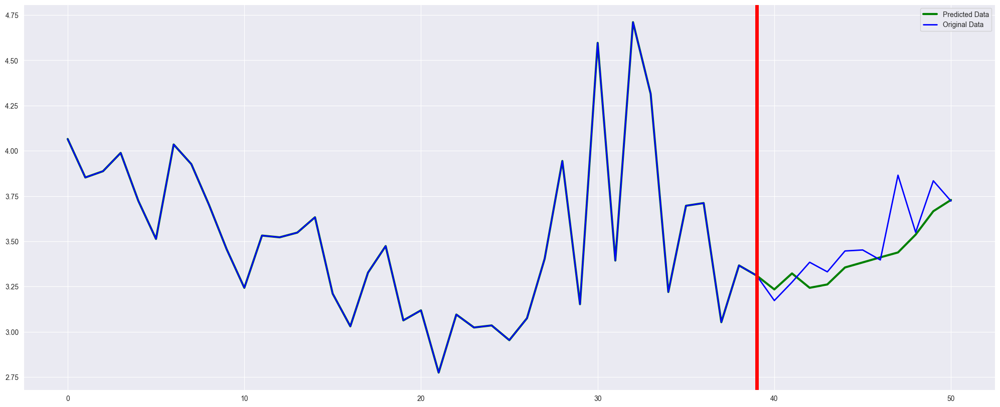

In [171]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error


def forecast_ts(df1, tt_ratio):
    X = df1.values
    size = int(len(X) * tt_ratio)
    train, test = X[:size], X[size:]
    history = list(train)
    predictions = []

    for t in range(len(test)):
        model = ARIMA(history, order=(5,1,0))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        print('progress:%', round(100 * (t / len(test))), '\t predicted=%f, expected=%f' % (yhat, obs), end="\r")

    error = mean_squared_error(test, predictions)
    print('\n Test MSE: %.3f' % error)
    print('\n Test MAE: ', mean_absolute_error(test, predictions))
    print('\n Test RMSE: ', np.sqrt(error))
    print('\n Test MPAE: ', mean_absolute_percentage_error(test, predictions))
    

    plt.rcParams["figure.figsize"] = (25, 10)
    preds = np.append(train, predictions)
    plt.plot(preds, color='green', linewidth=3, label="Predicted Data")
    plt.plot(df1.values, color='blue', linewidth=2, label="Original Data")
    plt.axvline(x=int(len(df1) * tt_ratio) - 1, linewidth=5, color='red')
    plt.legend()
    plt.show()

# Sample usage
col = 'House overall'
data = df1[col].resample('W').mean()

tt_ratio = 0.80 # Train to Test ratio
forecast_ts(data, tt_ratio)


In [172]:
# splitting df1 as energy and weather data

energy_data2 = df1[['House overall', 'Dishwasher', 'Home office',
       'Fridge',  'Garage door',  'Well', 'Microwave',
       'Living room', 'Furnace', 'Kitchen']]

weather_data2 = df1[['temperature', 'humidity','pressure', 'windSpeed','dewPoint']]

energy_data2.index = pd.to_datetime(energy_data2.index)
weather_data2.index = pd.to_datetime(weather_data2.index)

In [173]:
#resampling 

energy_per_hour2 = energy_data2.resample('H').sum()

energy_per_day2 = energy_data2.resample('D').sum()
energy_per_month2 = energy_data2.resample('M').sum()
energy_per_week2 = energy_data2.resample('W').sum()


weather_per_hour2 = weather_data2.resample('H').mean()
weather_per_day2 = weather_data2.resample('D').mean()
weather_per_month2 = weather_data2.resample('M').mean()
weather_per_week2 = weather_data2.resample('W').mean()

Autocorrelation for 'Solar' =  0.8886657493323239


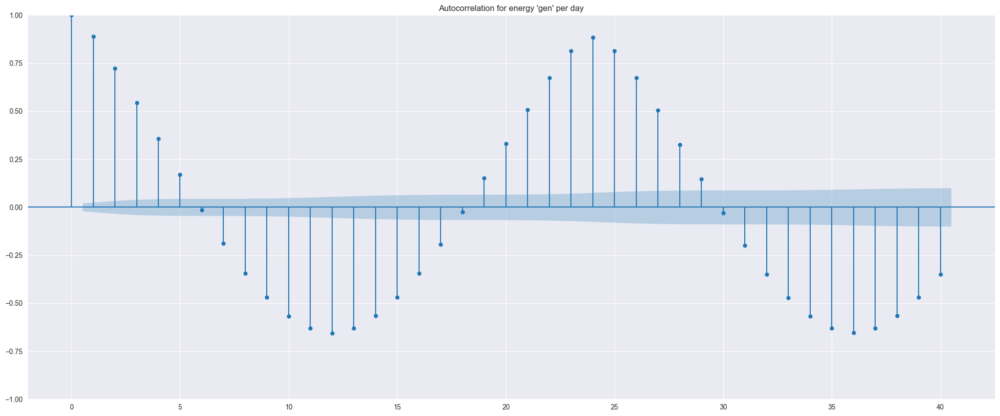

In [174]:
#Plot ACF for energy 'gen'

print("Autocorrelation for 'Solar' = ", df1['Solar'].autocorr())
fig = plot_acf(df1['Solar'], lags=40, title="Autocorrelation for energy 'gen' per day")
plt.show()

Autocorrelation for 'House overall' =  0.7934855648573531


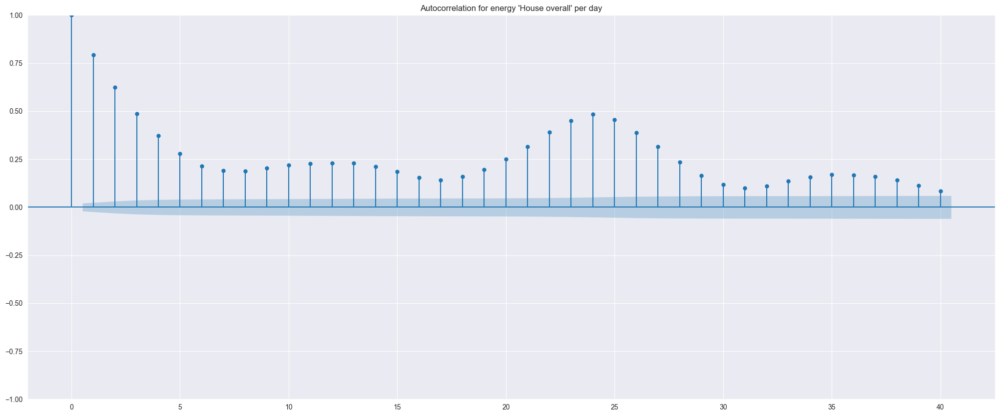

In [175]:
#Plot ACF for 'House overall'

print("Autocorrelation for 'House overall' = ", df1['House overall'].autocorr())
fig = plot_acf(df1['House overall'], lags=40, title="Autocorrelation for energy 'House overall' per day")
plt.show()

## **Anomaly detection**

In [176]:
data = energy_per_day2.filter(items=['House overall'])
df = data

isolation_forest = IsolationForest(n_estimators=100)
isolation_forest.fit(data.values.reshape(-1, 1))
xx = np.linspace(data.min(), data.max(), len(data)).reshape(-1,1)

df['scores']=isolation_forest.decision_function(df[['House overall']])
df['anomaly']=isolation_forest.predict(df[['House overall']])
df.head

<bound method NDFrame.head of             House overall    scores  anomaly
time                                        
2016-01-01      77.293424  0.077020        1
2016-01-02      98.352177 -0.014681       -1
2016-01-03      96.721961  0.005455        1
2016-01-04      93.453877  0.070965        1
2016-01-05      93.680153  0.063503        1
...                   ...       ...      ...
2016-12-12      95.482217  0.023862        1
2016-12-13      84.176291  0.079228        1
2016-12-14      82.223340  0.072260        1
2016-12-15      93.995064  0.055155        1
2016-12-16      16.325007 -0.324625       -1

[351 rows x 3 columns]>

In [177]:
anomaly=df.loc[df['anomaly']==-1]
anomaly_index=list(anomaly.index)
print(anomaly)

            House overall    scores  anomaly
time                                        
2016-01-02      98.352177 -0.014681       -1
2016-01-18     106.653876 -0.063544       -1
2016-01-19     102.823129 -0.044773       -1
2016-02-08     103.761491 -0.050010       -1
2016-02-12     101.002100 -0.008544       -1
...                   ...       ...      ...
2016-10-30      68.442249 -0.014264       -1
2016-11-21      99.149663 -0.011020       -1
2016-11-24     104.622622 -0.063827       -1
2016-12-05     101.347978 -0.018968       -1
2016-12-16      16.325007 -0.324625       -1

[65 rows x 3 columns]


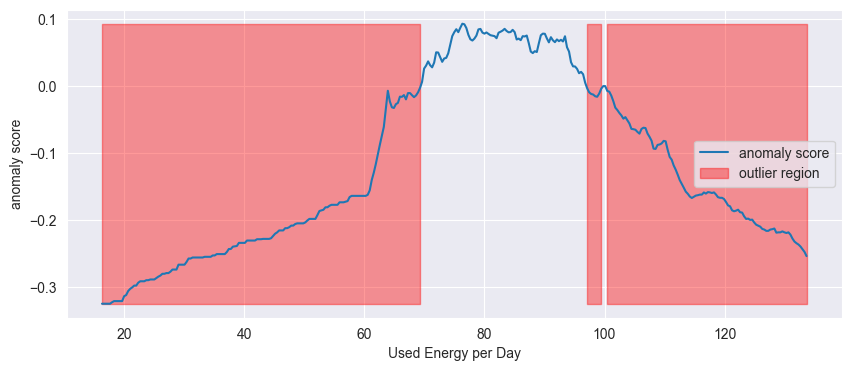

In [178]:
# Distribution of use energy per day
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)
plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score), 
                 where=outlier==-1, color='r', 
                 alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Used Energy per Day')
plt.show();

In [179]:
# Energy Per week anomaly detection
data = energy_per_week2.filter(items=['House overall'])
df = data

isolation_forest = IsolationForest(n_estimators=100)
isolation_forest.fit(data.values.reshape(-1, 1))
xx = np.linspace(data.min(), data.max(), len(data)).reshape(-1,1)

df['scores']=isolation_forest.decision_function(df[['House overall']])
df['anomaly']=isolation_forest.predict(df[['House overall']])
df

,House overall,scores,anomaly
time,,,
2016-01-03,272.367561,-0.293640,-1
2016-01-10,647.202555,0.042995,1
2016-01-17,653.017393,0.035585,1
2016-01-24,670.021358,0.000637,1
2016-01-31,625.498173,0.047059,1
2016-02-07,590.139269,0.095262,1
2016-02-14,677.838712,-0.033582,-1
2016-02-21,659.596873,0.030400,1
2016-02-28,621.808654,0.056782,1


In [180]:
anomaly=df.loc[df['anomaly']==-1]
anomaly_index=list(anomaly.index)
print(anomaly)

            House overall    scores  anomaly
time                                        
2016-01-03     272.367561 -0.293640       -1
2016-02-14     677.838712 -0.033582       -1
2016-05-29     466.033186 -0.103741       -1
2016-06-26     496.129819 -0.009660       -1
2016-07-31     772.169424 -0.168086       -1
2016-08-14     791.389815 -0.202011       -1
2016-08-21     724.843205 -0.142455       -1
2016-12-18     372.201920 -0.212489       -1


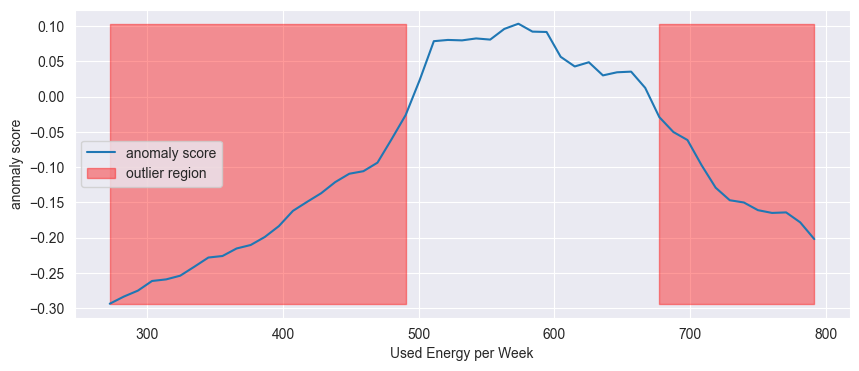

In [181]:
# Distribution of use energy per week
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)
plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score), 
                 where=outlier==-1, color='r', 
                 alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Used Energy per Week')
plt.show();

In [182]:
# Energy Per month anomaly detection
data = energy_per_month2.filter(items=['House overall'])
df = data

isolation_forest = IsolationForest(n_estimators=100)
isolation_forest.fit(data.values.reshape(-1, 1))
xx = np.linspace(data.min(), data.max(), len(data)).reshape(-1,1)

df['scores']=isolation_forest.decision_function(df[['House overall']])
df['anomaly']=isolation_forest.predict(df[['House overall']])
df.head(5)

,House overall,scores,anomaly
time,,,
2016-01-31,2868.107040,-0.007833,-1
2016-02-29,2642.830100,0.050441,1
2016-03-31,2557.625929,0.103039,1
2016-04-30,2385.348559,0.099148,1
2016-05-31,2304.792569,0.056572,1


In [183]:
anomaly=df.loc[df['anomaly']==-1]
anomaly_index=list(anomaly.index)
print(anomaly)

            House overall    scores  anomaly
time                                        
2016-01-31    2868.107040 -0.007833       -1
2016-06-30    2199.149466 -0.040754       -1
2016-08-31    2921.161730 -0.063223       -1
2016-12-31    1353.345368 -0.254898       -1


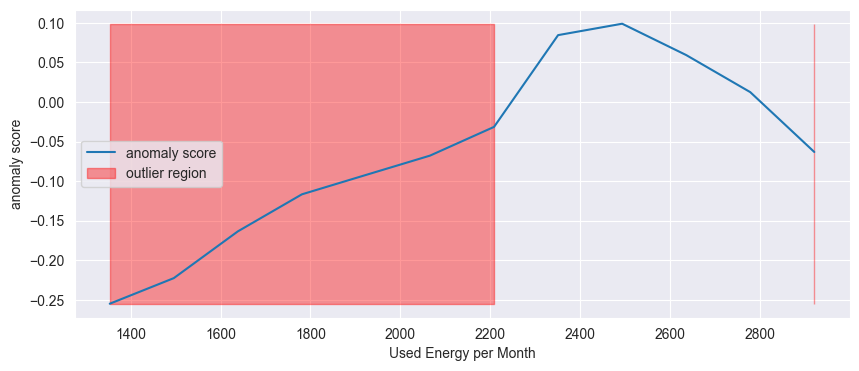

In [184]:
# Distribution of use energy per month
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)
plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score), 
                 where=outlier==-1, color='r', 
                 alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Used Energy per Month')
plt.show();

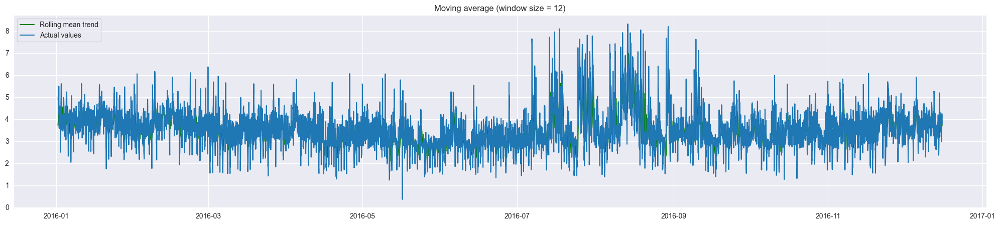

In [185]:
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

l1=[]
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(25,5))
    plt.title("Moving average (window size = {})".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

  # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
               
      
      # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, marker="o",markerfacecolor='red', markersize=12)
            
            #l1[:n_samples]=[upper_bond]
            #l2[:n_samples]=[lower_bond]
            print(anomalies.values)
            l1.append(anomalies.values)
            
            
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)

n_samples = 8399 # 1 month
data = energy_per_hour2.filter(items=['House overall'])
plotMovingAverage(data[:n_samples], window=12)

[[nan]
 [nan]
 [nan]
 ...
 [nan]
 [nan]
 [nan]]


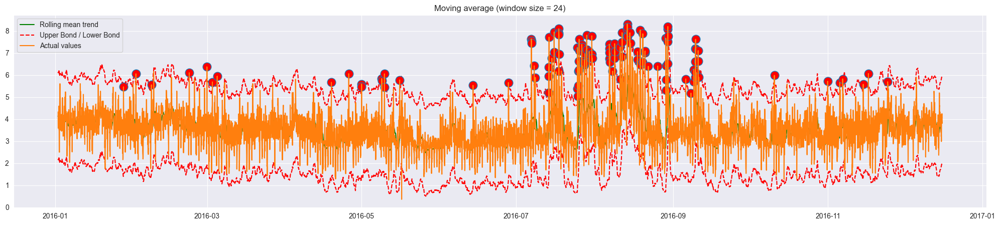

In [186]:
plotMovingAverage(data[:n_samples], window=24, plot_intervals=True ,plot_anomalies=True)

[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]

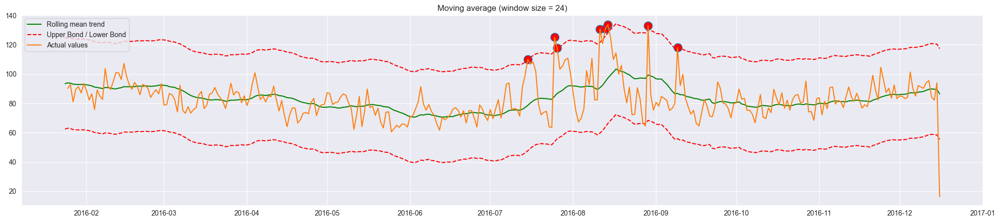

In [187]:
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

l1=[]
def plotMovingAverage(series, window, plot_intervals=False, scale=1.96, plot_anomalies=False):
    rolling_mean = series.rolling(window=window).mean()

    plt.figure(figsize=(25,5))
    plt.title("Moving average (window size = {})".format(window))
    plt.plot(rolling_mean, "g", label="Rolling mean trend")

  # Plot confidence intervals for smoothed values
    if plot_intervals:
        mae = mean_absolute_error(series[window:], rolling_mean[window:])
        deviation = np.std(series[window:] - rolling_mean[window:])
        lower_bond = rolling_mean - (mae + scale * deviation)
        upper_bond = rolling_mean + (mae + scale * deviation)
        plt.plot(upper_bond, "r--", label="Upper Bond / Lower Bond")
        plt.plot(lower_bond, "r--")
         
        
      
      # Having the intervals, find abnormal values
        if plot_anomalies:
            anomalies = pd.DataFrame(index=series.index, columns=series.columns)
            anomalies[series>upper_bond] = series[series>upper_bond]
            plt.plot(anomalies, marker="o",markerfacecolor='red', markersize=12)
            
            
            print(anomalies.values)
            l1.append(anomalies.values)
            
            
    plt.plot(series[window:], label="Actual values")
    plt.legend(loc="upper left")
    plt.grid(True)

n_samples = 24*30 # 1 month
data = energy_per_day2.filter(items=['House overall'])
plotMovingAverage(data[:n_samples], window=24, plot_intervals=True ,plot_anomalies=True)

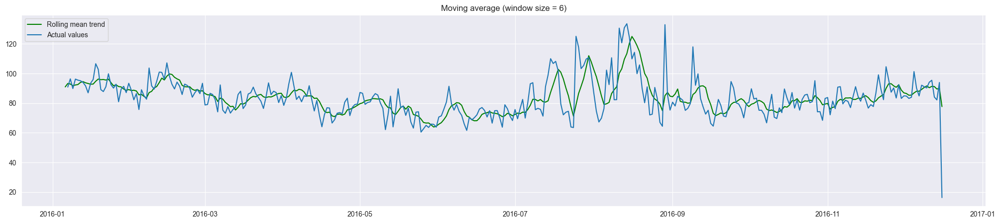

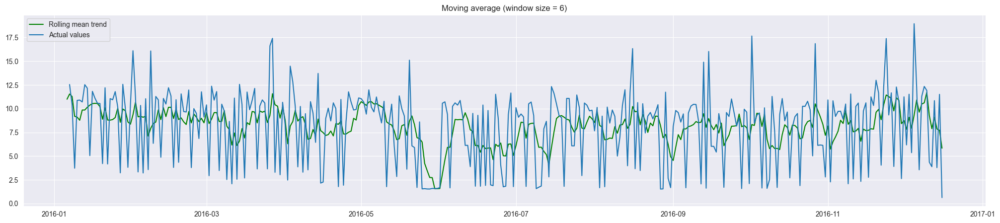

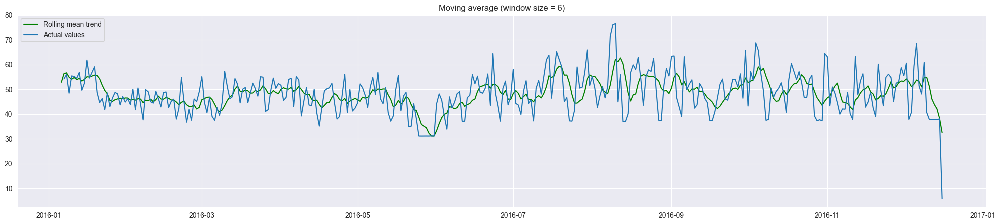

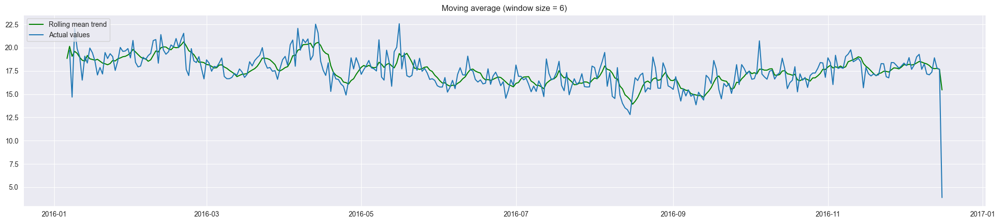

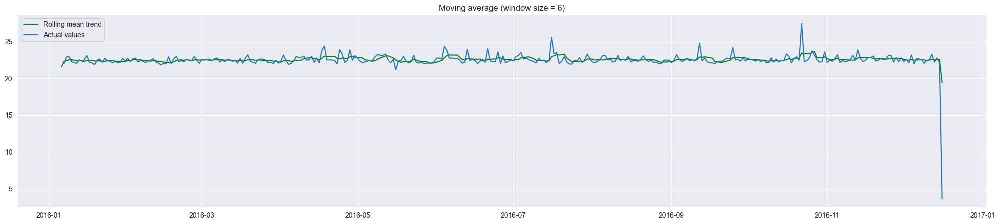

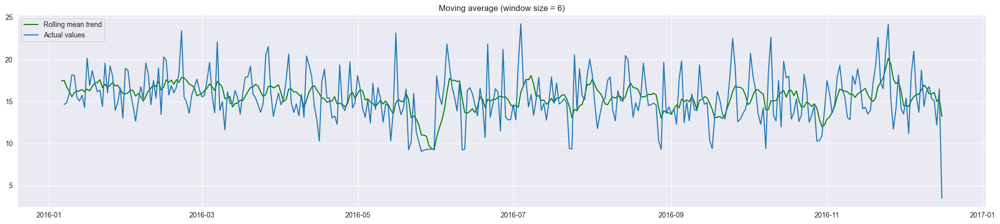

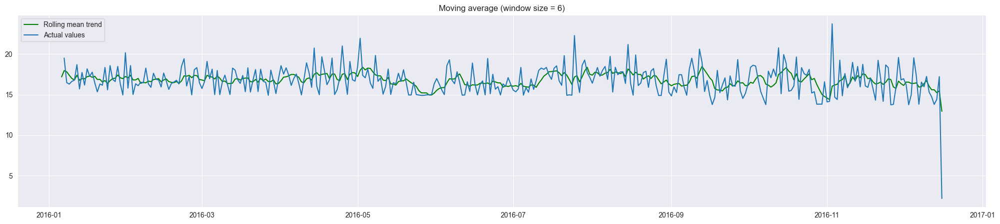

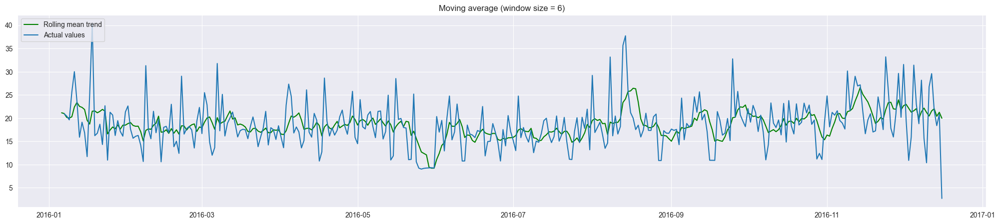

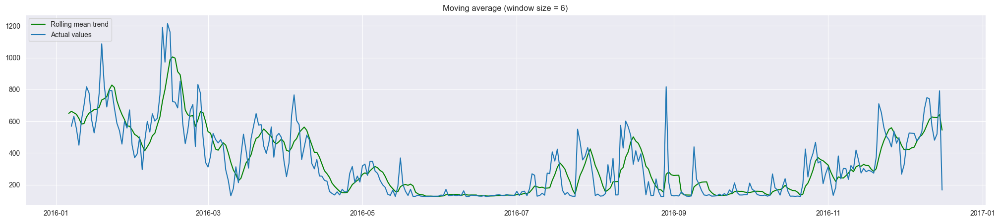

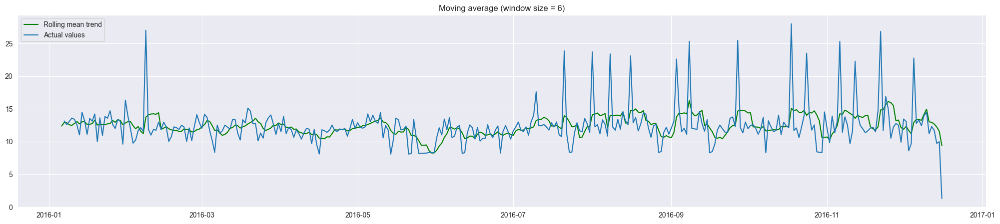

In [188]:
n_samples = 24*30 # 1 month
for i in energy_per_day2.columns:
  data = energy_per_day2[i]
  plotMovingAverage(data[:n_samples], window=6 )

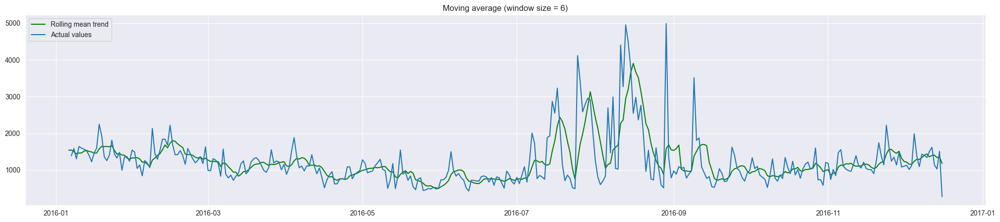

In [189]:
data = energy_per_day.filter(items=['House overall'])
plotMovingAverage(data[:n_samples], window=6)

[[nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]
 [nan]

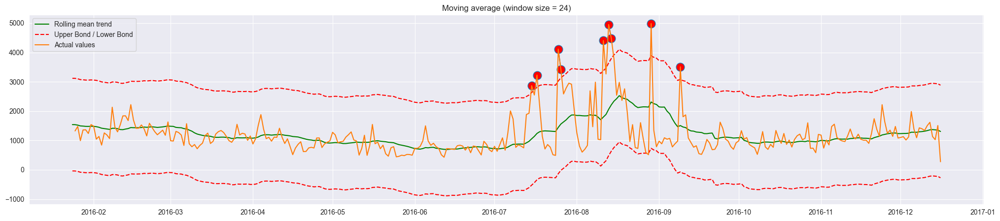

In [190]:
plotMovingAverage(data[:n_samples], window=24, plot_intervals=True ,plot_anomalies=True)

Autocorrelation for 'use' =  0.6121541316198306


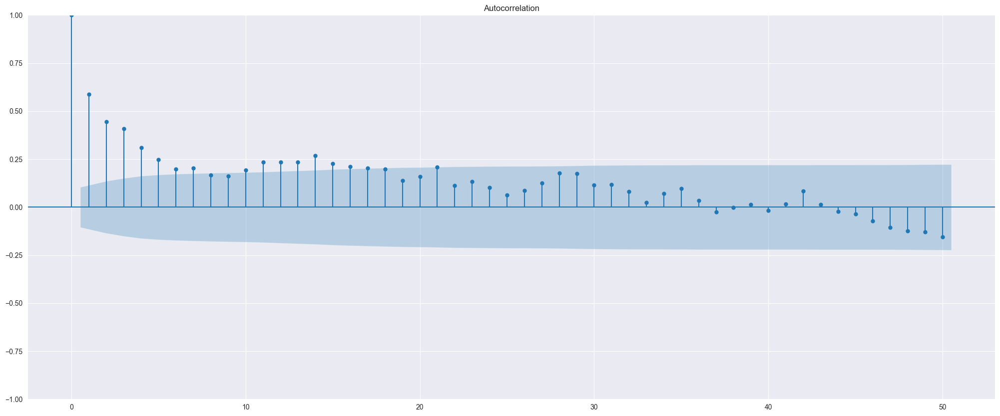

In [191]:
#Autocorrelation plot is used to find the AR parameter p of the ARIMA model
print("Autocorrelation for 'use' = ", energy_per_day2['House overall'].autocorr())
fig= plot_acf(energy_per_day2['House overall'], lags=50)
plt.show()

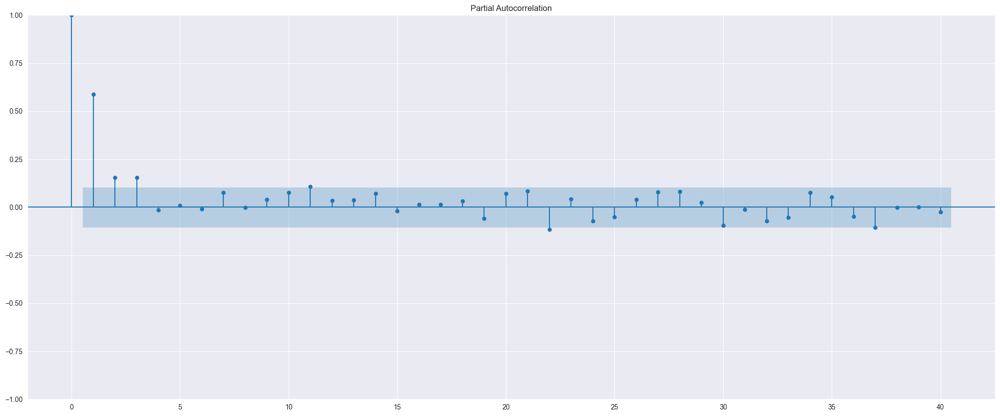

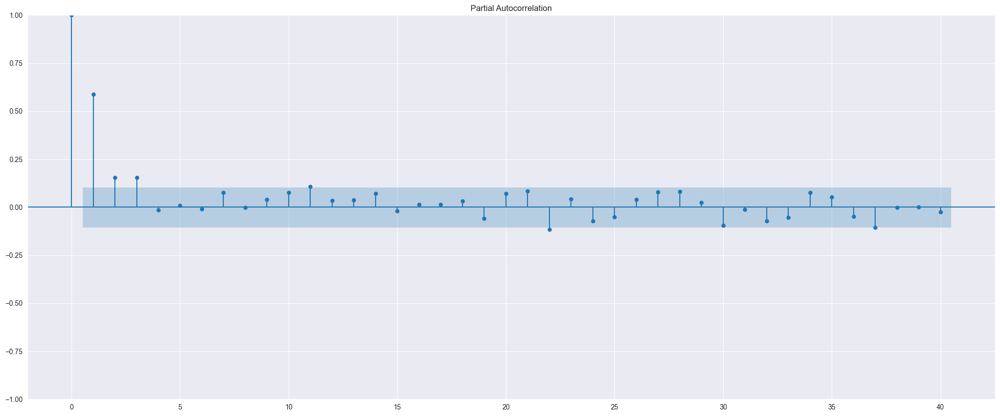

In [192]:
plot_pacf(energy_per_day2['House overall'], lags=40)

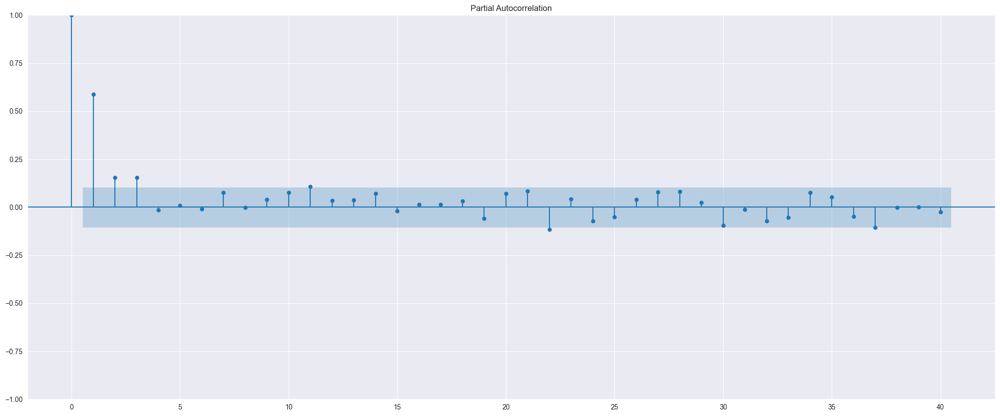

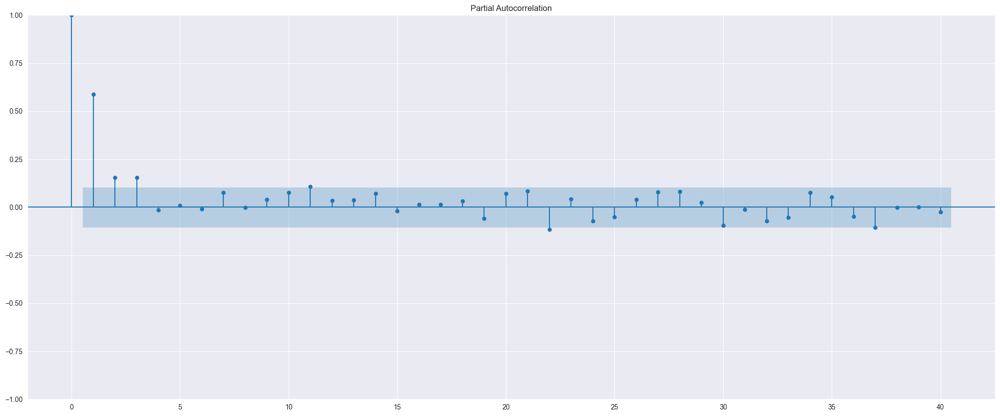

In [193]:
plot_pacf(energy_per_day2['House overall'], lags=40)

Autocorrelation for {}=  0.6121541316198306


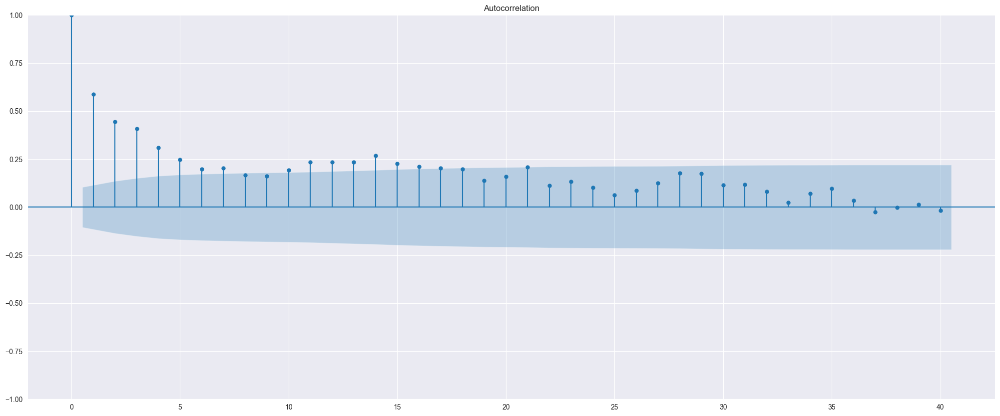

In [194]:
print("Autocorrelation for {}= ",energy_per_day2['House overall'].autocorr())
fig= plot_acf(energy_per_day2['House overall'], lags=40)
plt.show()

Autocorrelation for House overall=  0.7934855648573531


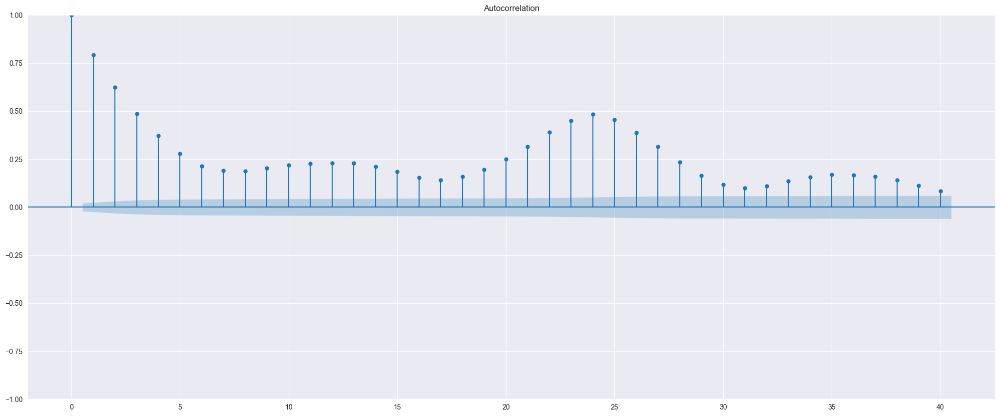

Autocorrelation for Dishwasher=  0.5940846456469162


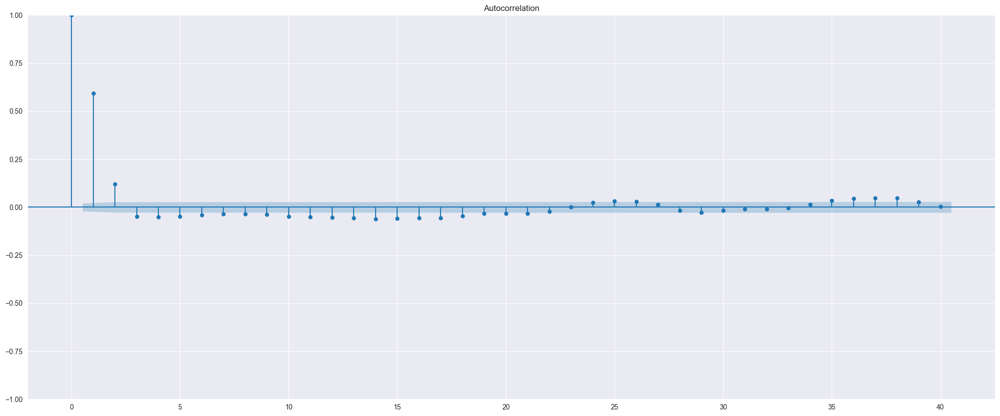

Autocorrelation for Home office=  0.6550747277606208


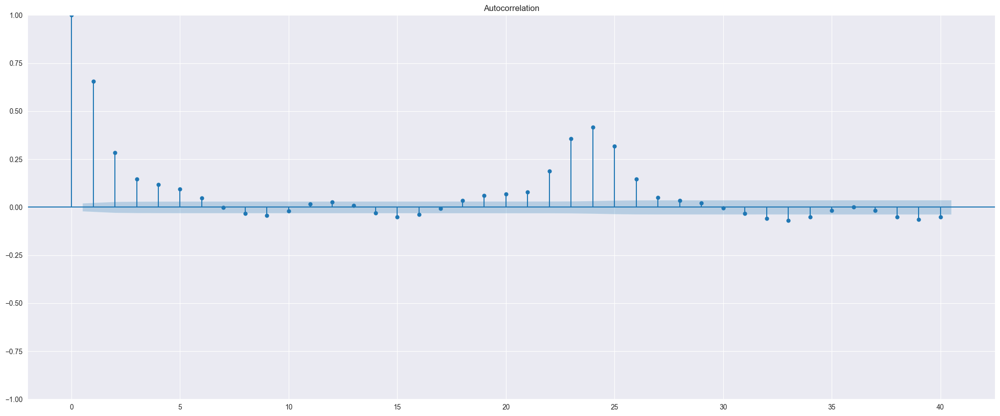

Autocorrelation for Fridge=  -0.14340932464837935


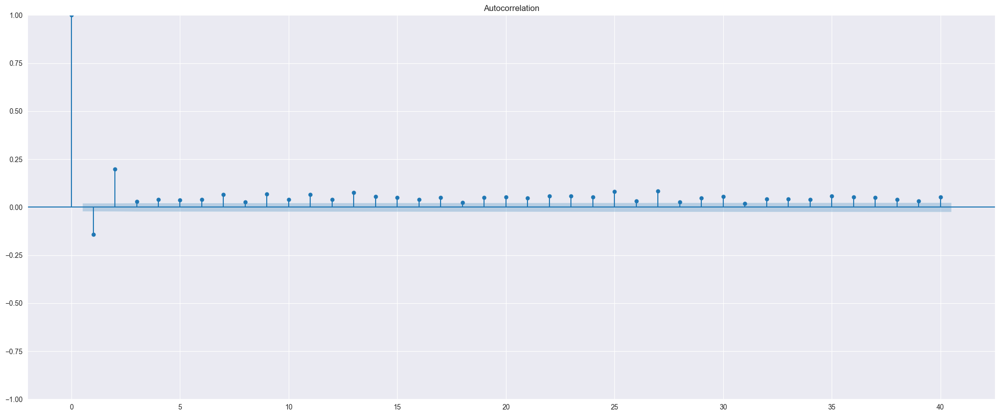

Autocorrelation for Garage door=  0.23984631360266956


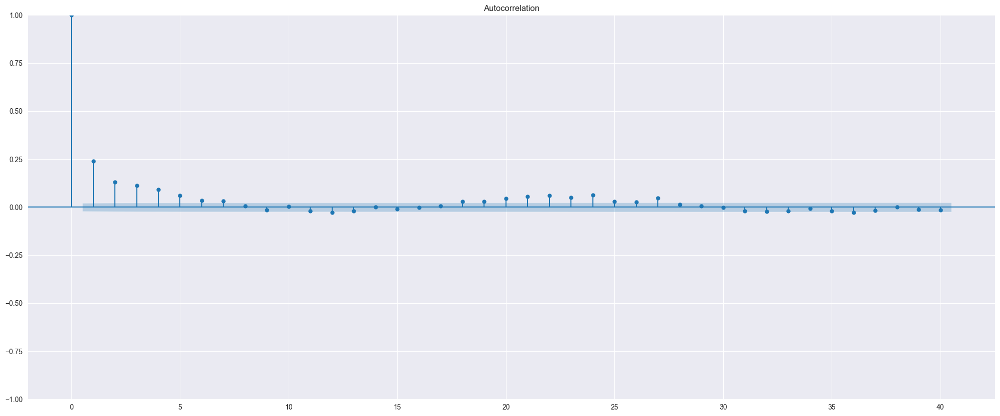

Autocorrelation for Well=  0.18057717517778962


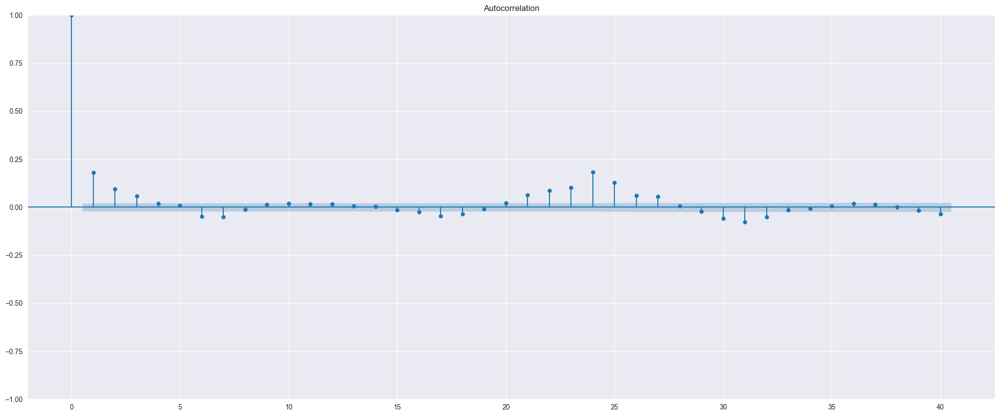

Autocorrelation for Microwave=  0.1109519502774009


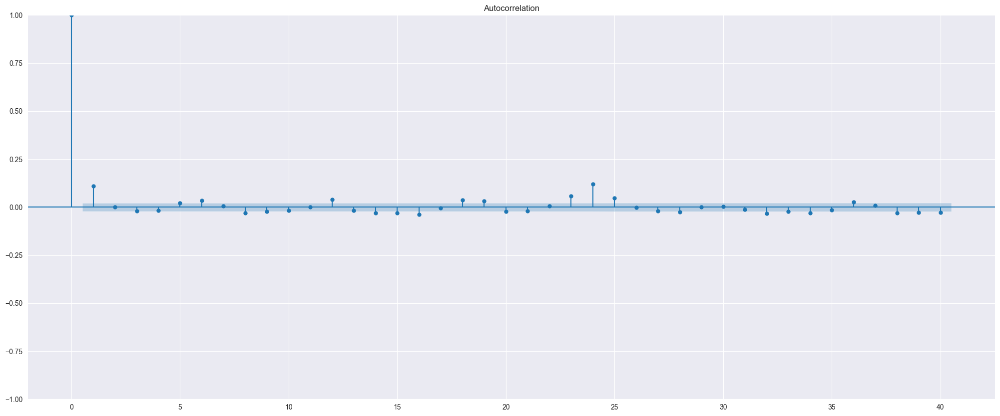

Autocorrelation for Living room=  0.48801346697070247


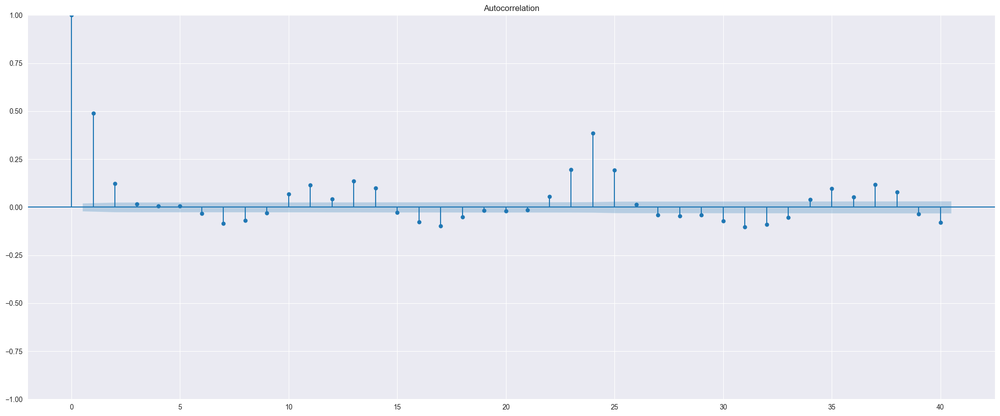

Autocorrelation for Solar=  0.8886657493323239


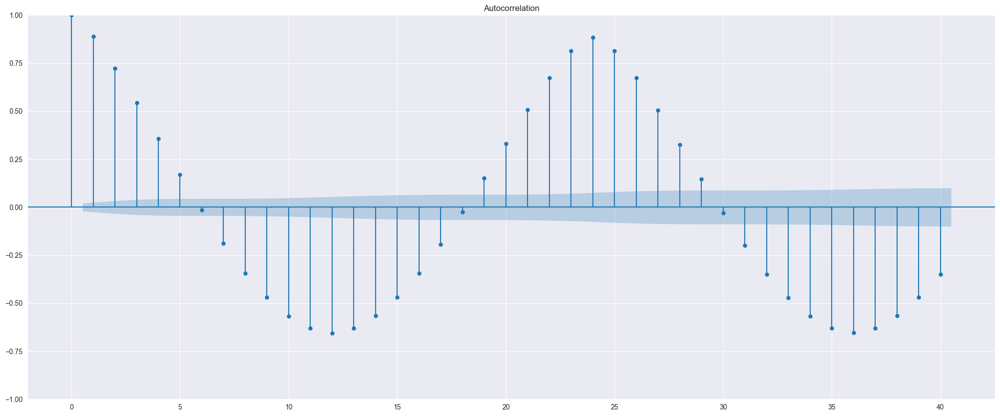

Autocorrelation for Furnace=  0.784883968331148


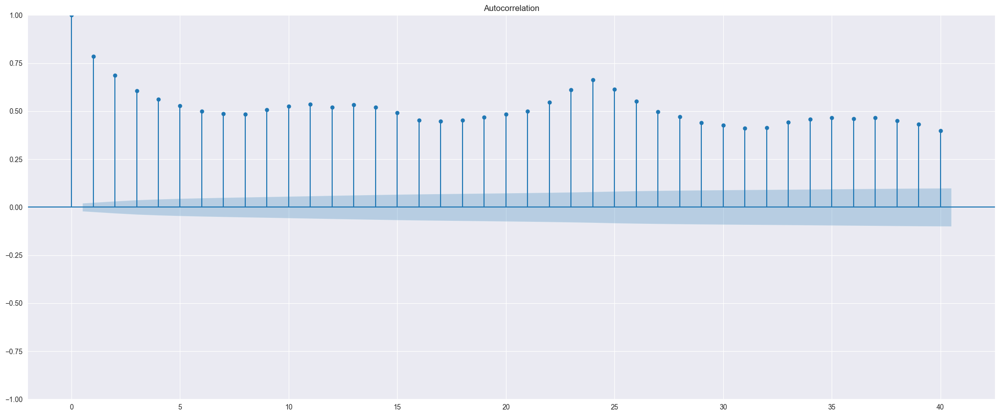

Autocorrelation for Kitchen=  0.18891380989611634


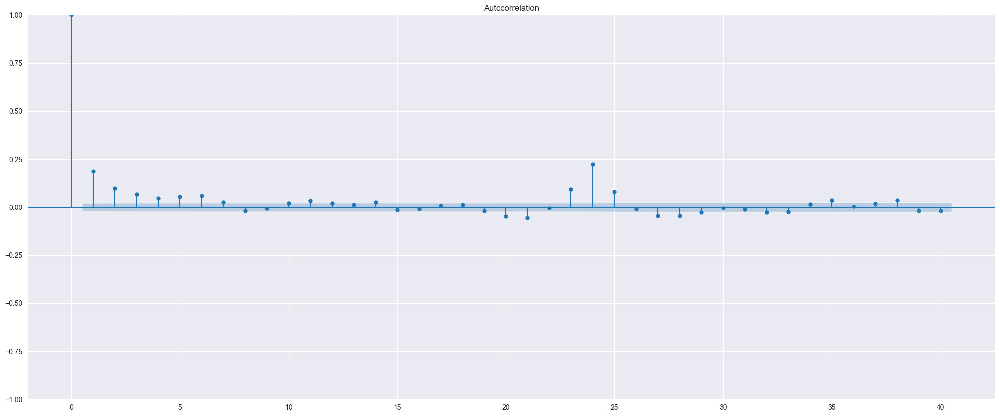

Autocorrelation for temperature=  0.9942025937175332


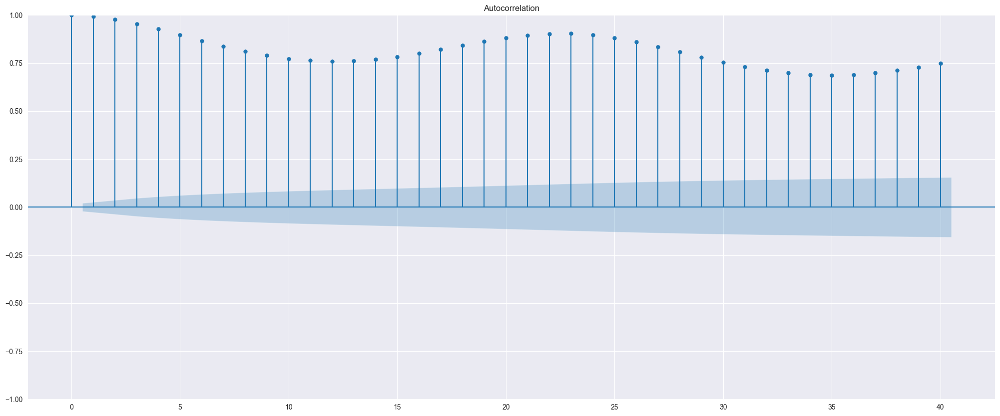

Autocorrelation for humidity=  0.9712519461313212


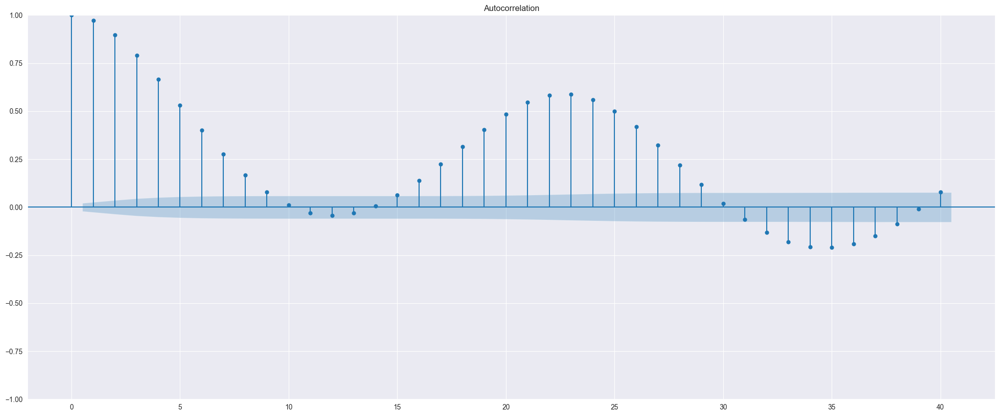

Autocorrelation for pressure=  0.9970334039507315


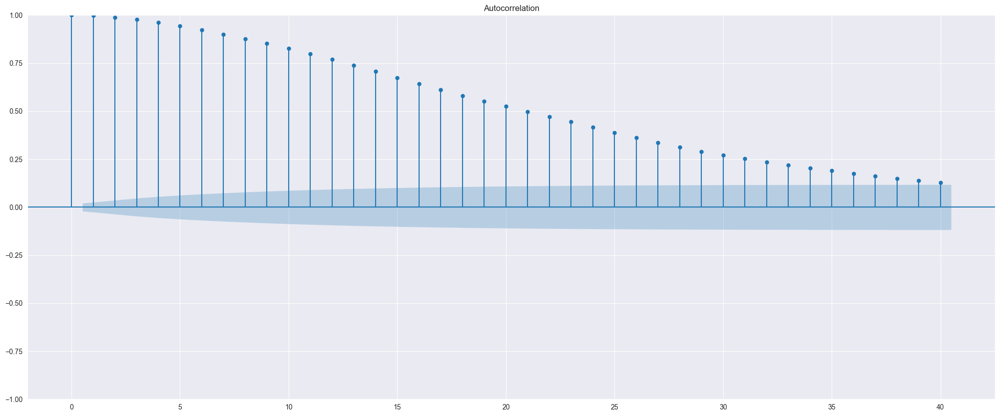

Autocorrelation for windSpeed=  0.926215345386515


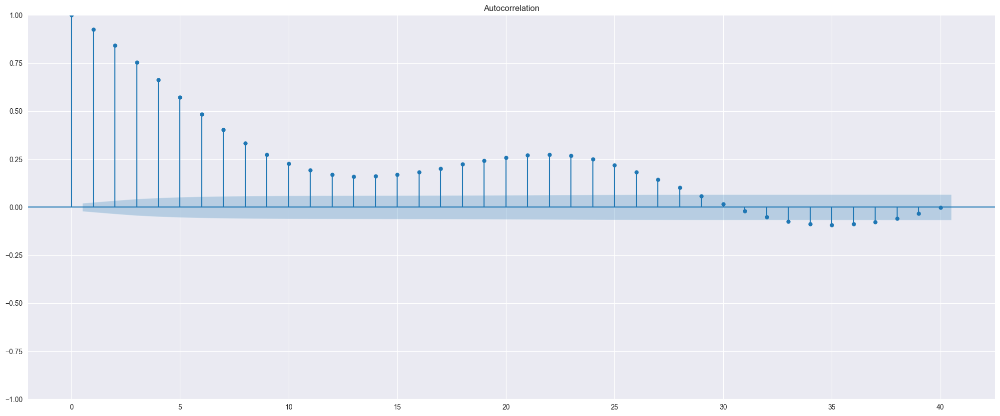

Autocorrelation for dewPoint=  0.9974298507557435


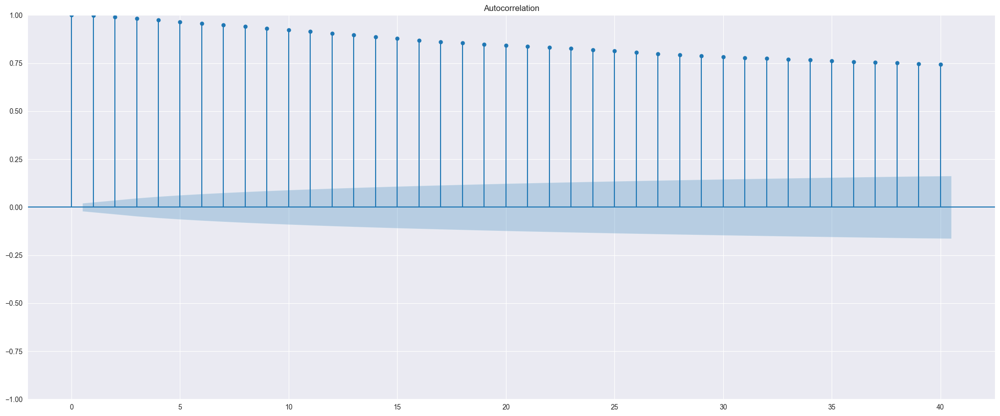

In [195]:
#Autocorrelation plot is used to find the AR parameter p of the ARIMA model

for i in df1.columns:
  print("Autocorrelation for {}= ".format(i),df1[i].autocorr())
  array = np.array(df1[i]).reshape(-1,1)
  fig= plot_acf(df1[i], lags=40)
  plt.show()

In [ ]:
from statsmodels.tsa.arima.model import ARIMA 
from sklearn.metrics import mean_squared_error
import time 
for i in df1.columns:
  array = np.array(df1[i]).reshape(-1,1)
  size = int(len(array) * 0.70)
  train, test = array[0:size], array[size:len(array)]
  history = train.flatten().tolist()
  predictions = list()
  start_time= time.time()
  for t in range(len(test)):    
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t][0]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))

  error = mean_squared_error(test, predictions)
  end_time= time.time()
  time_taken= end_time-start_time
  print('Time taken to train the model in seconds= ',time_taken)
  print('Test MSE: %.3f' % error)
  # plot
  plt.plot(test)
  plt.plot(predictions, color='red')
  plt.show()

predicted=3.333277, expected=3.114966
predicted=3.132526, expected=3.100347
predicted=3.165395, expected=3.050397
predicted=3.138723, expected=3.088403
predicted=3.164371, expected=3.238924
predicted=3.242626, expected=3.201200
predicted=3.193500, expected=3.742001
predicted=3.669156, expected=3.809431
predicted=3.733109, expected=3.117859
predicted=3.139321, expected=2.075821
predicted=2.224090, expected=2.748164
predicted=2.764808, expected=2.111555
predicted=2.260097, expected=2.780539
predicted=2.869793, expected=3.530579
predicted=3.474235, expected=4.092523
predicted=3.878485, expected=3.522439
predicted=3.483430, expected=3.108618
predicted=3.034648, expected=3.129232
predicted=3.087277, expected=3.153896
predicted=3.173258, expected=3.342762
predicted=3.411411, expected=3.821382
predicted=3.783547, expected=4.047796
predicted=3.952191, expected=3.637613
predicted=3.606677, expected=3.310170
predicted=3.311219, expected=3.145687
predicted=3.162312, expected=3.204405
predicted=3.

In [197]:
home_arima_df=df1[0:1000]

predicted=3.829313, expected=3.542155
predicted=3.596993, expected=4.015584
predicted=3.933773, expected=3.832300
predicted=3.815186, expected=5.014214
predicted=4.829240, expected=3.800259
predicted=3.993857, expected=3.712214
predicted=3.631836, expected=3.153608
predicted=3.255824, expected=3.046365
predicted=2.991268, expected=3.376527
predicted=3.597661, expected=2.634197
predicted=2.841198, expected=2.624320
predicted=2.747094, expected=2.689619
predicted=2.709441, expected=3.158270
predicted=3.085761, expected=4.131784
predicted=4.068091, expected=4.829156
predicted=4.636975, expected=4.292851
predicted=4.236167, expected=4.005754
predicted=3.837462, expected=4.218752
predicted=3.974629, expected=3.638981
predicted=3.682138, expected=3.297620
predicted=3.498388, expected=3.113882
predicted=3.226827, expected=3.049493
predicted=3.111241, expected=3.268618
predicted=3.387468, expected=3.147911
predicted=3.247508, expected=3.348485
predicted=3.344161, expected=3.536675
predicted=3.

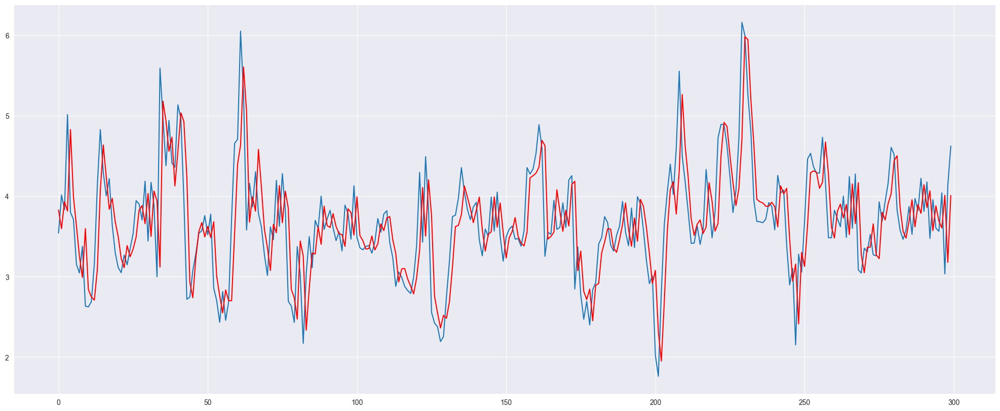

predicted=0.147737, expected=0.132331
predicted=0.130605, expected=0.185983
predicted=0.207896, expected=0.149375
predicted=0.127316, expected=0.144215
predicted=0.155112, expected=0.140112
predicted=0.150594, expected=0.203279
predicted=0.199948, expected=0.178812
predicted=0.162206, expected=0.158526
predicted=0.153688, expected=0.194725
predicted=0.201097, expected=0.163453
predicted=0.146945, expected=0.137222
predicted=0.147836, expected=0.132957
predicted=0.150794, expected=0.138681
predicted=0.144750, expected=0.152788
predicted=0.160143, expected=0.170618
predicted=0.168187, expected=0.160492
predicted=0.149880, expected=0.164895
predicted=0.161360, expected=0.132008
predicted=0.128926, expected=0.079423
predicted=0.090911, expected=0.120519
predicted=0.150548, expected=0.151353
predicted=0.151322, expected=0.114902
predicted=0.105110, expected=0.185504
predicted=0.194392, expected=0.139539
predicted=0.110634, expected=0.155595
predicted=0.154339, expected=0.114901
predicted=0.

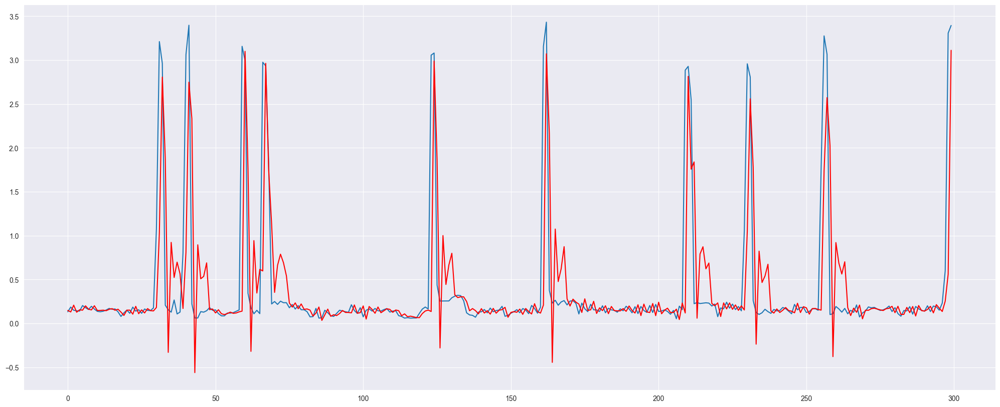

predicted=2.182909, expected=2.096219
predicted=2.006394, expected=2.051321
predicted=2.097222, expected=2.046025
predicted=2.054313, expected=2.037560
predicted=2.052954, expected=2.017680
predicted=2.038354, expected=2.031695
predicted=2.043671, expected=2.037298
predicted=2.035866, expected=2.023289
predicted=2.020628, expected=2.016275
predicted=2.020588, expected=1.942181
predicted=1.940517, expected=1.938341
predicted=1.965048, expected=1.937744
predicted=1.948775, expected=1.938242
predicted=1.943659, expected=1.959681
predicted=1.965991, expected=1.961165
predicted=1.954049, expected=1.961560
predicted=1.958649, expected=1.963042
predicted=1.961554, expected=3.166089
predicted=3.236014, expected=4.927599
predicted=4.625793, expected=2.855766
predicted=1.978605, expected=1.600380
predicted=1.987663, expected=1.599271
predicted=2.094916, expected=1.600271
predicted=1.752968, expected=1.599484
predicted=1.819321, expected=1.598379
predicted=1.683299, expected=1.596413
predicted=1.

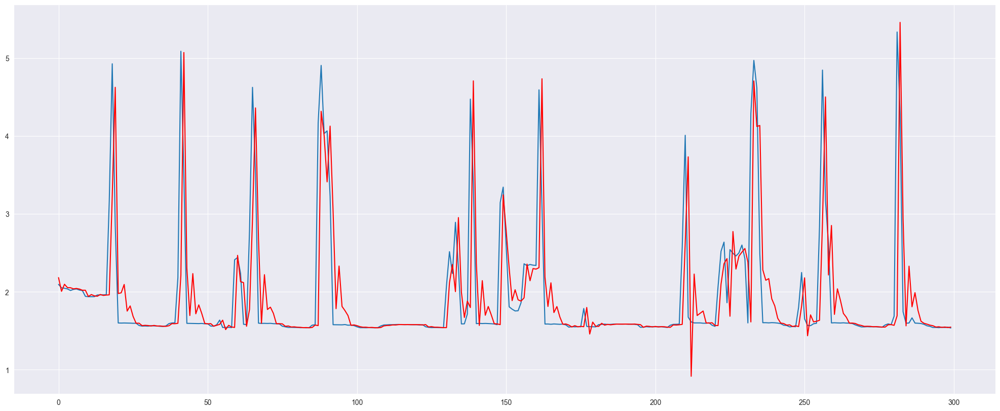

predicted=0.814931, expected=1.468591
predicted=0.712616, expected=0.639448
predicted=1.004896, expected=0.918776
predicted=0.866880, expected=0.630949
predicted=0.873801, expected=0.651768
predicted=0.821484, expected=1.025774
predicted=0.801213, expected=0.623341
predicted=0.846740, expected=1.052574
predicted=0.748072, expected=0.622381
predicted=0.835538, expected=1.497220
predicted=0.726900, expected=0.627495
predicted=1.098592, expected=1.235517
predicted=0.848416, expected=0.610089
predicted=1.030277, expected=0.915564
predicted=0.872499, expected=0.641350
predicted=0.959820, expected=0.566753
predicted=0.796365, expected=0.866670
predicted=0.723596, expected=0.707953
predicted=0.750814, expected=0.624506
predicted=0.771033, expected=0.829298
predicted=0.640268, expected=0.725968
predicted=0.735436, expected=0.673530
predicted=0.771273, expected=0.885245
predicted=0.680402, expected=0.641665
predicted=0.783240, expected=1.485377
predicted=0.687815, expected=0.625837
predicted=1.

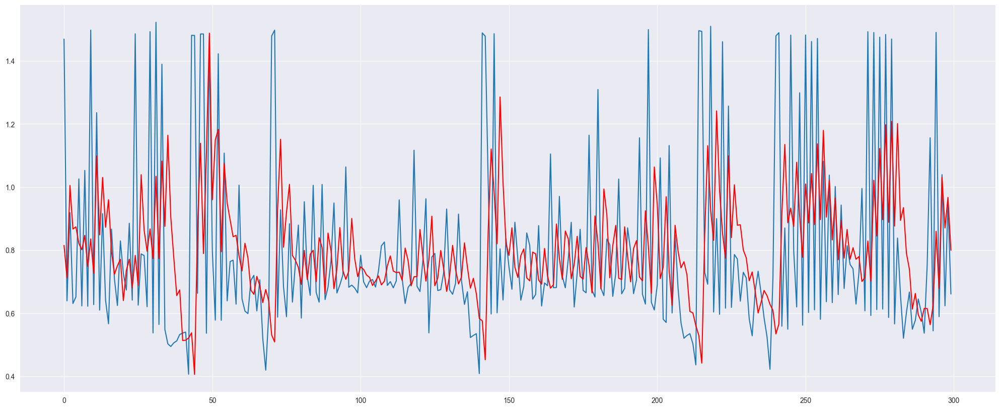

predicted=0.954249, expected=0.926289
predicted=0.921100, expected=0.916235
predicted=0.920294, expected=0.915944
predicted=0.918956, expected=0.912867
predicted=0.916592, expected=1.114617
predicted=0.976417, expected=0.904633
predicted=0.941308, expected=0.915188
predicted=0.941867, expected=0.913374
predicted=0.933037, expected=0.910635
predicted=0.950179, expected=0.910018
predicted=0.940518, expected=0.913720
predicted=0.911691, expected=0.912040
predicted=0.912559, expected=0.915758
predicted=0.913078, expected=1.062161
predicted=0.955581, expected=0.919959
predicted=0.935618, expected=0.919834
predicted=0.937026, expected=0.921381
predicted=0.932770, expected=0.926852
predicted=0.948199, expected=0.925031
predicted=0.943596, expected=0.922244
predicted=0.922399, expected=0.919460
predicted=0.921784, expected=0.919565
predicted=0.922105, expected=0.913773
predicted=0.920243, expected=0.919118
predicted=0.919928, expected=0.918321
predicted=0.918710, expected=0.919591
predicted=0.

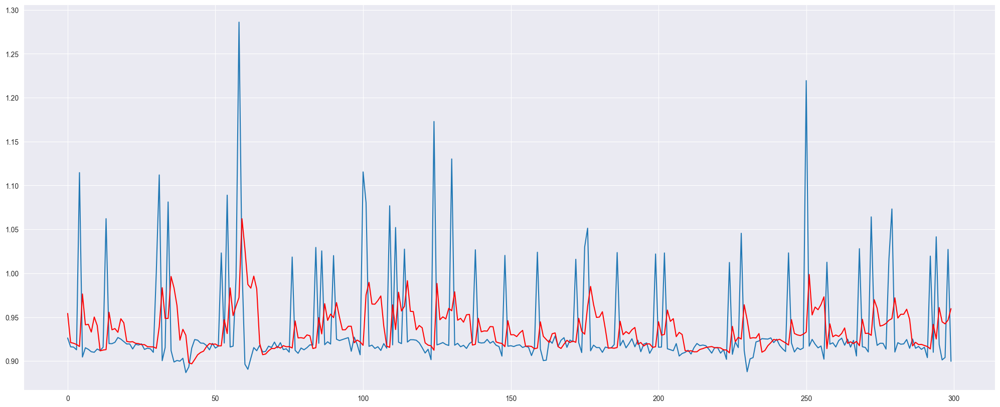

predicted=0.448845, expected=0.386270
predicted=0.390197, expected=0.392499
predicted=0.390258, expected=0.392715
predicted=0.390924, expected=2.199690
predicted=0.797662, expected=0.381406
predicted=0.868662, expected=0.390506
predicted=0.760350, expected=0.390942
predicted=0.569032, expected=0.390469
predicted=0.664900, expected=0.389043
predicted=0.503052, expected=0.374800
predicted=0.386080, expected=0.388896
predicted=0.385783, expected=0.381864
predicted=0.384836, expected=0.382434
predicted=0.384334, expected=1.342670
predicted=0.596967, expected=0.390797
predicted=0.637298, expected=1.333217
predicted=0.790863, expected=0.388307
predicted=0.733819, expected=1.396906
predicted=0.940701, expected=0.391378
predicted=0.819293, expected=0.391487
predicted=0.732042, expected=0.386828
predicted=0.551169, expected=0.392571
predicted=0.538556, expected=0.392967
predicted=0.453550, expected=0.392859
predicted=0.391926, expected=0.386791
predicted=0.390547, expected=0.390068
predicted=0.

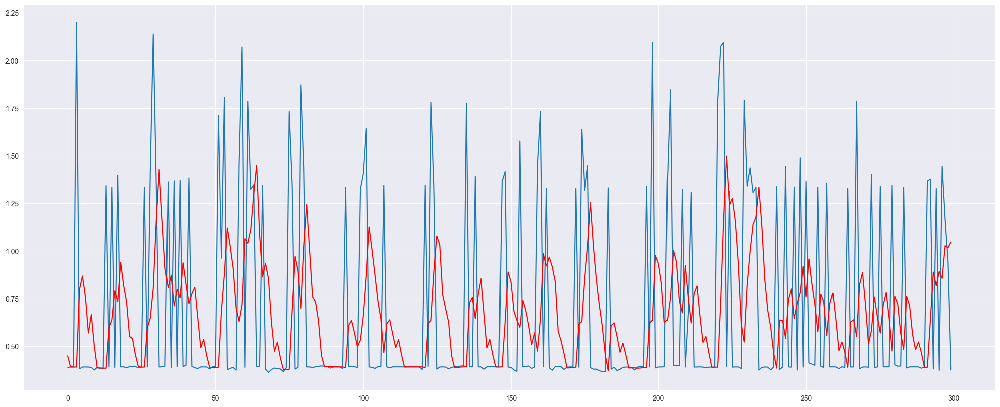

predicted=0.621739, expected=0.627797
predicted=0.622649, expected=0.631636
predicted=0.624085, expected=0.629302
predicted=0.625021, expected=0.633842
predicted=0.627452, expected=0.620048
predicted=0.627300, expected=0.621360
predicted=0.627593, expected=0.621605
predicted=0.627106, expected=0.621101
predicted=0.624544, expected=0.621518
predicted=0.623186, expected=0.618730
predicted=0.620739, expected=0.628839
predicted=0.622306, expected=0.622839
predicted=0.622212, expected=0.619802
predicted=0.621720, expected=0.621691
predicted=0.622677, expected=0.622896
predicted=0.622670, expected=1.264468
predicted=0.731909, expected=0.620986
predicted=0.702518, expected=0.621547
predicted=0.711754, expected=0.621691
predicted=0.767251, expected=0.622194
predicted=0.735892, expected=0.625732
predicted=0.727506, expected=0.629750
predicted=0.623498, expected=0.631288
predicted=0.624991, expected=0.632192
predicted=0.626810, expected=0.626866
predicted=0.627846, expected=0.621389
predicted=0.

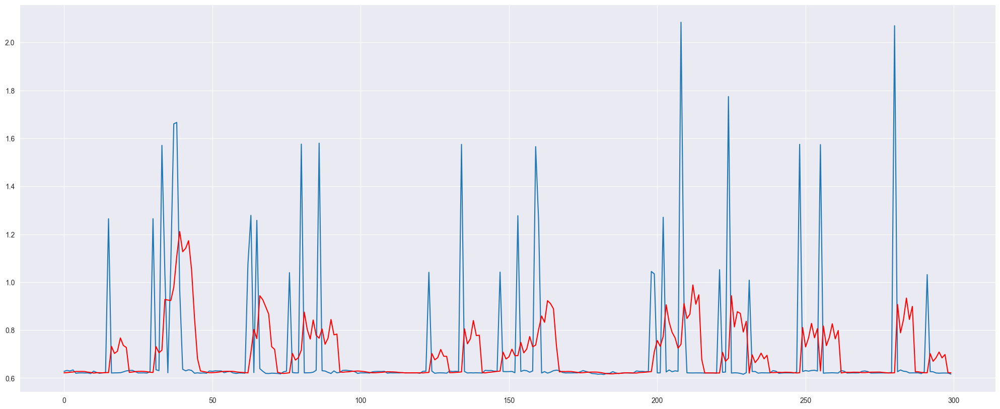

predicted=0.458658, expected=0.453147
predicted=0.455072, expected=0.462581
predicted=0.463837, expected=0.457621
predicted=0.456625, expected=2.610356
predicted=2.248888, expected=0.541466
predicted=0.119683, expected=0.441400
predicted=0.728078, expected=0.443557
predicted=0.701215, expected=0.437604
predicted=0.551893, expected=0.439107
predicted=0.604748, expected=0.424694
predicted=0.435111, expected=0.438444
predicted=0.441424, expected=0.432794
predicted=0.432334, expected=0.436470
predicted=0.436337, expected=1.285604
predicted=1.130597, expected=2.714177
predicted=2.149711, expected=0.790024
predicted=0.421378, expected=0.461435
predicted=0.802529, expected=0.463772
predicted=0.793091, expected=0.456770
predicted=0.662031, expected=0.450890
predicted=0.637546, expected=0.455381
predicted=0.482207, expected=0.459628
predicted=0.459215, expected=0.460206
predicted=0.458737, expected=0.462529
predicted=0.460809, expected=0.454092
predicted=0.453813, expected=0.457965
predicted=0.

KeyboardInterrupt: 

In [198]:
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import time
for i in home_arima_df.columns:
    array= np.array( home_arima_df[i]).reshape(-1,1)
    size = int(len(array) * 0.70)
    train, test = array[0:size], array[size:len(array)]
    history = [x for x in train]
    predictions = list()
    start_time= time.time()
    for t in range(len(test)):
        model = ARIMA(history, order=(5,1,0))
        model_fit = model.fit()
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
    error = mean_squared_error(test, predictions)
    end_time= time.time()
    time_taken= end_time-start_time
    print('Time taken to train the model in seconds= ',time_taken,'-{}'.format(i))
    print('Test MSE: %.3f' % error)
# plot
    plt.plot(test)
    plt.plot(predictions, color='red')
    plt.show()

ThymeBoost

In [195]:
from ThymeBoost import ThymeBoost as tb
boosted_model = tb.ThymeBoost(approximate_splits=True,
                              n_split_proposals=25,
                              verbose=1,
                              cost_penalty=.001)

********** Round 1 **********
Using Split: None
Fitting initial trend globally with trend model:
median()
seasonal model:
fourier(10, False)
cost: -2386.6966785611403
********** Round 2 **********
Using Split: None
Fitting global with trend model:
linear((1, None))
seasonal model:
fourier(10, False)
cost: -2452.235909131136
Boosting Terminated 
Using round 2


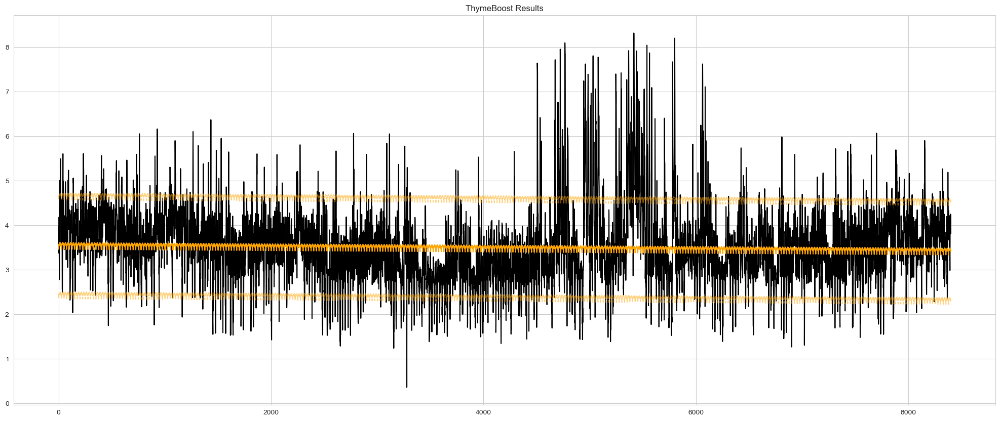

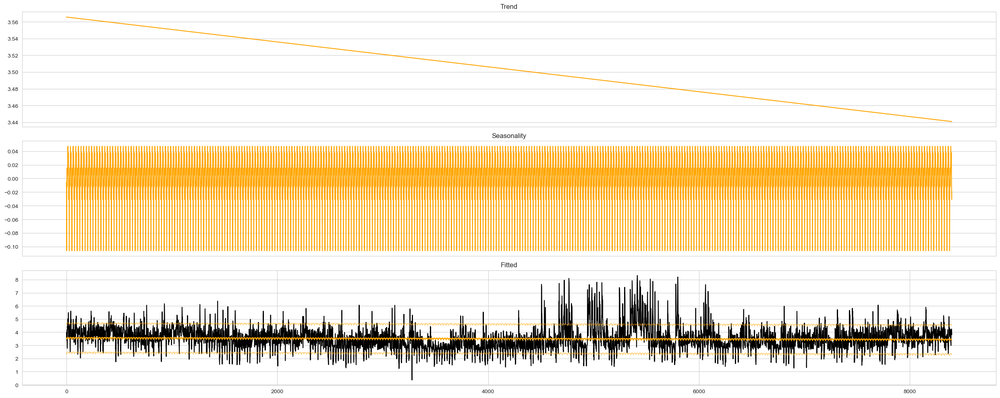

In [197]:
list = df1['House overall'].tolist()
output = boosted_model.fit(list,
                           trend_estimator='linear',
                           seasonal_estimator='fourier',
                           seasonal_period=25,
                           split_cost='mse',
                           global_cost='maicc',
                           fit_type='global')
boosted_model.plot_results(output)
boosted_model.plot_components(output)

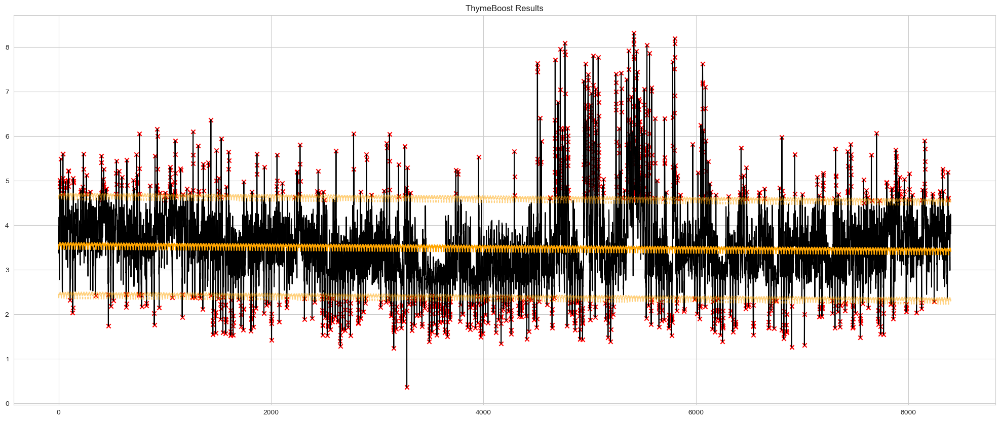

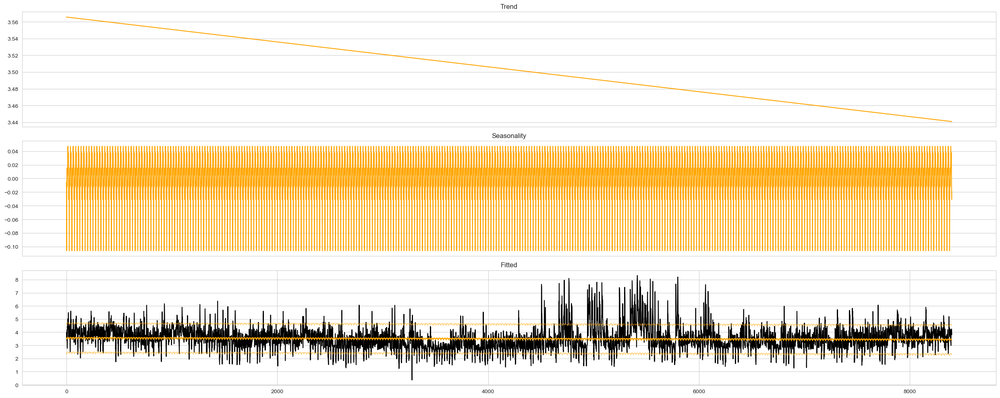

In [198]:
boosted_model = tb.ThymeBoost()
output = boosted_model.detect_outliers(list,
                                       trend_estimator='linear',
                                       seasonal_estimator='fourier',
                                       seasonal_period=25,
                                       global_cost='maicc',
                                       fit_type='global')
boosted_model.plot_results(output)
boosted_model.plot_components(output)

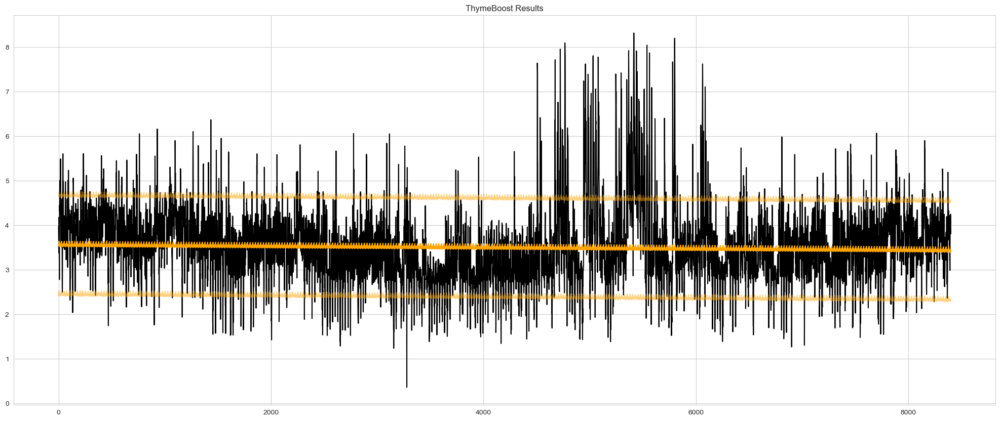

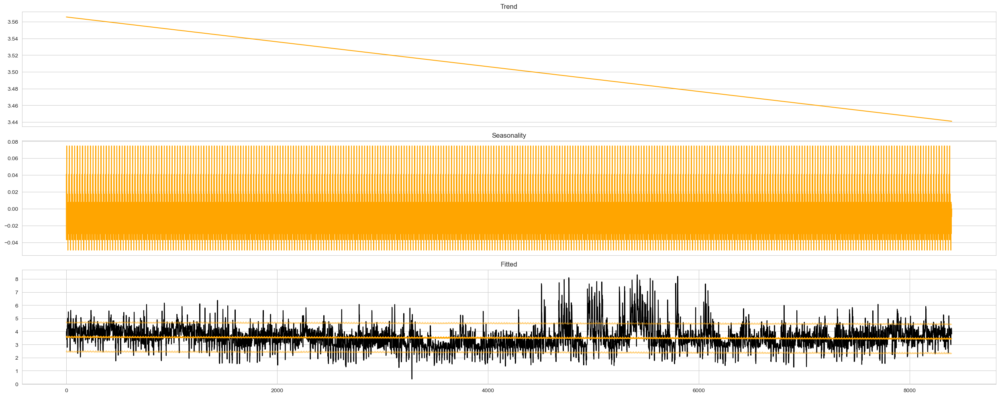

In [199]:
weights = np.invert(output['outliers'].values) * 1
output = boosted_model.fit(list, trend_estimator='linear',
                           seasonal_estimator='fourier',
                           seasonal_period=25,
                           global_cost='maicc',
                           fit_type='global',
                           seasonality_weights=weights)
boosted_model.plot_results(output)
boosted_model.plot_components(output)

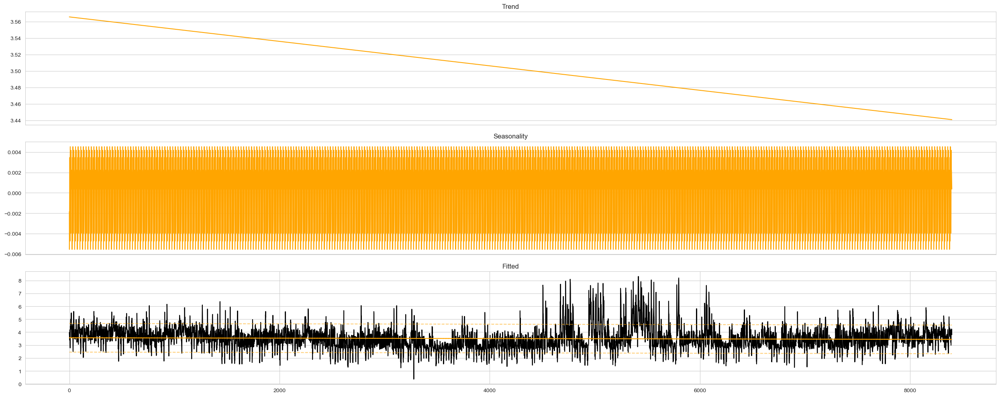

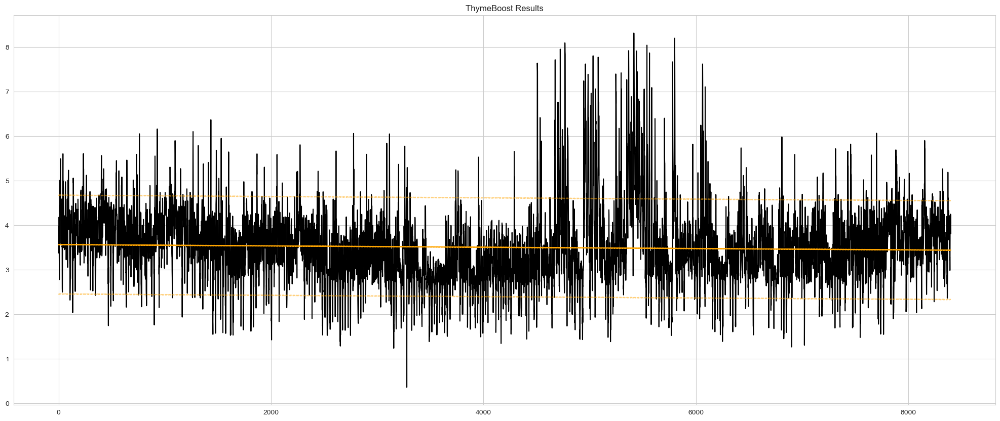

In [200]:
output = boosted_model.fit(list,
                           trend_estimator='linear',
                           seasonal_estimator='fourier',
                           seasonal_period=25,
                           global_cost='maicc',
                           fit_type='global',
                           seasonality_weights='regularize')
boosted_model.plot_components(output)
boosted_model.plot_results(output)

In [201]:
output

,y,yhat,yhat_upper,yhat_lower,seasonality,trend
0,3.971628,3.563793,4.673132,2.454454,-0.001840,3.565633
1,3.805026,3.560072,4.669411,2.450734,-0.005546,3.565618
2,3.500249,3.561220,4.670558,2.451881,-0.004384,3.565603
3,3.861975,3.566649,4.675988,2.457310,0.001061,3.565589
4,3.373443,3.569040,4.678379,2.459702,0.003466,3.565574
...,...,...,...,...,...,...
8394,4.037561,3.443148,4.552487,2.333809,0.002240,3.440908
8395,4.246850,3.442816,4.552154,2.333477,0.001922,3.440893
8396,4.228637,3.442343,4.551682,2.333005,0.001465,3.440879
8397,4.041678,3.441919,4.551258,2.332580,0.001055,3.440864
